# Metadata
```
Author: Alice Bogdan (ucn3qn@virginia.edu)
Course: DS 5001
Date: 3 May 2022
Semester Project
Topic: Gilmore Girls
```

Purpose: Using ETA on Gilmore Girls tv scripts. Analysis of preprocessed data  

Analysis Topics: 
- PCA  
- Topic Models  
- Word Embeddings  
- Sentiment Analysis  
- Food reference dispersion  
- Bigrams for Characters 

# Set Up

In [456]:
#libraries
import pandas as pd
import numpy as np
import nltk
# from sklearn.decomposition import PCA
from scipy.linalg import norm
import plotly.express as px
import seaborn as sns; sns.set()
import re
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from gensim.models import word2vec #word embedding
from sklearn.manifold import TSNE #word embedding
from sklearn.decomposition import LatentDirichletAllocation as LDA #TM
from scipy.linalg import norm
from IPython.display import display, HTML #sentiment analysis
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer #sentiment analysis
import scipy as sp #sentiment analysis
import scipy.fftpack as fftpack #sentiment analysis
from hac2 import HAC #dendrograms

In [2]:
#OHCO structure of DATA
OHCO = ['Season','Episode','line_num','Character','sent_num','token_num']
OHCO_SHOW = ['Show','Season','Episode','line_num','Character','sent_num','token_num']

In [3]:
#reference for convenience
SEAS = OHCO[:1]
EPI = OHCO[:2]
LINE = OHCO[:3]
CHAR = OHCO[:4]
SENT = OHCO[:5]
TOKEN = OHCO[:6]

In [4]:
#gradient colormap 
gradient_cmap = 'YlGnBu'

# Parameters

## Word Embedding

In [5]:
w2v_params = dict(
    min_count = 10,
    workers = 4,
    # vector_size = 246,
    vector_size = 100,
    window = 2    
)

In [6]:
tsne_params = dict(
    learning_rate = 200., #'auto' or [10.0, 1000.0]
    perplexity = 40,
    n_components = 2,
    init = 'random',
    n_iter = 1000,
    random_state = 23    
)

## Sentiment Analysis

In [7]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

# Load Data

In [8]:
data_home = "data"
data_prefix = 'Gilmore_Girls'

In [9]:
import os
import sys

In [10]:
#import libraries in local directory (PCA)
sys.path.append('lib')
import hw07

In [11]:
#import libraries in local directory (Topic Models)
sys.path.append('lib')
from topicmodel import TopicModel

In [12]:
#main data sets
DATA = pd.read_csv(f"{data_home}/output/{data_prefix}-DATA.csv")
VOCAB = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB.csv").set_index('term_str') #with apostrophe (ex: Lukes = luke and s)
VOCAB3 = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB3.csv").set_index('term_str') #VOCAB without ' (ex: Luke's is lukes)
CORPUS2 = pd.read_csv(f"{data_home}/output/{data_prefix}-CORPUS.csv") #standard corpus following OHCO defined above
CHAR_CORPUS = pd.read_csv(f"{data_home}/output/{data_prefix}-CHAR-CORPUS.csv").set_index(['Character','token_num']) #corpus based only characters (not Season, Episode, and lines)

VOCAB_UNIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB-UNIGRAM.csv").set_index('term_str') #sklearn vocab table

In [13]:
#BOWs
BOW = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW.csv").set_index(EPI+['term_str']) #using Raf's code

BOW_CHAR = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW-CHAR.csv").set_index(['Character','term_str']) #specific to characters only (no season, epsiode, etc)
BOW_UNIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW-UNIGRAM.csv").set_index(EPI+['term_str']) #using sklearn (BOW is Season, Episode and using only unigrams)

In [25]:
#bigrams
VOCAB_BIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB-BIGRAM.csv").set_index('term_str') #sklearn vocab table
BOW_BIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW-BIGRAM.csv").set_index(EPI+['term_str']) #using sklearn (BOW is Season, Episode and using only unigrams)
#trigrams
VOCAB_TRIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB-TRIGRAM.csv").set_index('term_str') #sklearn vocab table
BOW_TRIGRAM = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW-TRIGRAM.csv").set_index(EPI+['term_str']) #using sklearn (BOW is Season, Episode and using only unigrams)

In [14]:
#libraries
LIB_SEASON = pd.read_csv(f"{data_home}/output/{data_prefix}-LIB-SEASON.csv")
LIB_EPISODE = pd.read_csv(f"{data_home}/output/{data_prefix}-LIB-EPISODE.csv")

In [15]:
#character info
CHAR_INFO = pd.read_csv(f"{data_home}/output/Character-Info.csv")

In [16]:
#sentiment analysis
salex_csv = '{}/salex/salex_nrc.csv'.format(data_home)

In [17]:
SALEXC = pd.read_csv(f"{data_home}/salex/salex_combo.csv").set_index('term_str')
SALEXC = SALEXC[~SALEXC.index.duplicated()] #two instances of naive for some reason
assert SALEXC.index.is_unique

In [499]:
SALEXC

,nrc_anger,nrc_anticipation,nrc_disgust,nrc_fear,nrc_joy,nrc_negative,nrc_positive,nrc_sadness,nrc_surprise,nrc_trust,nrc_polarity,bing_negative,bing_positive,bing_sentiment,syu_sentiment,gi_sentiment
term_str,,,,,,,,,,,,,,,,
abandon,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.75,-1.0
abandoned,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.50,NaN
abandoner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN
abandonment,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,-1.0,NaN,NaN,NaN,-0.25,-1.0
abandons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zenith,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,0.40,1.0
zest,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.50,1.0
zippy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,NaN,NaN


In [18]:
#remove first column
DATA = DATA[["Season", "Episode", "Title","time_raw","line_num","Character","lines","Year"]]

# Data Prep

In [430]:
CHAR_CORPUS

token_str term_str
Character token_num                   
ADVISOR   0              Rory     rory
          1             where    where
          2                is       is
          3             Paris    paris
          4               She      she
...                       ...      ...
ZACK      25              you      you
          26               re       re
          27             like     like
          28             rich     rich
          29              huh      huh

[1162313 rows x 2 columns]

In [17]:
#create BOW for character words
BOW_CHAR

n
Character term_str   
ADVISOR   a         1
          about     1
          all       1
          almost    1
          are       2
...                ..
ZACK      there     2
          two       1
          well      1
          what      1
          you       1

[139640 rows x 1 columns]

In [19]:
LIB_EPISODE['label'] = LIB_EPISODE.apply(lambda x: f"S{x.Season}xE{x.Episode}-{x.Title[:10]}",1)
LIB_EPISODE

,Show,Season,Num_Episodes_per_Season,Episode,Title,Year,Num_Lines_per_Episode,label
0,Gilmore Girls,1,21,1,The Pilot,2000,630,S1xE1- The Pilot
1,Gilmore Girls,1,21,2,The Lorelai's First Day at Chilton,2000,586,S1xE2- The Lorel
2,Gilmore Girls,1,21,3,k*ll Me Now,2000,698,S1xE3- k*ll Me N
3,Gilmore Girls,1,21,4,The Deer Hunters,2000,717,S1xE4- The Deer
4,Gilmore Girls,1,21,5,Rory's Birthday Parties,2000,753,S1xE5- Rory's Bi
...,...,...,...,...,...,...,...,...
148,Gilmore Girls,7,22,18,Hay Bale Maze,2007,753,S7xE18- Hay Bale
149,Gilmore Girls,7,22,19,It's Just Like Riding A Bike,2007,791,S7xE19- It's Just
150,Gilmore Girls,7,22,20,Lorelai? Lorelai?,2007,699,S7xE20- Lorelai?
151,Gilmore Girls,7,22,21,Unto The Breach,2007,660,S7xE21- Unto The


In [20]:
SALEXC

,nrc_anger,nrc_anticipation,nrc_disgust,nrc_fear,nrc_joy,nrc_negative,nrc_positive,nrc_sadness,nrc_surprise,nrc_trust,nrc_polarity,bing_negative,bing_positive,bing_sentiment,syu_sentiment,gi_sentiment
term_str,,,,,,,,,,,,,,,,
abandon,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.75,-1.0
abandoned,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.50,NaN
abandoner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN
abandonment,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,-1.0,NaN,NaN,NaN,-0.25,-1.0
abandons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zenith,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,0.40,1.0
zest,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.50,1.0
zippy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,NaN,NaN


In [21]:
VOCAB3.sort_values('tfidf_mean', ascending = False).head(10)

,term_rank,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,...,stem_snowball,stem_lancaster,max_pos_group,term_rank2,zipf_k,zipf_k2,tfidf_mean,tfidf_max,tfidf_sum,dfidf
term_str,,,,,,,,,,,,,,,,,,,,,
maze,1739,40,4,0.000034,29057.825000,14.826639,0.000510,NN,1,{'NN'},...,maze,maz,NN,597,69560,23880,0.010841,0.010841,0.010841,2.184691
louie,2125,30,5,0.000026,38743.766667,15.241677,0.000393,NN,1,{'NN'},...,louie,louy,NN,607,63750,18210,0.007794,0.007794,0.007794,2.184691
jug,2366,26,3,0.000022,44704.346154,15.448127,0.000346,NN,1,{'NN'},...,jug,jug,NN,611,61516,15886,0.006632,0.006632,0.006632,2.184691
lynnie,2581,22,6,0.000019,52832.409091,15.689136,0.000297,NNP,2,"{'NNP', 'NN'}",...,lynni,lynny,NN,615,56782,13530,0.006616,0.006616,0.006616,2.184691
poe,2546,23,3,0.000020,50535.347826,15.625005,0.000309,NN,1,{'NN'},...,poe,poe,NN,614,58558,14122,0.006519,0.006519,0.006519,2.184691
renoir,3525,15,6,0.000013,77487.533333,16.241677,0.000210,NN,1,{'NN'},...,renoir,renoir,NN,622,52875,9330,0.004428,0.004428,0.004428,2.184691
birkin,3306,16,6,0.000014,72644.562500,16.148567,0.000222,NNP,1,{'NNP'},...,birkin,birkin,NN,621,52896,9936,0.004378,0.004378,0.004378,2.184691
boozoo,3455,15,6,0.000013,77487.533333,16.241677,0.000210,NN,1,{'NN'},...,boozoo,boozoo,NN,622,51825,9330,0.004260,0.004260,0.004260,2.184691
boils,3511,15,5,0.000013,77487.533333,16.241677,0.000210,NNS,1,{'NNS'},...,boil,boil,NN,622,52665,9330,0.004104,0.004104,0.004104,2.184691


In [22]:
VOCAB_UNIGRAM.sort_values('tfidf_mean', ascending = False).head(10)

,n,n_chars,n_tokens,tfidf_mean,df,dfidf
term_str,,,,,,
just,7858,4,1,0.200430,153,0.0
oh,7535,2,1,0.191832,153,0.0
know,7417,4,1,0.189072,153,0.0
don,6597,3,1,0.168316,153,0.0
okay,5499,4,1,0.141075,153,0.0
like,5100,4,1,0.129994,153,0.0
ll,4867,2,1,0.124778,153,0.0
yeah,4661,4,1,0.118518,153,0.0
good,4073,4,1,0.103946,153,0.0


In [23]:
#add show name to corpus structure. Trying to see if it will help analysis to review from a show level versus season/episode/character
CORPUS_SHOW = CORPUS2.copy()
CORPUS_SHOW[OHCO_SHOW[:1]] = 'Gilmore_Girls'
CORPUS_SHOW = CORPUS_SHOW.set_index(OHCO_SHOW)
CORPUS_SHOW

pos_tuple  \
Show          Season Episode line_num Character sent_num token_num                     
Gilmore_Girls 1      1       5        LORELAI   0        0          ('Please', 'VB')   
                                                         1            ('Luke', 'NN')   
                                                1        0          ('Please', 'VB')   
                                                         1          ('please', 'NN')   
                                                         2          ('please', 'NN')   
...                                                                              ...   
              7      22      810      LORELAI   0        8          ('your', 'PRP$')   
                                                         9           ('stuff', 'NN')   
                             811      RORY      0        0              ('I', 'PRP')   
                                                         1           ('guess', 'NN')   
                                                         2              ('so', 'RB')   

                                                                     pos  \
Show          Season Episode line_num Character sent_num token_num         
Gilmore_Girls 1      1       5        LORELAI   0        0            VB   
                                                         1            NN   
                                                1        0            VB   
                                                         1            NN   
                                                         2            NN   
...                                                                  ...   
              7      22      810      LORELAI   0        8          PRP$   
                                                         9            NN   
                             811      RORY      0        0           PRP   
                                                         1            NN   
                                                         2            RB   

                                                                   token_str  \
Show          Season Episode line_num Character sent_num token_num             
Gilmore_Girls 1      1       5        LORELAI   0        0            Please   
                                                         1              Luke   
                                                1        0            Please   
                                                         1            please   
                                                         2            please   
...                                                                      ...   
              7      22      810      LORELAI   0        8              your   
                                                         9             stuff   
                             811      RORY      0        0                 I   
                                                         1             guess   
                                                         2                so   

                                                                   term_str  \
Show          Season Episode line_num Character sent_num token_num            
Gilmore_Girls 1      1       5        LORELAI   0        0           please   
                                                         1             luke   
                                                1        0           please   
                                                         1           please   
                                                         2           please   
...                                                                     ...   
              7      22      810      LORELAI   0        8             your   
                                                         9            stuff   
                             811      RORY      0        0                i   
                               

In [24]:
#create BOW for CORPUS_SHOW
BOW_SHOW = CORPUS_SHOW.groupby(['Show','term_str']).term_str.count().to_frame('n')
BOW_SHOW

n
Show          term_str     
Gilmore_Girls 0           6
              00        134
              000        42
              002         1
              005         1
...                     ...
              é           1
              état        2
              étoile      2
              êtes        1
              être        1

[25611 rows x 1 columns]

# Who Spoke the Most?

In [26]:
DOC_CHAR = CORPUS2.reset_index()
DOC_CHAR = pd.DataFrame(index = DOC_CHAR.Character).reset_index()
DOC_CHAR = DOC_CHAR.drop_duplicates()

In [27]:
char_n_tokens = BOW_CHAR.groupby('Character')['n'].sum()
char_n_tokens = pd.DataFrame(char_n_tokens)

In [28]:
DOC_CHAR = DOC_CHAR.join(char_n_tokens['n'], on = 'Character').sort_values('n', ascending = False)
DOC_CHAR = DOC_CHAR[['Character','n']].head(10).sort_values('n', ascending = True)

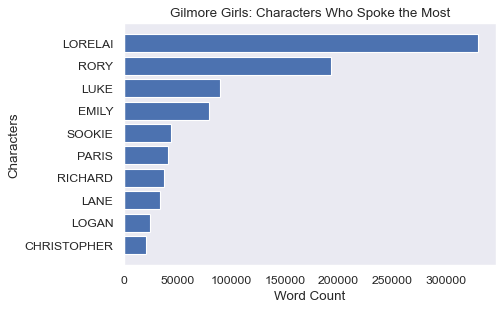

In [622]:
plt.figure(figsize=(6, 4), dpi=80)
plt.barh(DOC_CHAR['Character'],DOC_CHAR['n'])
plt.title('Gilmore Girls: Characters Who Spoke the Most')
plt.ylabel('Characters')
plt.xlabel('Word Count')
plt.grid(False)
#plt.savefig('TokenFreqMC.png')
plt.show()

# PCA

In [30]:
#parameters
norm_docs = True # L2 norming (normalize tfidf table)
center_by_mean = False 
center_by_variance = False # Not supposed to ... Exaggerates significance of rare words
n_terms = 1000 # Number of significant words; feature space
k = 6 # Number of components
pos_list = "NN NNS".split()

## Reduce TFIDF to top 1000 words

In [31]:
#reduce vocab to top 1000 words
SIGS = VOCAB3.sort_values('dfidf', ascending = False).head(n_terms).index

In [32]:
TFIDF = BOW.tfidf.unstack(fill_value = 0)

In [33]:
#reduce tfidf to top 1000 words
TFIDF_SIGS = TFIDF[SIGS]
TFIDF_SIGS

term_str         chicken     given    french     voice  shopping        10  \
Season Episode                                                               
1      1        0.000077  0.000000  0.000077  0.000077  0.000000  0.000000   
       2        0.000000  0.000000  0.000162  0.000000  0.000081  0.000243   
       3        0.000000  0.000071  0.000143  0.000000  0.000000  0.000000   
       4        0.000135  0.000135  0.000068  0.000000  0.000338  0.000000   
       5        0.000000  0.000000  0.000066  0.000000  0.000397  0.000066   
...                  ...       ...       ...       ...       ...       ...   
7      18       0.000054  0.000000  0.000054  0.000000  0.000000  0.000000   
       19       0.000271  0.000000  0.000000  0.000000  0.000054  0.000217   
       20       0.000000  0.000000  0.000063  0.000063  0.000188  0.000063   
       21       0.000000  0.000061  0.000000  0.000184  0.000000  0.000000   
       22       0.000000  0.000294  0.000000  0.000000  0.000059  0.000000   

term_str               5   perhaps    simple     pants  ...    camera  \
Season Episode                                          ...             
1      1        0.000077  0.000000  0.000000  0.000000  ...  0.000000   
       2        0.000000  0.000000  0.000081  0.000000  ...  0.000000   
       3        0.000000  0.000000  0.000143  0.000000  ...  0.000000   
       4        0.000068  0.000000  0.000135  0.000000  ...  0.000000   
       5        0.000066  0.000000  0.000066  0.000000  ...  0.000000   
...                  ...       ...       ...       ...  ...       ...   
7      18       0.000108  0.000054  0.000000  0.000160  ...  0.000000   
       19       0.000054  0.000000  0.000000  0.000053  ...  0.000000   
       20       0.000000  0.000000  0.000000  0.000000  ...  0.000000   
       21       0.000000  0.000000  0.000000  0.000000  ...  0.000097   
       22       0.000059  0.000059  0.000000  0.000000  ...  0.000000   

term_str        assumed        cd  falling  helped         9     steal  \
Season Episode                                                           
1      1        0.00000  0.000245      0.0     0.0  0.000000  0.000000   
       2        0.00000  0.000000      0.0     0.0  0.000000  0.000000   
       3        0.00000  0.000000      0.0     0.0  0.000000  0.000000   
       4        0.00000  0.000000      0.0     0.0  0.000000  0.000000   
       5        0.00021  0.000000      0.0     0.0  0.000000  0.000000   
...                 ...       ...      ...     ...       ...       ...   
7      18       0.00000  0.000000      0.0     0.0  0.000086  0.000086   
       19       0.00000  0.000086      0.0     0.0  0.000086  0.000000   
       20       0.00000  0.000000      0.0     0.0  0.000100  0.000000   
       21       0.00000  0.000000      0.0     0.0  0.000000  0.000097   
       22       0.00000  0.000000      0.0     0.0  0.000000  0.000000   

term_str           crowd   dinners     saved  
Season Episode                                
1      1        0.000000  0.000122  0.000000  
       2        0.000129  0.000000  0.000000  
       3        0.000226  0.000000  0.000000  
       4        0.000107  0.000000  0.000107  
       5        0.000000  0.000105  0.000000  
...                  ...       ...       ...  
7      18       0.000000  0.000000  0.000000  
       19       0.000000  0.000000  0.000000  
       20       0.000100  0.000000  0.000000  
       21       0.000097  0.000000  0.000000  
       22       0.000000  0.000187  0.000000  

[153 rows x 1000 columns]

## Reduce TFIDF to top 1000 nouns

In [34]:
#subset to top 1000 nouns
VIDX = VOCAB3.loc[VOCAB3.max_pos.isin(pos_list)]\
    .sort_values('dfidf', ascending = False)\
    .head(n_terms).index

In [35]:
#reduce tfidf to top 100 nouns
TFIDF_N = TFIDF[VIDX]
TFIDF_N

term_str        shopping   chicken     voice    simple  history     pants  \
Season Episode                                                              
1      1        0.000000  0.000077  0.000077  0.000000  0.00000  0.000000   
       2        0.000081  0.000000  0.000000  0.000081  0.00008  0.000000   
       3        0.000000  0.000000  0.000000  0.000143  0.00000  0.000000   
       4        0.000338  0.000135  0.000000  0.000135  0.00000  0.000000   
       5        0.000397  0.000000  0.000000  0.000066  0.00000  0.000000   
...                  ...       ...       ...       ...      ...       ...   
7      18       0.000000  0.000054  0.000000  0.000000  0.00016  0.000160   
       19       0.000054  0.000271  0.000000  0.000000  0.00016  0.000053   
       20       0.000188  0.000000  0.000063  0.000000  0.00000  0.000000   
       21       0.000000  0.000000  0.000184  0.000000  0.00000  0.000000   
       22       0.000059  0.000000  0.000000  0.000000  0.00000  0.000000   

term_str        terrific      cake  schedule  experience  ...  master  \
Season Episode                                            ...           
1      1        0.000000  0.000227  0.000000    0.000000  ...     0.0   
       2        0.000000  0.000000  0.000000    0.000000  ...     0.0   
       3        0.000000  0.000280  0.000000    0.000000  ...     0.0   
       4        0.000000  0.000000  0.000000    0.000133  ...     0.0   
       5        0.000000  0.000065  0.000065    0.000130  ...     0.0   
...                  ...       ...       ...         ...  ...     ...   
7      18       0.000000  0.000000  0.000213    0.000053  ...     0.0   
       19       0.000000  0.000000  0.000000    0.000053  ...     0.0   
       20       0.000123  0.000308  0.000000    0.000123  ...     0.0   
       21       0.000060  0.000241  0.000000    0.000000  ...     0.0   
       22       0.000058  0.000000  0.000000    0.000058  ...     0.0   

term_str           walls      mock  folks    scotch      wise   awkward  \
Season Episode                                                            
1      1        0.000000  0.000000    0.0  0.000000  0.000000  0.000000   
       2        0.000153  0.000000    0.0  0.000000  0.000000  0.000000   
       3        0.000000  0.000000    0.0  0.000000  0.000000  0.000000   
       4        0.000000  0.000000    0.0  0.000127  0.000000  0.000000   
       5        0.000000  0.000125    0.0  0.000125  0.000000  0.000000   
...                  ...       ...    ...       ...       ...       ...   
7      18       0.000000  0.000000    0.0  0.000000  0.000102  0.000000   
       19       0.000000  0.000000    0.0  0.000000  0.000307  0.000204   
       20       0.000000  0.000000    0.0  0.000000  0.000237  0.000000   
       21       0.000000  0.000000    0.0  0.000000  0.000116  0.000116   
       22       0.000000  0.000000    0.0  0.000000  0.000000  0.000000   

term_str            lets    mirror      rats  
Season Episode                                
1      1        0.000000  0.000000  0.000000  
       2        0.000000  0.000153  0.000000  
       3        0.000000  0.000134  0.000000  
       4        0.000000  0.000000  0.000000  
       5        0.000000  0.000000  0.000125  
...                  ...       ...       ...  
7      18       0.000000  0.000000  0.000000  
       19       0.000102  0.000000  0.000000  
       20       0.000118  0.000000  0.000000  
       21       0.000000  0.000000  0.000000  
       22       0.000111  0.000000  0.000000  

[153 rows x 1000 columns]

## Create DOC table

In [36]:
#create DOC table
LIB_EPISODE = LIB_EPISODE.reset_index()
LIB_EPISODE['SEASON'] = LIB_EPISODE['Season'] #add extra column for season to reference in plots
LIB_EPISODE['EPISODE'] = LIB_EPISODE['Episode'] #add extra column for episode to reference in plots
LIB_EPISODE = LIB_EPISODE.set_index(EPI)
LIB_EPIOSDE = LIB_EPISODE[['Show','Num_Episodes_per_Season','Title','Year','Num_Lines_per_Episode','label','SEASON','EPISODE']]
LIB_EPISODE

index           Show  Num_Episodes_per_Season  \
Season Episode                                                  
1      1            0  Gilmore Girls                       21   
       2            1  Gilmore Girls                       21   
       3            2  Gilmore Girls                       21   
       4            3  Gilmore Girls                       21   
       5            4  Gilmore Girls                       21   
...               ...            ...                      ...   
7      18         148  Gilmore Girls                       22   
       19         149  Gilmore Girls                       22   
       20         150  Gilmore Girls                       22   
       21         151  Gilmore Girls                       22   
       22         152  Gilmore Girls                       22   

                                              Title  Year  \
Season Episode                                              
1      1                                  The Pilot  2000   
       2         The Lorelai's First Day at Chilton  2000   
       3                                k*ll Me Now  2000   
       4                           The Deer Hunters  2000   
       5                    Rory's Birthday Parties  2000   
...                                             ...   ...   
7      18                             Hay Bale Maze  2007   
       19              It's Just Like Riding A Bike  2007   
       20                         Lorelai? Lorelai?  2007   
       21                           Unto The Breach  2007   
       22                                Bon Voyage  2007   

                Num_Lines_per_Episode              label  SEASON  EPISODE  
Season Episode                                                             
1      1                          630   S1xE1- The Pilot       1        1  
       2                          586   S1xE2- The Lorel       1        2  
       3                          698   S1xE3- k*ll Me N       1        3  
       4                          717   S1xE4- The Deer        1        4  
       5                          753   S1xE5- Rory's Bi       1        5  
...                               ...                ...     ...      ...  
7      18                         753  S7xE18- Hay Bale        7       18  
       19                         791  S7xE19- It's Just       7       19  
       20                         699  S7xE20- Lorelai?        7       20  
       21                         660  S7xE21- Unto The        7       21  
       22                         728  S7xE22- Bon Voyag       7       22  

[153 rows x 9 columns]

In [37]:
#include Title and label (information) from LIB to add to DOC table
lib_cols = "SEASON EPISODE Year Title label".split()

In [38]:
DOC_PCA = pd.DataFrame(index = TFIDF.index)

In [39]:
#do not collapse table. Keep index as EPI (OHCO[:2])
DOC_PCA = DOC_PCA.join(LIB_EPISODE[lib_cols], on = EPI)
DOC_PCA

SEASON  EPISODE  Year                                Title  \
Season Episode                                                               
1      1             1        1  2000                            The Pilot   
       2             1        2  2000   The Lorelai's First Day at Chilton   
       3             1        3  2000                          k*ll Me Now   
       4             1        4  2000                     The Deer Hunters   
       5             1        5  2000              Rory's Birthday Parties   
...                ...      ...   ...                                  ...   
7      18            7       18  2007                        Hay Bale Maze   
       19            7       19  2007         It's Just Like Riding A Bike   
       20            7       20  2007                    Lorelai? Lorelai?   
       21            7       21  2007                      Unto The Breach   
       22            7       22  2007                           Bon Voyage   

                            label  
Season Episode                     
1      1         S1xE1- The Pilot  
       2         S1xE2- The Lorel  
       3         S1xE3- k*ll Me N  
       4         S1xE4- The Deer   
       5         S1xE5- Rory's Bi  
...                           ...  
7      18       S7xE18- Hay Bale   
       19       S7xE19- It's Just  
       20       S7xE20- Lorelai?   
       21       S7xE21- Unto The   
       22       S7xE22- Bon Voyag  

[153 rows x 5 columns]

In [40]:
DOC_PCA['mean_tfidf'] = TFIDF.mean(1)
DOC_PCA['n_tokens'] = BOW.groupby(OHCO[:2]).n.sum()
DOC_PCA

SEASON  EPISODE  Year                                Title  \
Season Episode                                                               
1      1             1        1  2000                            The Pilot   
       2             1        2  2000   The Lorelai's First Day at Chilton   
       3             1        3  2000                          k*ll Me Now   
       4             1        4  2000                     The Deer Hunters   
       5             1        5  2000              Rory's Birthday Parties   
...                ...      ...   ...                                  ...   
7      18            7       18  2007                        Hay Bale Maze   
       19            7       19  2007         It's Just Like Riding A Bike   
       20            7       20  2007                    Lorelai? Lorelai?   
       21            7       21  2007                      Unto The Breach   
       22            7       22  2007                           Bon Voyage   

                            label  mean_tfidf  n_tokens  
Season Episode                                           
1      1         S1xE1- The Pilot    0.000006      5667  
       2         S1xE2- The Lorel    0.000006      5389  
       3         S1xE3- k*ll Me N    0.000007      6123  
       4         S1xE4- The Deer     0.000007      6459  
       5         S1xE5- Rory's Bi    0.000006      6599  
...                           ...         ...       ...  
7      18       S7xE18- Hay Bale     0.000009      8061  
       19       S7xE19- It's Just    0.000006      8052  
       20       S7xE20- Lorelai?     0.000007      6958  
       21       S7xE21- Unto The     0.000007      7120  
       22       S7xE22- Bon Voyag    0.000007      7423  

[153 rows x 7 columns]

## Compute PCA
Don't normalize mean and variance because of language (dramatically scales up the weights of rare words)

### PCA: Top 1000 words

In [41]:
#top 1000 words
LOADINGS, DCM, COMPINF = hw07.get_pca(TFIDF_SIGS, norm_docs = True, center_by_mean = False, center_by_variance = False)

In [440]:
#save output
# LOADINGS.to_csv(f'{data_home}/output/{data_prefix}-LOADINGS.csv')
# DCM.to_csv(f'{data_home}/output/{data_prefix}-DCM.csv')
# COMPINF.to_csv(f'{data_home}/output/{data_prefix}-COMPINF.csv')

In [42]:
LOADINGS

pc_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
chicken,-0.006673,-0.013187,0.005942,0.004701,-0.016257,0.019515,0.017892,-0.034798,0.001166,-0.029340
given,0.005064,-0.013579,-0.003453,0.003303,0.010866,-0.007896,-0.017909,-0.002506,-0.015453,0.005571
french,0.004985,-0.065548,-0.046872,0.017610,-0.054064,-0.003682,-0.020311,0.002343,-0.059419,0.001340
voice,-0.000408,-0.012483,-0.000068,-0.005130,-0.021501,-0.016033,-0.005529,0.033142,-0.030468,0.004649
shopping,0.011724,-0.013848,-0.034205,0.003270,0.022682,-0.002659,-0.044892,-0.014724,0.020501,-0.028492
...,...,...,...,...,...,...,...,...,...,...
9,0.013566,0.000127,0.005742,0.016684,-0.035396,0.021090,-0.013373,0.008900,-0.041386,-0.024888
steal,-0.017639,0.020903,0.025765,-0.014877,-0.012354,0.007238,-0.002219,0.013528,0.015953,0.007462
crowd,0.003977,-0.010145,-0.012887,0.008074,-0.006334,0.015189,0.008529,0.034163,-0.005941,0.004859


In [437]:
DCM

pc_id                  0         1         2         3         4         5  \
Season Episode                                                               
1      1       -0.038324 -0.238008 -0.067496 -0.214902 -0.017963 -0.138110   
       2       -0.003245 -0.164725 -0.172896 -0.158634 -0.121511 -0.052921   
       3        0.049193 -0.125944 -0.101193 -0.055298 -0.078141 -0.002221   
       4       -0.035384 -0.154260 -0.203042 -0.143189 -0.106724 -0.050273   
       5        0.037493 -0.121691 -0.128205 -0.383514  0.171247  0.314971   
...                  ...       ...       ...       ...       ...       ...   
7      18       0.214895  0.204071  0.056304  0.075030  0.145295 -0.009916   
       19       0.164312  0.083158 -0.050779 -0.068388 -0.093015 -0.156158   
       20       0.179125  0.143308 -0.069365  0.094182 -0.236732 -0.092422   
       21       0.193811  0.211600 -0.040526 -0.104954  0.021539 -0.134802   
       22       0.067272 -0.012252 -0.011945  0.054716  0.002540 -0.076124   

pc_id                  6         7         8         9  
Season Episode                                          
1      1        0.202504 -0.103515 -0.026708  0.287094  
       2        0.058396 -0.058797 -0.154694  0.313992  
       3       -0.009923  0.127817 -0.015163  0.207162  
       4        0.052867 -0.129938 -0.138405 -0.051002  
       5       -0.181377 -0.104391  0.251395 -0.116531  
...                  ...       ...       ...       ...  
7      18       0.164594 -0.017977 -0.088065  0.026495  
       19       0.043751  0.188907 -0.033260 -0.172455  
       20      -0.011144  0.065820  0.231474 -0.079527  
       21       0.150912  0.099805  0.018943 -0.088680  
       22      -0.134900  0.108903  0.045566 -0.020639  

[153 rows x 10 columns]

In [438]:
COMPINF

,pos,neg,eig_val,exp_var
pc_id,,,,
0,logan doyle christopher zach boat 00 ace edito...,jess wanna dean harvard yup awhile studying do...,0.035758,0.204716
1,jess logan zach boat doyle yale ace dude mama ...,christopher dean chilton harvard jackson chris...,0.022375,0.128096
2,christopher jess chris logan paul screwed dean...,harvard chilton birthday test cat yale bell ca...,0.019299,0.110489
3,taylor dean zach mama jackson 1 church dragonf...,birthday harvard christopher chilton logan jes...,0.017649,0.101043
4,taylor birthday logan dollars dragonfly twenty...,zach 00 mama brian jess kim dude professor boa...,0.015507,0.088779
5,birthday dean pizza fish alright dance dollars...,harvard taylor yale christopher chilton flower...,0.014558,0.083342
6,logan dean wedding chilton harvard wanna perce...,birthday fish taylor dog danes paul letter chr...,0.013449,0.076998
7,doyle yale boat lunch dean campus soup tom edi...,zach fish harvard chilton christmas taylor mam...,0.012464,0.071358
8,zach birthday mama band christopher brian wann...,paul alright teacher logan jess chilton cat 6 ...,0.011982,0.068598


<AxesSubplot:xlabel='pc_id'>

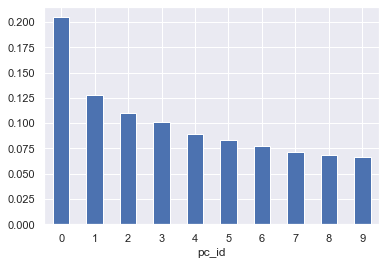

In [43]:
#plot explained variances
COMPINF.exp_var.plot.bar(rot=0)

In [44]:
LOADINGS.sample(20).style.background_gradient(gradient_cmap)

pc_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
happens,0.001216,-0.019618,-0.009262,0.012326,-0.004029,0.002894,0.005268,0.012565,0.007220,0.004911
page,0.002250,-0.009991,0.017395,-0.023353,-0.009750,0.006855,-0.021944,0.032465,0.001714,-0.015827
raise,0.006196,-0.004040,0.001951,-0.009055,0.022899,-0.007475,0.003147,0.034135,0.001861,0.019576
schedule,0.002855,0.004862,-0.007180,0.009738,0.005088,-0.008578,-0.006019,0.001494,-0.000145,-0.016062
choose,0.001411,-0.000811,-0.012851,0.002846,-0.004174,-0.004569,-0.010195,0.012898,-0.011590,-0.020331
dress,0.020729,0.004327,0.019651,0.028665,-0.063005,0.016223,0.077364,-0.018873,0.004115,0.022337
guest,0.008073,0.004995,-0.027954,0.003668,0.000876,-0.001373,-0.016402,0.056223,0.023814,0.019368
mommy,-0.016459,-0.010423,-0.008779,-0.008528,-0.022754,-0.018022,-0.014284,0.003916,-0.002844,-0.006912
brown,0.008391,0.001995,0.017667,0.005087,-0.004518,-0.006121,-0.029445,0.000867,-0.009932,-0.013025


In [45]:
# DCM Scatterplot
try:
    DOC_PCA = DOC_PCA.join(DCM)
except:
    pass

In [439]:
DOC_PCA

SEASON  EPISODE  Year                                Title  \
Season Episode                                                               
1      1             1        1  2000                            The Pilot   
       2             1        2  2000   The Lorelai's First Day at Chilton   
       3             1        3  2000                          k*ll Me Now   
       4             1        4  2000                     The Deer Hunters   
       5             1        5  2000              Rory's Birthday Parties   
...                ...      ...   ...                                  ...   
7      18            7       18  2007                        Hay Bale Maze   
       19            7       19  2007         It's Just Like Riding A Bike   
       20            7       20  2007                    Lorelai? Lorelai?   
       21            7       21  2007                      Unto The Breach   
       22            7       22  2007                           Bon Voyage   

                            label  mean_tfidf  n_tokens         0         1  \
Season Episode                                                                
1      1         S1xE1- The Pilot    0.000006      5667 -0.038324 -0.238008   
       2         S1xE2- The Lorel    0.000006      5389 -0.003245 -0.164725   
       3         S1xE3- k*ll Me N    0.000007      6123  0.049193 -0.125944   
       4         S1xE4- The Deer     0.000007      6459 -0.035384 -0.154260   
       5         S1xE5- Rory's Bi    0.000006      6599  0.037493 -0.121691   
...                           ...         ...       ...       ...       ...   
7      18       S7xE18- Hay Bale     0.000009      8061  0.214895  0.204071   
       19       S7xE19- It's Just    0.000006      8052  0.164312  0.083158   
       20       S7xE20- Lorelai?     0.000007      6958  0.179125  0.143308   
       21       S7xE21- Unto The     0.000007      7120  0.193811  0.211600   
       22       S7xE22- Bon Voyag    0.000007      7423  0.067272 -0.012252   

                       2         3         4         5         6         7  \
Season Episode                                                               
1      1       -0.067496 -0.214902 -0.017963 -0.138110  0.202504 -0.103515   
       2       -0.172896 -0.158634 -0.121511 -0.052921  0.058396 -0.058797   
       3       -0.101193 -0.055298 -0.078141 -0.002221 -0.009923  0.127817   
       4       -0.203042 -0.143189 -0.106724 -0.050273  0.052867 -0.129938   
       5       -0.128205 -0.383514  0.171247  0.314971 -0.181377 -0.104391   
...                  ...       ...       ...       ...       ...       ...   
7      18       0.056304  0.075030  0.145295 -0.009916  0.164594 -0.017977   
       19      -0.050779 -0.068388 -0.093015 -0.156158  0.043751  0.188907   
       20      -0.069365  0.094182 -0.236732 -0.092422 -0.011144  0.065820   
       21      -0.040526 -0.104954  0.021539 -0.134802  0.150912  0.099805   
       22      -0.011945  0.054716  0.002540 -0.076124 -0.134900  0.108903   

                       8         9  
Season Episode                      
1      1       -0.026708  0.287094  
       2       -0.154694  0.313992  
       3       -0.015163  0.207162  
       4       -0.138405 -0.051002  
       5        0.251395 -0.116531  
...                  ...       ...  
7      18      -0.088065  0.026495  
       19      -0.033260 -0.172455  
       20       0.231474 -0.079527  
       21       0.018943 -0.088680  
       22       0.045566 -0.020639  

[153 rows x 17 columns]

In [46]:
#PCO 0 and 1
px.scatter(DOC_PCA, 0, 1, 
           color='SEASON', #symbol = 'EPISODE',
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

In [570]:
#PCO 0 and 1
px.scatter(DOC_PCA, 0, 1, 
           color='SEASON', 
           #symbol = 'SEASON',
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=500)

Some intermingling but also some clear seperation between Seasons 1, 2, 3 (Rory at Chilton) and Seasons 4, 5, 6, 7 (Rory at Yale)

In [47]:
try:
    VOCAB_PCA = VOCAB3.join(LOADINGS, how='right').reset_index()
except:
    pass

In [48]:
VOCAB_PCA.head()

,term_str,term_rank,n,n_chars,p,s,i,h,max_pos,n_pos,...,0,1,2,3,4,5,6,7,8,9
0,chicken,847,106,7,0.000091,10965.216981,13.420647,0.001224,NN,1,...,-0.006673,-0.013187,0.005942,0.004701,-0.016257,0.019515,0.017892,-0.034798,0.001166,-0.029340
1,given,1092,75,5,0.000065,15497.506667,13.919749,0.000898,VBN,1,...,0.005064,-0.013579,-0.003453,0.003303,0.010866,-0.007896,-0.017909,-0.002506,-0.015453,0.005571
2,french,742,125,6,0.000108,9298.504000,13.182783,0.001418,JJ,1,...,0.004985,-0.065548,-0.046872,0.017610,-0.054064,-0.003682,-0.020311,0.002343,-0.059419,0.001340
3,voice,956,89,5,0.000077,13059.696629,13.672834,0.001047,NN,1,...,-0.000408,-0.012483,-0.000068,-0.005130,-0.021501,-0.016033,-0.005529,0.033142,-0.030468,0.004649
4,shopping,772,119,8,0.000102,9767.336134,13.253749,0.001357,NN,2,...,0.011724,-0.013848,-0.034205,0.003270,0.022682,-0.002659,-0.044892,-0.014724,0.020501,-0.028492


In [49]:
COMPINF.loc[[0,1]]

,pos,neg,eig_val,exp_var
pc_id,,,,
0,logan doyle christopher zach boat 00 ace edito...,jess wanna dean harvard yup awhile studying do...,0.035758,0.204716
1,jess logan zach boat doyle yale ace dude mama ...,christopher dean chilton harvard jackson chris...,0.022375,0.128096


Not a clear distinction between first and second component but tends to show difference between first and second half of the show:  

Seasons 1, 2, 3: Rory at Chilton  
Season 4, 5, 6, 7: Rory at Yale. 

**Pos**  
- 0: logan, doyle, zach, boat, ace: all relating to names/items when Rory is at Yales  
- 1: jess, logan, zach, boat, doyle, yale, ace: again all relating to names/itmes when Rory is at Yales  

in comparison to  
**Neg**  
- 0: jess, dean, hardward: jess and dean are Rory's high school boyfriends. And growing up, Rory and Lorelai dreamed of Rory going to Yale not Harvard. It wasn't until she was applying to colleges, that she decided to also apply to Yale in addition to Harvard.  
- 1: dean, chilton, harvard: again all relating to when Rory attended Chilton

### Top 1000 nouns

In [50]:
#top 1000 nouns
LOADINGS_N, DCM_N, COMPINF_N = hw07.get_pca(TFIDF_N, norm_docs = True, center_by_mean = False, center_by_variance = False)

In [441]:
#save output
# LOADINGS_N.to_csv(f'{data_home}/output/{data_prefix}-LOADINGS_N.csv')
# DCM_N.to_csv(f'{data_home}/output/{data_prefix}-DCM_N.csv')
# COMPINF_N.to_csv(f'{data_home}/output/{data_prefix}-COMPINF_N.csv')

<AxesSubplot:xlabel='pc_id'>

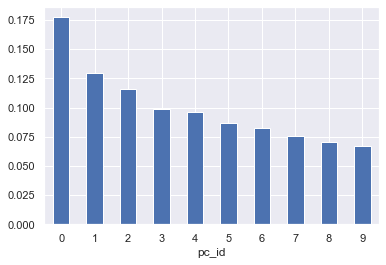

In [51]:
#plot explained variances
COMPINF_N.exp_var.plot.bar(rot=0)

In [52]:
LOADINGS_N.sample(20).style.background_gradient(gradient_cmap)

pc_id,0,1,2,3,4,5,6,7,8,9
term_str,,,,,,,,,,
date,0.010884,-0.102910,0.014270,0.007674,0.013069,0.009086,-0.027199,-0.020455,0.028696,0.080968
cat,0.024950,-0.093031,0.037900,-0.012986,-0.066126,-0.011269,0.079147,-0.040579,-0.016223,0.037607
ice,-0.005477,-0.019683,-0.003772,0.007374,0.019891,0.035818,-0.004541,0.031210,-0.014595,0.035066
simple,0.003879,-0.023873,0.012702,-0.003768,0.015227,0.003597,0.012278,0.006251,0.018906,0.014796
likes,0.006221,-0.016100,0.004026,-0.004579,0.006365,0.004811,-0.007313,-0.001935,-0.007753,0.003890
ya,0.033906,-0.010780,0.004711,0.011027,0.027328,-0.018454,-0.002405,-0.001864,-0.008546,-0.005517
dorm,-0.013614,-0.018902,0.016478,-0.007408,0.012192,-0.008601,0.032377,0.005471,-0.011454,-0.021866
property,0.006970,0.029075,-0.022888,-0.053328,0.068201,0.014807,0.029349,0.005142,0.009706,0.018571
yo,-0.003648,-0.000256,0.017348,-0.031771,0.017104,-0.028895,0.022018,-0.002937,-0.038800,-0.003623


In [53]:
# DCM Scatterplot
try:
    DOC_PCA = DOC_PCA.join(DCM_N)
except:
    pass

In [54]:
#PCO 0 and 1
px.scatter(DOC_PCA, 0, 1, 
           color='SEASON', #symbol = 'EPISODE',
           hover_name='label', 
           marginal_x='box', marginal_y='box', 
           height=1000)

Some intermingling but also some clear seperation between Seasons 1, 2, 3 (Rory at Chilton) and Seasons 4, 5, 6, 7 (Rory at Yale)

In [55]:
try:
    VOCAB_PCA = VOCAB3.join(LOADINGS_N, how='right').reset_index()
except:
    pass

In [56]:
VOCAB_PCA.head()

,term_str,term_rank,n,n_chars,p,s,i,h,max_pos,n_pos,...,0,1,2,3,4,5,6,7,8,9
0,shopping,772,119,8,0.000102,9767.336134,13.253749,0.001357,NN,2,...,-0.017824,-0.004647,0.031654,0.013524,0.025711,0.028744,0.004512,0.020268,0.002919,0.010202
1,chicken,847,106,7,0.000091,10965.216981,13.420647,0.001224,NN,1,...,0.003784,0.002880,-0.010941,-0.010388,0.002579,0.013311,-0.043913,-0.000257,0.011745,-0.028063
2,voice,956,89,5,0.000077,13059.696629,13.672834,0.001047,NN,1,...,-0.003469,0.005647,-0.008395,0.011649,0.016474,-0.033250,-0.005015,-0.025071,0.020251,0.028280
3,simple,976,87,6,0.000075,13359.919540,13.705624,0.001026,NN,1,...,0.003879,-0.023873,0.012702,-0.003768,0.015227,0.003597,0.012278,0.006251,0.018906,0.014796
4,history,955,89,7,0.000077,13059.696629,13.672834,0.001047,NN,1,...,-0.005960,0.008213,-0.014383,-0.003100,0.000256,0.024262,0.017395,-0.026801,0.009491,-0.029316


In [57]:
COMPINF.loc[[0,1]]

,pos,neg,eig_val,exp_var
pc_id,,,,
0,logan doyle christopher zach boat 00 ace edito...,jess wanna dean harvard yup awhile studying do...,0.035758,0.204716
1,jess logan zach boat doyle yale ace dude mama ...,christopher dean chilton harvard jackson chris...,0.022375,0.128096


Same conclusions as top 100 words

# Topic Models for Characters

In [58]:
#create topic model for character BOW
tm_char = TopicModel(BOW_CHAR)

In [59]:
#pick parameters for topic model
n_terms = 1000 #number of terms
n_topics = 40 #number of topics
max_iter = 20 #number of iterations to determine/finalize topics
# n_top_terms = 7
doc_topic_prior = .1 # Prior of document topic distribution alpha. Defaults to 1 / n_components.
topic_word_prior = .1 # Prior of topic word distribution beta. Defaults to 1 / n_components.

In [60]:
#set parameters
tm_char.n_terms = 1000
tm_char.n_topics = 40
tm_char.n_top_terms = 10

Run the following methods in order, assuming your object is called `tm`:

    - tm.create_X()
    - tm.get_model()
    - tm.describe_topics()
    - tm.get_model_stats()

In [61]:
tm_char.create_X()
tm_char.get_model()
tm_char.describe_topics()
tm_char.get_model_stats()

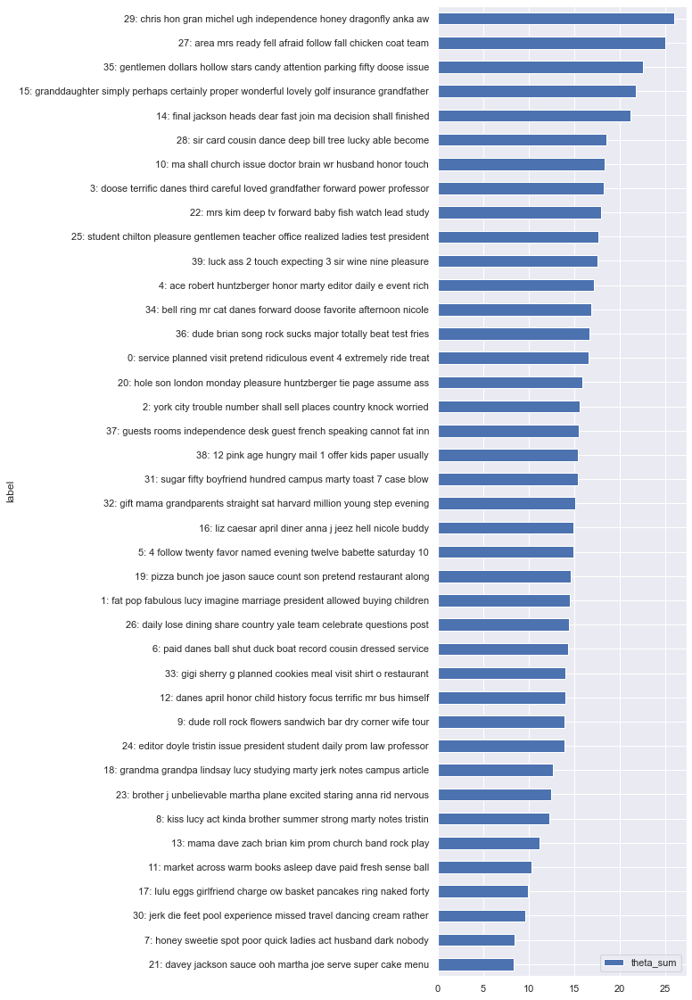

In [62]:
#plot the results
tm_char.plot_topics()

tm_char.n_terms = 1000 
Topics spot characters:  
    - 29: Lorelai  
    - 21: Sookie  
    - 4: Logan
    - 17: Kirk  
    - 24: Paris?  
    - 16: Luke  
    - 37: Michel  
    - 36: Zach  
    - 35: Taylor Doose or Stars Hollow in general  
    - 15: Emily and/or Richard  
    - 9: Gil (band member). 
    - but no Rory? Maybe 18?  
        - hints of Chilton and Yale. Definitely mentions of Logan, Lucy, Marty, Dolye, etc. But nothing that specifically shouts "Look, that's Rory!" Are theories correct that Rory doesn't have personality, are her interests so wide she doesn't fit into one category, and does this show Rory's character growth?  

tm_char.n_terms = 1500  
Topics spotted:  
    - 22: Yale.  
    - 35: grandparents.   
    - 18: maid.   
    - 7: Chilton (project specifically).   
    - 19: Babette.   
    - 38: Band.   
    - 31: Stars Hollow.   
    - 11: Luke.   
    - 36: Lorelai.   
    - 29: Chilton.   
    - 16: Lane.   

Switch between:  
tm_char.n_terms = 1500  
and   
tm_char.n_terms = 1000  
for conclusions about topics. 

Additional Parameters:  
tm_char.n_topics = 40  
tm_char.n_top_terms = 10

In [47]:
#create objects for three tables

In [63]:
THETA_char = tm_char.THETA
THETA_char.head()

topic_id,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
Character,,,,,,,,,,,,,,,,,,,,,
ADVISOR,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,...,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471,0.001471
AK,0.001786,0.001786,0.001786,0.001786,0.293460,0.001786,0.001786,0.001786,0.001786,0.001786,...,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786
ALAN,0.001786,0.080547,0.001786,0.135682,0.109723,0.001786,0.001786,0.001786,0.001786,0.001786,...,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786,0.001786
ALEX,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,...,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.000202,0.992137,0.000202,0.000202
ALEXANDRA,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,...,0.001316,0.001316,0.001316,0.001316,0.001316,0.001316,0.835006,0.001316,0.001316,0.001316


In [64]:
PHI_char = tm_char.PHI
PHI_char.head()

term_str,goes,full,quite,gave,yours,serious,mrs,ice,order,whoa,...,president,insurance,dry,art,john,dining,lucy,prom,jeez,wr
topic_id,,,,,,,,,,,,,,,,,,,,,
0,4.025,1.025,0.025000,0.025000,0.025,2.025000,0.025,0.025,0.025,0.025000,...,1.025,0.025,0.025,0.025,1.025,0.025,0.025,0.025,0.025,1.025000
1,0.025,1.025,0.025000,0.025000,0.025,0.025000,0.025,0.025,0.025,0.025000,...,2.025,0.025,0.025,1.025,0.025,0.025,3.025,0.025,0.025,0.025000
2,0.025,0.025,0.025000,0.025000,0.025,0.025000,0.025,0.025,0.025,0.025000,...,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025000
3,0.025,0.025,0.025000,1.025000,0.025,0.025000,0.025,0.025,0.025,0.025000,...,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025000
4,0.025,0.025,3.183462,2.934357,0.025,1.837744,0.025,0.025,0.025,3.151333,...,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,0.025,3.304733


In [65]:
TOPIC_char = tm_char.TOPIC
TOPIC_char.head()

,phi_sum,theta_sum,h,top_terms_rel,top_terms,label
topic_id,,,,,,
0,370.308069,16.612259,8.03,service planned visit pretend ridiculous event...,face service finally planned bit family ridicu...,0: service planned visit pretend ridiculous ev...
1,274.783915,14.541627,7.73,fat pop fabulous lucy imagine marriage preside...,fat until pop nope imagine fabulous everyone w...,1: fat pop fabulous lucy imagine marriage pres...
2,310.155704,15.640001,7.44,york city trouble number shall sell places cou...,number head york listen trouble different city...,2: york city trouble number shall sell places ...
3,315.000722,18.295189,7.80,doose terrific danes third careful loved grand...,class heard may doose mr terrific married love...,3: doose terrific danes third careful loved gr...
4,1381.598842,17.177357,7.90,ace robert huntzberger honor marty editor dail...,ace miss huntzberger another drink paper rober...,4: ace robert huntzberger honor marty editor d...


In [66]:
TOPIC_char.sort_values('theta_sum',ascending = False)

,phi_sum,theta_sum,h,top_terms_rel,top_terms,label
topic_id,,,,,,
29,60312.266032,26.031155,9.61,chris hon gran michel ugh independence honey d...,inn honey michel kid ooh head hmm crazy mind w...,29: chris hon gran michel ugh independence hon...
27,319.044898,25.052659,7.40,area mrs ready fell afraid follow fall chicken...,ready mrs excuse mm ladies living may fall fol...,27: area mrs ready fell afraid follow fall chi...
35,1773.502879,22.612177,7.66,gentlemen dollars hollow stars candy attention...,hollow stars dollars ten may business everybod...,35: gentlemen dollars hollow stars candy atten...
15,17080.791703,21.764943,9.26,granddaughter simply perhaps certainly proper ...,father wonderful business young woman christop...,15: granddaughter simply perhaps certainly pro...
14,390.631672,21.230688,7.57,final jackson heads dear fast join ma decision...,jackson fast wonderful final birthday dear fri...,14: final jackson heads dear fast join ma deci...
28,234.918649,18.588564,7.45,sir card cousin dance deep bill tree lucky abl...,sir dance card break problem whoa number asked...,28: sir card cousin dance deep bill tree lucky...
10,241.979886,18.395878,7.06,ma shall church issue doctor brain wr husband ...,ma minutes shall inn important set wonderful e...,10: ma shall church issue doctor brain wr husb...
3,315.000722,18.295189,7.80,doose terrific danes third careful loved grand...,class heard may doose mr terrific married love...,3: doose terrific danes third careful loved gr...
22,220.363974,17.979889,6.09,mrs kim deep tv forward baby fish watch lead s...,mrs baby kim watch hand tv fish sleep deep says,22: mrs kim deep tv forward baby fish watch le...


In [452]:
#save output
# THETA_char.to_csv(f'{data_home}/output/{data_prefix}-THETA-CHAR.csv')
# PHI_char.to_csv(f'{data_home}/output/{data_prefix}-PHI-CHAR.csv')
# TOPIC_char.to_csv(f'{data_home}/output/{data_prefix}-TOPIC-CHAR.csv')

## Heatmap

In [152]:
#subset char_info to the 14 main characters
main_characters = CHAR_INFO[CHAR_INFO.Status == 'Main'].index

In [156]:
CHAR_IMG = tm_char.THETA.groupby('Character').mean()
#CHAR_IMG.index = CHAR_INFO.loc['RORY']
CHAR_IMG.columns = tm_char.TOPIC.label

In [158]:
CHAR_IMG2 = CHAR_IMG.loc[main_characters]#[['LORELAI','RORY','EMILY','RICHARD','LUKE','SOOKIE','LANE','PARIS','MICHEL','DEAN','JESS','LOGAN','KIRK','JASON']]

In [160]:
CHAR_IMG2.T.style.background_gradient(cmap=gradient_cmap)

Character,DEAN,EMILY,MICHEL,PARIS,JASON,JESS,RICHARD,RORY,KIRK,SOOKIE,LANE,LOGAN,LORELAI,LUKE
label,,,,,,,,,,,,,,
0: service planned visit pretend ridiculous event 4 extremely ride treat,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
1: fat pop fabulous lucy imagine marriage president allowed buying children,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
2: york city trouble number shall sell places country knock worried,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
3: doose terrific danes third careful loved grandfather forward power professor,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
4: ace robert huntzberger honor marty editor daily e event rich,0.000015,0.000002,0.000011,0.000730,0.000025,0.000014,0.000005,0.000392,0.000010,0.000004,0.000005,0.251161,0.000001,0.000002
5: 4 follow twenty favor named evening twelve babette saturday 10,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
6: paid danes ball shut duck boat record cousin dressed service,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
7: honey sweetie spot poor quick ladies act husband dark nobody,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002
8: kiss lucy act kinda brother summer strong marty notes tristin,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,0.000001,0.000002


<Figure size 432x288 with 0 Axes>

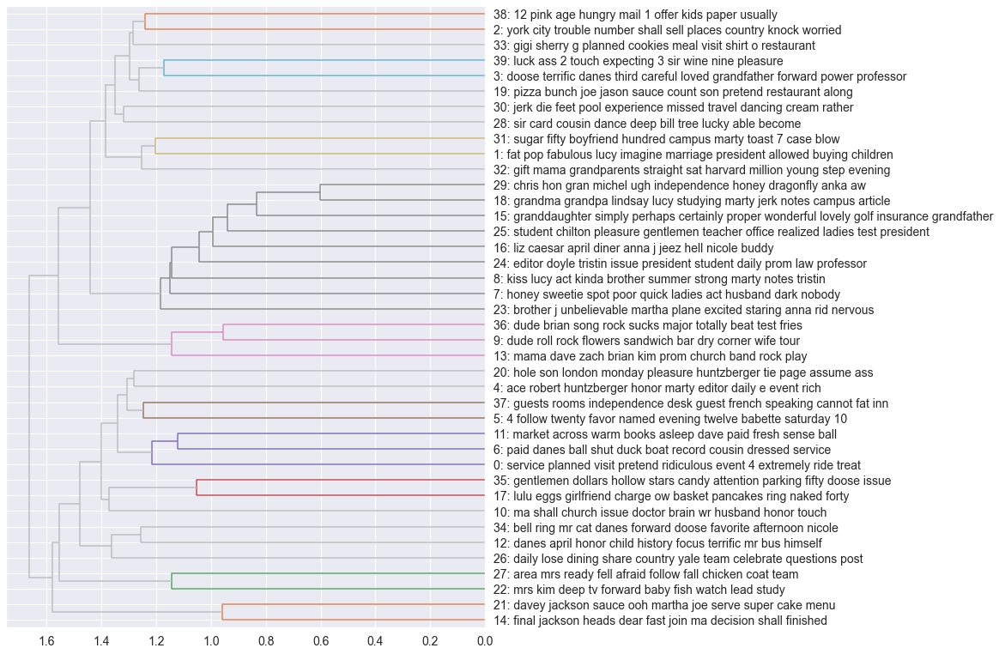

In [454]:
dend_aus_phi = HAC(tm_char.PHI)
dend_aus_phi.labels = tm_char.TOPIC.label.to_list()
dend_aus_phi.plot()

In [578]:
CHAR_IMG2.T

Character,DEAN,EMILY,MICHEL,PARIS,JASON,JESS,RICHARD,RORY,KIRK,SOOKIE,LANE,LOGAN,LORELAI,LUKE
label,,,,,,,,,,,,,,
0: service planned visit pretend ridiculous event 4 extremely ride treat,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
1: fat pop fabulous lucy imagine marriage president allowed buying children,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
2: york city trouble number shall sell places country knock worried,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
3: doose terrific danes third careful loved grandfather forward power professor,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
4: ace robert huntzberger honor marty editor daily e event rich,0.000015,0.000002,0.000011,0.000730,0.000025,0.000014,0.000005,0.000392,0.000010,0.000004,0.000005,0.251161,5.747523e-07,0.000002
5: 4 follow twenty favor named evening twelve babette saturday 10,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
6: paid danes ball shut duck boat record cousin dressed service,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
7: honey sweetie spot poor quick ladies act husband dark nobody,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002
8: kiss lucy act kinda brother summer strong marty notes tristin,0.000015,0.000002,0.000011,0.000004,0.000025,0.000014,0.000005,0.000001,0.000010,0.000004,0.000005,0.000008,5.747523e-07,0.000002


In [575]:
fig = px.imshow(CHAR_IMG2.T, color_continuous_scale='GnBu', title="Main Characters", height=1000)
fig.update_layout(xaxis={'side': 'top', 'title_text':None}, yaxis={'title_text':None})
fig.update_xaxes(tickangle=45)

In [67]:
CHAR_INFO = CHAR_INFO.set_index('Character')

In [603]:
def show_char_heatmap(tm, season, h=None, w=None, thresh=None):
    #global LIB
    
    #title = LIB.loc[book_id].label

    # Pick only those topics whose mean concentration is above threshhold
    if not thresh:
        thresh = tm.THETA.loc[season].mean().quantile(.8)
    X = tm.THETA.loc[season, tm.THETA.loc[season].mean() >= thresh]
    if not h:
        h = int(50 * len(X.T))
    if not w:
        w = int(16 * len(X))
    if w < 1000: w = 1000
    fig = px.imshow(X.T, 
                     width=w, height=h, aspect='equal',
                     color_continuous_scale='GnBu', 
                     labels=dict(y='topics',x='Characters'),
                     y=tm.TOPIC.loc[X.columns].label.values,
                     title=f"Characters / thresh={round(thresh, 3)}" 
    )
    fig.update_xaxes(side = "top", tickangle = 45)
    return fig

In [604]:
show_char_heatmap(tm_char, main_characters, thresh = 0.015)

## Topics by Gender

In [68]:
GENDER = THETA_char.join(CHAR_INFO['Gender']).groupby('Gender').mean()
GENDER

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
Gender,,,,,,,,,,,,,,,,,,,,,
F,0.024113,0.047337,0.005344,0.023921,0.000563,0.000537,0.024041,0.034616,0.030774,0.000537,...,0.013314,0.047769,0.024056,0.012363,0.012214,0.006679,0.000537,0.027001,0.024098,0.024175
M,0.002244,0.000544,0.040725,0.000544,0.044792,0.020294,0.000544,0.000544,0.052780,0.020617,...,0.000544,0.000544,0.020638,0.006934,0.000544,0.011421,0.041100,0.025080,0.000544,0.025740


In [69]:
GENDER_T = GENDER.T

In [70]:
GENDER_T.style.background_gradient(gradient_cmap, axis = None)

Gender,F,M
0,0.024113,0.002244
1,0.047337,0.000544
2,0.005344,0.040725
3,0.023921,0.000544
4,0.000563,0.044792
5,0.000537,0.020294
6,0.024041,0.000544
7,0.034616,0.000544
8,0.030774,0.052780
9,0.000537,0.020617


In [71]:
GENDER_T['Diff'] = GENDER_T['F'] - GENDER_T['M']

In [72]:
GENDER_T['Abs_Diff'] = abs(GENDER_T['Diff'])

In [73]:
GENDER_T[GENDER_T['Abs_Diff'] >= 0.05] 

Gender,F,M,Diff,Abs_Diff
16,0.022759,0.086665,-0.063906,0.063906
19,0.009388,0.080515,-0.071127,0.071127


In [74]:
#Luke
TOPIC_char.loc[16,]

phi_sum                                                    10018.6
theta_sum                                                  14.9439
h                                                              9.1
top_terms_rel    liz caesar april diner anna j jeez hell nicole...
top_terms        diner hell liz april gotta care kid whatever c...
label            16: liz caesar april diner anna j jeez hell ni...
Name: 16, dtype: object

In [75]:
TOPIC_char.loc[19,]

phi_sum                                                    389.021
theta_sum                                                  14.6663
h                                                             7.91
top_terms_rel    pizza bunch joe jason sauce count son pretend ...
top_terms        pizza jason mad found bunch cheese problem sou...
label            19: pizza bunch joe jason sauce count son pret...
Name: 19, dtype: object

## Topics by Age Group

### Season 3 (Chilton)

In [76]:
S3_AGE = THETA_char.join(CHAR_INFO[['S3_Age']]).groupby('S3_Age').mean()

In [77]:
S3_AGE.style.background_gradient(gradient_cmap, axis = None)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
S3_Age,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Adult,0.000409,0.000409,0.040229,0.000409,0.000409,0.000409,0.000409,0.014825,0.000409,0.033196,0.000409,0.000409,0.003922,0.017055,0.000409,0.039395,0.127796,0.045486,0.037133,0.033480,0.010047,0.021731,0.032748,0.043644,0.000409,0.033709,0.000409,0.028981,0.033280,0.262944,0.000409,0.000409,0.033230,0.010846,0.000409,0.009008,0.000409,0.013864,0.033396,0.033503
Child,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.220327,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.001146,0.269464,0.001146,0.001146,0.249494,0.001146,0.001146,0.001146,0.219464,0.001146,0.001146
OA,0.004342,0.000375,0.000375,0.047144,0.000375,0.000375,0.000375,0.047940,0.000375,0.000375,0.047250,0.000375,0.000375,0.000375,0.094352,0.228604,0.016497,0.001656,0.004471,0.094493,0.054638,0.000375,0.000772,0.006236,0.007828,0.047884,0.000375,0.000375,0.000375,0.152733,0.000375,0.003874,0.047413,0.000375,0.023728,0.023745,0.000375,0.037275,0.000375,0.000375
YA,0.026762,0.052431,0.026393,0.000704,0.057791,0.026171,0.026682,0.000704,0.089946,0.000704,0.002077,0.000704,0.001003,0.037976,0.004313,0.022496,0.026838,0.000704,0.168034,0.035486,0.005585,0.009023,0.029347,0.000704,0.075762,0.007136,0.000704,0.000704,0.028536,0.072993,0.000704,0.050974,0.000704,0.000704,0.000704,0.001815,0.053000,0.019088,0.000704,0.033194


In [78]:
#child
TOPIC_char.loc[6,]

phi_sum                                                    403.958
theta_sum                                                  14.3102
h                                                             7.84
top_terms_rel    paid danes ball shut duck boat record cousin d...
top_terms        miss turn excuse michel ball paid second shut ...
label            6: paid danes ball shut duck boat record cousi...
Name: 6, dtype: object

In [79]:
#children
TOPIC_char.loc[8,]

phi_sum                                                    747.107
theta_sum                                                  12.3175
h                                                             8.39
top_terms_rel    kiss lucy act kinda brother summer strong mart...
top_terms        kiss boyfriend friends summer late looks true ...
label            8: kiss lucy act kinda brother summer strong m...
Name: 8, dtype: object

In [80]:
#older adults
TOPIC_char.loc[15,]

phi_sum                                                    17080.8
theta_sum                                                  21.7649
h                                                             9.26
top_terms_rel    granddaughter simply perhaps certainly proper ...
top_terms        father wonderful business young woman christop...
label            15: granddaughter simply perhaps certainly pro...
Name: 15, dtype: object

In [81]:
#teen
TOPIC_char.loc[18,]

phi_sum                                                    37811.4
theta_sum                                                  12.6811
h                                                             9.57
top_terms_rel    grandma grandpa lindsay lucy studying marty je...
top_terms        grandma grandpa yale weird sounds yet everyone...
label            18: grandma grandpa lindsay lucy studying mart...
Name: 18, dtype: object

In [82]:
#adult
TOPIC_char.loc[29,]

phi_sum                                                    60312.3
theta_sum                                                  26.0312
h                                                             9.61
top_terms_rel    chris hon gran michel ugh independence honey d...
top_terms        inn honey michel kid ooh head hmm crazy mind w...
label            29: chris hon gran michel ugh independence hon...
Name: 29, dtype: object

In [83]:
#child
TOPIC_char.loc[30,]

phi_sum                                                    180.051
theta_sum                                                  9.69032
h                                                             7.52
top_terms_rel    jerk die feet pool experience missed travel da...
top_terms        feet jerk die missed cream cold ooh real ice f...
label            30: jerk die feet pool experience missed trave...
Name: 30, dtype: object

### Season 4

In [84]:
S4_AGE = THETA_char.join(CHAR_INFO[['S4_Age']]).groupby('S4_Age').mean()

In [85]:
S4_AGE.style.background_gradient(gradient_cmap, axis = None)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
S4_Age,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Adult,0.000409,0.000409,0.040229,0.000409,0.000409,0.000409,0.000409,0.014825,0.000409,0.033196,0.000409,0.000409,0.003922,0.017055,0.000409,0.039395,0.127796,0.045486,0.037133,0.033480,0.010047,0.021731,0.032748,0.043644,0.000409,0.033709,0.000409,0.028981,0.033280,0.262944,0.000409,0.000409,0.033230,0.010846,0.000409,0.009008,0.000409,0.013864,0.033396,0.033503
Child,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.001667,0.498363,0.001667,0.001667,0.001667,0.438303,0.001667,0.001667
OA,0.004342,0.000375,0.000375,0.047144,0.000375,0.000375,0.000375,0.047940,0.000375,0.000375,0.047250,0.000375,0.000375,0.000375,0.094352,0.228604,0.016497,0.001656,0.004471,0.094493,0.054638,0.000375,0.000772,0.006236,0.007828,0.047884,0.000375,0.000375,0.000375,0.152733,0.000375,0.003874,0.047413,0.000375,0.023728,0.023745,0.000375,0.037275,0.000375,0.000375
YA,0.026091,0.051102,0.025732,0.000702,0.056325,0.025516,0.026014,0.000702,0.098896,0.000702,0.002040,0.000702,0.000994,0.037018,0.004218,0.021935,0.026166,0.000702,0.163742,0.034593,0.005458,0.008807,0.028611,0.000702,0.073835,0.006969,0.000702,0.000702,0.027821,0.071137,0.014462,0.049683,0.000702,0.000702,0.000702,0.001785,0.051657,0.018615,0.000702,0.032359


In [86]:
#child
TOPIC_char.loc[6,]

phi_sum                                                    403.958
theta_sum                                                  14.3102
h                                                             7.84
top_terms_rel    paid danes ball shut duck boat record cousin d...
top_terms        miss turn excuse michel ball paid second shut ...
label            6: paid danes ball shut duck boat record cousi...
Name: 6, dtype: object

In [87]:
#teen
TOPIC_char.loc[8,]

phi_sum                                                    747.107
theta_sum                                                  12.3175
h                                                             8.39
top_terms_rel    kiss lucy act kinda brother summer strong mart...
top_terms        kiss boyfriend friends summer late looks true ...
label            8: kiss lucy act kinda brother summer strong m...
Name: 8, dtype: object

In [88]:
#teen
TOPIC_char.loc[30,]

phi_sum                                                    180.051
theta_sum                                                  9.69032
h                                                             7.52
top_terms_rel    jerk die feet pool experience missed travel da...
top_terms        feet jerk die missed cream cold ooh real ice f...
label            30: jerk die feet pool experience missed trave...
Name: 30, dtype: object

In [89]:
#teen
TOPIC_char.loc[18,]

phi_sum                                                    37811.4
theta_sum                                                  12.6811
h                                                             9.57
top_terms_rel    grandma grandpa lindsay lucy studying marty je...
top_terms        grandma grandpa yale weird sounds yet everyone...
label            18: grandma grandpa lindsay lucy studying mart...
Name: 18, dtype: object

In [90]:
#teen
TOPIC_char.loc[8,]

phi_sum                                                    747.107
theta_sum                                                  12.3175
h                                                             8.39
top_terms_rel    kiss lucy act kinda brother summer strong mart...
top_terms        kiss boyfriend friends summer late looks true ...
label            8: kiss lucy act kinda brother summer strong m...
Name: 8, dtype: object

In [91]:
#OA
TOPIC_char.loc[15,]

phi_sum                                                    17080.8
theta_sum                                                  21.7649
h                                                             9.26
top_terms_rel    granddaughter simply perhaps certainly proper ...
top_terms        father wonderful business young woman christop...
label            15: granddaughter simply perhaps certainly pro...
Name: 15, dtype: object

In [92]:
#adult
TOPIC_char.loc[29,]

phi_sum                                                    60312.3
theta_sum                                                  26.0312
h                                                             9.61
top_terms_rel    chris hon gran michel ugh independence honey d...
top_terms        inn honey michel kid ooh head hmm crazy mind w...
label            29: chris hon gran michel ugh independence hon...
Name: 29, dtype: object

## Topics by Status

In [93]:
STATUS = THETA_char.join(CHAR_INFO[['Status']]).groupby('Status').mean()

In [94]:
STATUS.style.background_gradient(gradient_cmap, axis = None)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39
Status,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Chilton,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.175207,0.001499,0.001499,0.001499,0.001499,0.001499,0.016736,0.018746,0.001499,0.001499,0.044303,0.001499,0.001499,0.001499,0.001499,0.001499,0.119206,0.250509,0.001499,0.001499,0.220883,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.001499,0.079121,0.001499,0.028815
Family,0.004777,0.000393,0.063266,0.052084,0.000393,0.000393,0.000393,0.000393,0.023464,0.000393,0.000393,0.000393,0.000992,0.000393,0.000393,0.151724,0.002787,0.000393,0.052221,0.104622,0.053657,0.000393,0.005096,0.073038,0.008631,0.000393,0.000393,0.000393,0.000393,0.144853,0.028637,0.046567,0.052382,0.043014,0.000393,0.000393,0.000393,0.027686,0.000393,0.052646
Main,0.000008,0.000008,0.000008,0.000008,0.018027,0.000008,0.000008,0.000008,0.000008,0.000008,0.000008,0.000008,0.000008,0.033063,0.000008,0.163094,0.100697,0.041642,0.279119,0.000008,0.000008,0.028437,0.000008,0.000008,0.032830,0.000008,0.000008,0.000008,0.000008,0.284100,0.000008,0.000008,0.000008,0.000008,0.000008,0.003024,0.000008,0.015744,0.000008,0.000008
Reucrring,0.082667,0.082812,0.000151,0.000151,0.000151,0.000151,0.000151,0.083391,0.003706,0.000151,0.004500,0.000151,0.000151,0.079614,0.000151,0.031858,0.060367,0.002393,0.098940,0.000151,0.000151,0.016880,0.002503,0.000151,0.034761,0.000151,0.000151,0.000151,0.000151,0.254964,0.000151,0.092353,0.000151,0.000151,0.000151,0.041048,0.000151,0.023767,0.000151,0.000151
Stars_Hollow,0.000870,0.000870,0.000870,0.000870,0.040870,0.000870,0.000870,0.022494,0.040318,0.050051,0.050089,0.000870,0.006139,0.025838,0.050135,0.010581,0.136444,0.039342,0.017467,0.000870,0.012345,0.012742,0.098339,0.002864,0.000870,0.000870,0.000870,0.043727,0.004335,0.146958,0.000870,0.000870,0.050101,0.000870,0.000870,0.013769,0.050742,0.010037,0.050349,0.000870
Yale,0.000524,0.057800,0.057947,0.000524,0.066232,0.057450,0.058594,0.000524,0.059125,0.000524,0.000524,0.000524,0.000524,0.000524,0.058656,0.053586,0.016056,0.000524,0.044722,0.136405,0.022444,0.007557,0.000524,0.000524,0.054524,0.000524,0.000524,0.000524,0.000524,0.066464,0.000524,0.000524,0.000524,0.000524,0.029373,0.000524,0.058748,0.024617,0.000524,0.058687


In [95]:
#chilton
TOPIC_char.loc[8,]

phi_sum                                                    747.107
theta_sum                                                  12.3175
h                                                             8.39
top_terms_rel    kiss lucy act kinda brother summer strong mart...
top_terms        kiss boyfriend friends summer late looks true ...
label            8: kiss lucy act kinda brother summer strong m...
Name: 8, dtype: object

In [96]:
#chilton
TOPIC_char.loc[24,]

phi_sum                                                    3652.65
theta_sum                                                  13.9292
h                                                             8.74
top_terms_rel    editor doyle tristin issue president student d...
top_terms        doyle class harvard paper editor meeting most ...
label            24: editor doyle tristin issue president stude...
Name: 24, dtype: object

In [97]:
#chilton
TOPIC_char.loc[25,]

phi_sum                                                    1650.92
theta_sum                                                  17.6674
h                                                             8.77
top_terms_rel    student chilton pleasure gentlemen teacher off...
top_terms        chilton miss hope office class student its eac...
label            25: student chilton pleasure gentlemen teacher...
Name: 25, dtype: object

In [98]:
#chilton
TOPIC_char.loc[28,]

phi_sum                                                    234.919
theta_sum                                                  18.5886
h                                                             7.45
top_terms_rel    sir card cousin dance deep bill tree lucky abl...
top_terms        sir dance card break problem whoa number asked...
label            28: sir card cousin dance deep bill tree lucky...
Name: 28, dtype: object

In [99]:
#Stars Hollow
TOPIC_char.loc[16,]

phi_sum                                                    10018.6
theta_sum                                                  14.9439
h                                                              9.1
top_terms_rel    liz caesar april diner anna j jeez hell nicole...
top_terms        diner hell liz april gotta care kid whatever c...
label            16: liz caesar april diner anna j jeez hell ni...
Name: 16, dtype: object

In [100]:
#Stars Hollow
TOPIC_char.loc[22,]

phi_sum                                                    220.364
theta_sum                                                  17.9799
h                                                             6.09
top_terms_rel    mrs kim deep tv forward baby fish watch lead s...
top_terms          mrs baby kim watch hand tv fish sleep deep says
label            22: mrs kim deep tv forward baby fish watch le...
Name: 22, dtype: object

In [101]:
#Stars Hollow
TOPIC_char.loc[29,]

phi_sum                                                    60312.3
theta_sum                                                  26.0312
h                                                             9.61
top_terms_rel    chris hon gran michel ugh independence honey d...
top_terms        inn honey michel kid ooh head hmm crazy mind w...
label            29: chris hon gran michel ugh independence hon...
Name: 29, dtype: object

In [102]:
#Yale
TOPIC_char.loc[19,]

phi_sum                                                    389.021
theta_sum                                                  14.6663
h                                                             7.91
top_terms_rel    pizza bunch joe jason sauce count son pretend ...
top_terms        pizza jason mad found bunch cheese problem sou...
label            19: pizza bunch joe jason sauce count son pret...
Name: 19, dtype: object

In [103]:
#Main
TOPIC_char.loc[15,] #final guess: grandparents

phi_sum                                                    17080.8
theta_sum                                                  21.7649
h                                                             9.26
top_terms_rel    granddaughter simply perhaps certainly proper ...
top_terms        father wonderful business young woman christop...
label            15: granddaughter simply perhaps certainly pro...
Name: 15, dtype: object

In [104]:
#Stars Hollow
TOPIC_char.loc[18,] #final guess: Rory

phi_sum                                                    37811.4
theta_sum                                                  12.6811
h                                                             9.57
top_terms_rel    grandma grandpa lindsay lucy studying marty je...
top_terms        grandma grandpa yale weird sounds yet everyone...
label            18: grandma grandpa lindsay lucy studying mart...
Name: 18, dtype: object

In [105]:
#Stars Hollow
TOPIC_char.loc[29,] #final guess: Lorelai

phi_sum                                                    60312.3
theta_sum                                                  26.0312
h                                                             9.61
top_terms_rel    chris hon gran michel ugh independence honey d...
top_terms        inn honey michel kid ooh head hmm crazy mind w...
label            29: chris hon gran michel ugh independence hon...
Name: 29, dtype: object

# Topic Models for Episodes

In [115]:
BOW_UNIGRAM.head()

n     tfidf
Season Episode term_str                 
1      1       200         1.0  0.017907
               314         1.0  0.028162
               absolutely  1.0  0.006541
               absurd      1.0  0.017543
               academic    1.0  0.020235

In [116]:
#create topic model for character BOW
tm_epi = TopicModel(BOW_UNIGRAM)

In [125]:
#pick parameters for topic model
n_terms = 4000 #number of terms
n_topics = 30 #number of topics
max_iter = 20 #number of iterations to determine/finalize topics
# n_top_terms = 7
doc_topic_prior = .1 # Prior of document topic distribution alpha. Defaults to 1 / n_components.
topic_word_prior = .1 # Prior of topic word distribution beta. Defaults to 1 / n_components.

In [127]:
#set parameters
tm_epi.n_terms = 4000
tm_epi.n_topics = 30
tm_epi.n_top_terms = 10

Run the following methods in order, assuming your object is called `tm`:

    - tm.create_X()
    - tm.get_model()
    - tm.describe_topics()
    - tm.get_model_stats()

In [128]:
tm_epi.create_X()
tm_epi.get_model()
tm_epi.describe_topics()
tm_epi.get_model_stats()

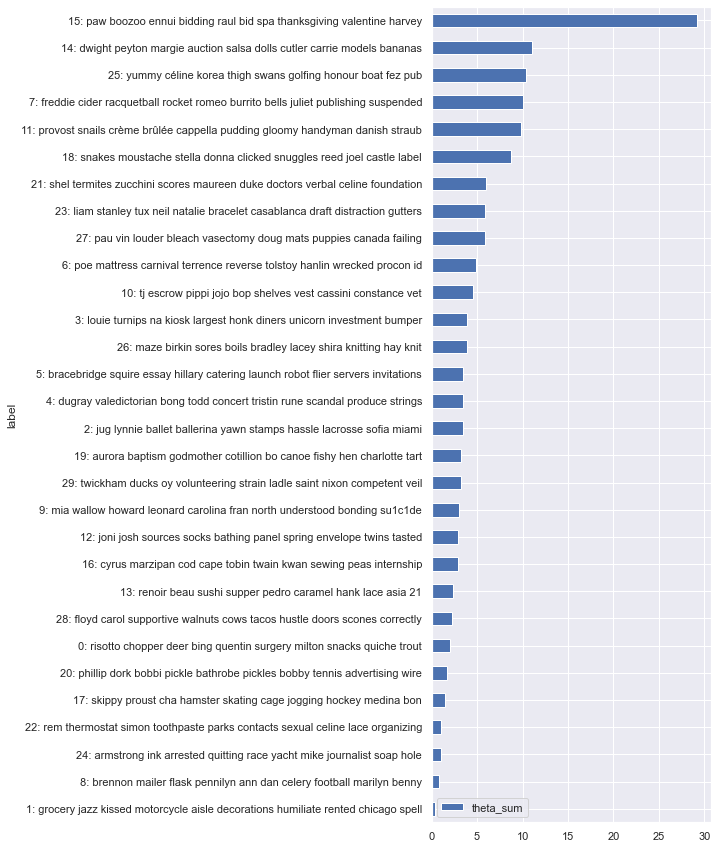

In [129]:
#plot the results
tm_epi.plot_topics()

In [130]:
THETA_epi = tm_epi.THETA
THETA_epi.head()

topic_id              0         1         2         3         4         5   \
Season Episode                                                               
1      1        0.000062  0.000062  0.000062  0.000062  0.042091  0.000062   
       2        0.000060  0.000060  0.000060  0.000060  0.032658  0.000060   
       3        0.000051  0.000051  0.000051  0.000051  0.000051  0.000051   
       4        0.993574  0.000047  0.000047  0.000047  0.002767  0.000047   
       5        0.000057  0.000057  0.000057  0.000057  0.105594  0.134185   

topic_id              6         7         8         9   ...        20  \
Season Episode                                          ...             
1      1        0.000062  0.000062  0.000062  0.000062  ...  0.000062   
       2        0.941000  0.000060  0.024729  0.000060  ...  0.000060   
       3        0.000051  0.000051  0.000051  0.000051  ...  0.000051   
       4        0.000047  0.000047  0.000047  0.000047  ...  0.000047   
       5        0.000057  0.000057  0.000057  0.000057  ...  0.000057   

topic_id              21        22        23        24        25        26  \
Season Episode                                                               
1      1        0.224093  0.000062  0.000062  0.000062  0.000062  0.000062   
       2        0.000060  0.000060  0.000060  0.000060  0.000060  0.000060   
       3        0.000051  0.000051  0.000051  0.000051  0.998522  0.000051   
       4        0.000047  0.000047  0.000047  0.000047  0.000047  0.000047   
       5        0.000057  0.000057  0.000057  0.000057  0.000057  0.000057   

topic_id              27        28        29  
Season Episode                                
1      1        0.000062  0.000062  0.000062  
       2        0.000060  0.000060  0.000060  
       3        0.000051  0.000051  0.000051  
       4        0.000047  0.000047  0.000047  
       5        0.000057  0.000057  0.000057  

[5 rows x 30 columns]

In [131]:
PHI_epi = tm_epi.PHI
PHI_epi.head()

term_str,price,laundry,tape,speech,opened,apple,screw,square,pickles,bucks,...,performing,defense,sunny,peaches,culinary,sunscreen,executive,truce,accountant,heather
topic_id,,,,,,,,,,,,,,,,,,,,,
0,0.033333,0.033333,1.030546,0.033333,1.031662,0.033333,0.033333,0.033333,1.031755,0.033333,...,2.033333,0.033333,0.033333,0.033333,1.032967,0.033333,0.033333,0.033333,0.033333,0.033333
1,0.033333,3.819730,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,...,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333
2,0.033333,0.033333,0.033333,0.033333,0.033333,7.515307,0.033333,0.033333,0.033333,1.614161,...,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333
3,1.479046,2.033333,3.807062,0.033333,0.033333,0.033333,0.033333,1.515262,0.033333,1.182379,...,0.033333,2.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333
4,0.033333,0.033333,0.033333,4.550331,0.033333,1.745695,1.187098,0.033333,0.033333,0.033333,...,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.907047,0.033333,0.033333,0.033333


In [132]:
TOPIC_epi = tm_epi.TOPIC
TOPIC_epi.head()

,phi_sum,theta_sum,h,top_terms_rel,top_terms,label
topic_id,,,,,,
0,1654.084436,2.005855,9.90,risotto chopper deer bing quentin surgery milt...,test deer risotto surgery alright hospital mum...,0: risotto chopper deer bing quentin surgery m...
1,361.239572,0.390202,9.25,grocery jazz kissed motorcycle aisle decoratio...,kissed aisle kissing jazz grocery underwear co...,1: grocery jazz kissed motorcycle aisle decora...
2,2902.682697,3.410952,9.85,jug lynnie ballet ballerina yawn stamps hassle...,jug lynnie review ballet wrote marriage buh do...,2: jug lynnie ballet ballerina yawn stamps has...
3,3563.235100,3.930261,10.29,louie turnips na kiosk largest honk diners uni...,louie tree beer letter planning santa dark tre...,3: louie turnips na kiosk largest honk diners ...
4,2374.163548,3.427379,9.62,dugray valedictorian bong todd concert tristin...,tristin todd europe rune concert louise cousin...,4: dugray valedictorian bong todd concert tris...


## Heatmap

In [512]:
SEAS_IMG = tm_epi.THETA.groupby(['Season']).mean()
#SEAS_IMG.index = LIB.loc[MEL_IDX].label
SEAS_IMG.columns = tm_epi.TOPIC.label

In [513]:
SEAS_IMG.T.style.background_gradient(cmap=gradient_cmap)

Season,1,2,3,4,5,6,7
label,,,,,,,
0: risotto chopper deer bing quentin surgery milton snacks quiche trout,0.047363,0.000042,0.000041,0.000041,0.000293,0.000194,0.045354
1: grocery jazz kissed motorcycle aisle decorations humiliate rented chicago spell,0.018321,0.000042,0.000041,0.000041,0.000043,0.000041,0.000041
2: jug lynnie ballet ballerina yawn stamps hassle lacrosse sofia miami,0.000052,0.000042,0.003566,0.083531,0.025173,0.031971,0.010711
3: louie turnips na kiosk largest honk diners unicorn investment bumper,0.000052,0.034889,0.040752,0.000041,0.044060,0.013410,0.045446
4: dugray valedictorian bong todd concert tristin rune scandal produce strings,0.130480,0.000224,0.027113,0.000041,0.003781,0.000041,0.000041
5: bracebridge squire essay hillary catering launch robot flier servers invitations,0.006439,0.069971,0.048361,0.025334,0.000043,0.007884,0.000041
6: poe mattress carnival terrence reverse tolstoy hanlin wrecked procon id,0.056601,0.006156,0.090938,0.068292,0.000043,0.000041,0.000041
7: freddie cider racquetball rocket romeo burrito bells juliet publishing suspended,0.018126,0.083202,0.021505,0.076086,0.094139,0.104704,0.059948
8: brennon mailer flask pennilyn ann dan celery football marilyn benny,0.001227,0.000042,0.001388,0.012528,0.020156,0.000041,0.000336


Topics/Themes:  
- 11: fancy dinners (general)  
- 15: events? (general)  
- 4: relating to Tristin   
- 1: Rory's first kiss with Dean  
- 29: Twickham house. When Luke wants to buy it and when it becomes a musuem for Stars Hollow.  

In [514]:
fig = px.imshow(SEAS_IMG.T, color_continuous_scale='GnBu', title="Season Breakdown", height=1000)
fig.update_layout(xaxis={'side': 'top', 'title_text':None}, yaxis={'title_text':None})
fig.update_xaxes(tickangle=45)

In [515]:
EPI_IMG = tm_epi.THETA.groupby(['Season','Episode']).mean()
#SEAS_IMG.index = LIB.loc[MEL_IDX].label
EPI_IMG.columns = tm_epi.TOPIC.label

In [516]:
EPI_IMG.T.style.background_gradient(cmap=gradient_cmap)

Topics/Themes:  
- 11: fancy dinners (general)  
- 15: events? (general)  
- 4: relating to Tristin   
- 1: Rory's first kiss with Dean  
- 29: Twickham house. When Luke wants to buy it and when it becomes a musuem for Stars Hollow.  

In [601]:
def show_season_heatmap(tm, season, h=None, w=None, thresh=None):
    #global LIB
    
    #title = LIB.loc[book_id].label

    # Pick only those topics whose mean concentration is above threshhold
    if not thresh:
        thresh = tm.THETA.loc[season].mean().quantile(.8)
    X = tm.THETA.loc[season, tm.THETA.loc[season].mean() >= thresh]
    if not h:
        h = int(75 * len(X.T))
    if not w:
        w = int(16 * len(X))
    if w < 1000: w = 1000
    return px.imshow(X.T, 
                     width=w, height=h, aspect='equal',
                     color_continuous_scale='GnBu', 
                     labels=dict(y='topics',x='Episodes'),
                     y=tm.TOPIC.loc[X.columns].label.values,
                     title=f"Season {season} / thresh={round(thresh, 2)}" 
    )

In [602]:
show_season_heatmap(tm_epi, 1)

In [525]:
show_season_heatmap(tm_epi, 2)

In [526]:
show_season_heatmap(tm_epi, 3)

In [527]:
show_season_heatmap(tm_epi, 4)

In [529]:
show_season_heatmap(tm_epi, 5)

In [530]:
show_season_heatmap(tm_epi, 6)

In [531]:
show_season_heatmap(tm_epi, 7)

# Word Embedding

In [163]:
TOKENS = CORPUS2.set_index(OHCO)

In [164]:
TOKENS

pos_tuple   pos  \
Season Episode line_num Character sent_num token_num                           
1      1       5        LORELAI   0        0          ('Please', 'VB')    VB   
                                           1            ('Luke', 'NN')    NN   
                                  1        0          ('Please', 'VB')    VB   
                                           1          ('please', 'NN')    NN   
                                           2          ('please', 'NN')    NN   
...                                                                ...   ...   
7      22      810      LORELAI   0        8          ('your', 'PRP$')  PRP$   
                                           9           ('stuff', 'NN')    NN   
               811      RORY      0        0              ('I', 'PRP')   PRP   
                                           1           ('guess', 'NN')    NN   
                                           2              ('so', 'RB')    RB   

                                                     token_str term_str  \
Season Episode line_num Character sent_num token_num                      
1      1       5        LORELAI   0        0            Please   please   
                                           1              Luke     luke   
                                  1        0            Please   please   
                                           1            please   please   
                                           2            please   please   
...                                                        ...      ...   
7      22      810      LORELAI   0        8              your     your   
                                           9             stuff    stuff   
               811      RORY      0        0                 I        i   
                                           1             guess    guess   
                                           2                so       so   

                                                     pos_group  
Season Episode line_num Character sent_num token_num            
1      1       5        LORELAI   0        0                VB  
                                           1                NN  
                                  1        0                VB  
                                           1                NN  
                                           2                NN  
...                                                        ...  
7      22      810      LORELAI   0        8                PR  
                                           9                NN  
               811      RORY      0        0                PR  
                                           1                NN  
                                           2                RB  

[1162313 rows x 5 columns]

In [165]:
VOCAB3['pos_group'] = VOCAB3.max_pos.str.slice(0,2) #same as 'max_pos_group'

In [166]:
EPISODE = TOKENS.groupby(OHCO[:2]+['term_str']).term_str.count()\
    .unstack(fill_value=0).astype('bool').astype('int')

In [167]:
EPISODE.head()

term_str        0  00  000  002  005  01  03  04  05  0700  ...  zydeco  \
Season Episode                                              ...           
1      1        0   0    0    0    0   0   0   0   0     0  ...       0   
       2        1   0    0    0    0   0   0   0   0     0  ...       0   
       3        1   1    1    0    0   0   0   0   0     0  ...       0   
       4        0   1    0    0    0   0   0   0   1     0  ...       0   
       5        0   1    0    0    0   0   1   0   0     0  ...       0   

term_str        zymurgy  zzz  à  ça  é  état  étoile  êtes  être  
Season Episode                                                    
1      1              0    0  0   0  0     0       0     0     0  
       2              0    0  0   0  0     0       0     0     0  
       3              0    0  0   0  0     0       0     0     0  
       4              0    0  0   0  0     0       0     0     0  
       5              0    0  0   0  0     0       0     0     0  

[5 rows x 25611 columns]

In [168]:
VOCAB3['df'] = EPISODE.sum()

In [169]:
VOCAB3.sort_values('dfidf', ascending =False)

,term_rank,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,...,max_pos_group,term_rank2,zipf_k,zipf_k2,tfidf_mean,tfidf_max,tfidf_sum,dfidf,pos_group,df
term_str,,,,,,,,,,,,,,,,,,,,,
chicken,847,106,7,9.119747e-05,1.096522e+04,13.420647,0.001224,NN,1,{'NN'},...,NN,531,89782,56286,0.000109,0.000411,0.006129,24.444191,NN,56.0
given,1092,75,5,6.452651e-05,1.549751e+04,13.919749,0.000898,VBN,1,{'VBN'},...,VB,562,81900,42150,0.000079,0.000294,0.004404,24.444191,VB,56.0
french,742,125,6,1.075442e-04,9.298504e+03,13.182783,0.001418,JJ,1,{'JJ'},...,JJ,512,92750,64000,0.000133,0.000709,0.007459,24.444191,JJ,56.0
voice,956,89,5,7.657146e-05,1.305970e+04,13.672834,0.001047,NN,1,{'NN'},...,NN,548,85084,48772,0.000091,0.000267,0.005110,24.444191,NN,56.0
shopping,772,119,8,1.023821e-04,9.767336e+03,13.253749,0.001357,NN,2,"{'NN', 'VBG'}",...,NN,518,91868,61642,0.000124,0.000737,0.006971,24.444191,NN,56.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
an,101,1903,2,1.637253e-03,6.107793e+02,9.254507,0.015152,DT,2,"{'NN', 'DT'}",...,DT,99,192203,188397,0.000000,0.000000,0.000000,0.000000,DT,153.0
been,100,1908,4,1.641554e-03,6.091787e+02,9.250722,0.015186,VBN,2,"{'VBN', 'NN'}",...,VB,98,190800,186984,0.000000,0.000000,0.000000,0.000000,VB,153.0
could,99,1911,5,1.644135e-03,6.082224e+02,9.248455,0.015206,MD,2,"{'NN', 'MD'}",...,MD,97,189189,185367,0.000000,0.000000,0.000000,0.000000,MD,153.0


## Get List of Token Lists

In [170]:
SENTS = TOKENS.groupby(OHCO[:-1]).term_str.apply(lambda x: x.tolist())

In [171]:
#SENTS

## Learn Word Embeddings

In [172]:
SENTS.head().tolist()

[['please', 'luke'],
 ['please', 'please', 'please'],
 ['how', 'many', 'cups', 'have', 'you', 'had', 'this', 'morning'],
 ['none'],
 ['plus']]

In [173]:
model = word2vec.Word2Vec(SENTS.values, **w2v_params)

In [174]:
W2V = pd.DataFrame(model.wv.get_normed_vectors(), index=model.wv.index_to_key)
W2V.index.name = 'term_str'
W2V = W2V.sort_index()

In [175]:
W2V.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
term_str,,,,,,,,,,,,,,,,,,,,,
00,0.026350,0.077199,0.014221,0.013529,0.015893,-0.099418,0.019641,0.283685,-0.039957,-0.064212,...,0.046614,0.030944,0.048809,0.132728,0.263670,-0.009864,0.011726,-0.082313,-0.005833,0.027686
000,0.002535,0.008305,0.168245,0.037986,0.113330,-0.095824,-0.102748,0.209512,-0.063514,0.022215,...,0.045939,-0.030798,0.105767,0.107539,0.238022,-0.057279,0.118756,-0.078677,0.021356,-0.056885
1,-0.045879,0.063117,0.128473,0.007233,0.150547,-0.041408,-0.089476,0.192734,0.052117,0.140602,...,0.033526,-0.020751,0.108990,0.084350,0.214094,-0.089716,0.083799,-0.053143,0.054865,-0.084230
10,-0.091012,0.085838,0.186277,0.075004,0.069181,-0.030657,-0.163466,0.139229,0.012113,0.084916,...,0.132288,-0.037285,0.134941,0.156002,0.133505,-0.072073,0.043270,-0.050126,-0.043054,-0.031487
100,-0.025704,0.014639,0.123543,0.121579,0.088304,-0.236035,-0.021462,0.268070,-0.077867,-0.056165,...,0.096082,0.036424,0.012574,0.069238,0.208410,0.027752,0.119765,-0.114769,0.096076,0.053406


In [458]:
#save output
#W2V.to_csv(f'{data_home}/output/{data_prefix}-W2V.csv')

## Visualize with tSNE

In [176]:
tsne_engine = TSNE(**tsne_params)
tsne_model = tsne_engine.fit_transform(W2V)

In [177]:
COORDS = pd.DataFrame(tsne_model, columns=['x','y'], index=W2V.index)\
    .join(VOCAB3, how='left')[['x','y','n','dfidf','pos_group']]

In [457]:
COORDS

,x,y,n,dfidf,pos_group
term_str,,,,,
00,21.864962,15.604747,134,23.916551,CD
000,49.109325,23.562626,42,20.946510,CD
1,47.661411,24.884861,76,21.983857,CD
10,50.081715,25.346096,125,24.444191,CD
100,2.980003,-10.974297,25,16.222123,CD
...,...,...,...,...,...
zen,-3.230095,-10.627845,11,7.428607,NN
zero,-15.198380,-9.325904,21,14.539888,NN
zone,-1.622389,-7.764847,19,14.539888,NN


In [630]:
#subset coords to nouns only since most of the words are nouns and verbs (reduce "noise" in t-SNE plot)
COORDS_subset = COORDS.reset_index()
COORDS_subset = COORDS_subset[COORDS_subset.pos_group == 'NN']
COORDS_subset

,term_str,x,y,n,dfidf,pos_group
39,aah,-21.999727,-21.492519,21,15.689143,NN
40,ability,27.134178,-16.203510,17,15.129003,NN
45,absurd,-7.674559,-25.338947,18,14.539888,NN
46,accent,31.995495,-22.129683,15,15.129003,NN
47,accept,-15.429614,36.738361,48,22.622001,NN
...,...,...,...,...,...,...
4763,zen,-3.230095,-10.627845,11,7.428607,NN
4764,zero,-15.198380,-9.325904,21,14.539888,NN
4765,zone,-1.622389,-7.764847,19,14.539888,NN
4766,zoo,29.216097,18.276108,14,13.919725,NN


In [676]:
px.scatter(COORDS_subset.sample(3000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

Review:  
- Numeric/metric group: year, dollar, half, hour, seventy, seconds, times  
- relationships: girlfriend, grandaughter, friend, boyfriend, wife, son  
- names: tanna, madeline, huntzburger, mia, gigi, jamie, max, sherry, michel, rory, lorelai, tom  
- vague locations: cafeteria, newroom, foyer, independence (inn), gym, prom, church, club, bathroom, cabine, school, desk, school  
- vaguely food: chocolate, water, food, coffee, pizza, money  
- entertainment/books/music: bowie, celion, dion, madonna, prince, beatles, troubadour, twain, shakespeare, dickens, milton, hemingway, lewis, nixon, clinton, carter, stalin, twilight zone, casablanca, rocky, donna read

In [188]:
#VOCAB3.dropna()

In [186]:
VSIGS = VOCAB3.dropna().sort_values('dfidf').tail(1000)

In [187]:
W2Vp = (W2V - W2V.min()) #[0].sort_values().plot()
W2Vp = W2Vp.loc[VSIGS.index]
W2Vp = W2Vp / W2Vp.sum()

In [189]:
topics = []
for i in W2Vp.columns:
    top_words = ' '.join(W2V.sort_values(i, ascending=False).index[:10])
    print(i, top_words)
    topics.append((i, top_words))

0 take do spent share spend don need taken huh stupid
1 coming letting leaving calling staying asking sookie welcome paying bringing
2 guilty stupid year different horrible wearing sad small joke hot
3 babette jackson michel jason sake april emily buh chris mr
4 again will please needs by has wants able except does
5 thing rory baby room name comes daughter world hollow town
6 anymore geller too hi goodbye hello grumpy worry letting happening
7 blows immediately dragged ink upside celine presents tear above received
8 moment morning room show once throw hit table make buy
9 bed store got shop water college a club yale dance
10 out down around into up through unless glad then away
11 another a an been some anka fun come gotten paul
12 behind kick before served front kicked track roll til outside
13 yeah ugh does sir hm forbid usually unfortunately someday sometimes
14 each these people ya those guys three least when things
15 girls food then again they guys people about you because
16 h

## Analogies

$A : B :: C : D? \rightarrow B - A + C = D$


In [190]:
def complete_analogy(A, B, C, n=2):
    try:
        cols = ['term', 'sim']
        return pd.DataFrame(model.wv.most_similar(positive=[B, C], negative=[A])[0:n], columns=cols)
    except KeyError as e:
        print('Error:', e)
        return None
    
def get_most_similar(positive, negative=None):
    return pd.DataFrame(model.wv.most_similar(positive, negative), columns=['term', 'sim'])

In [191]:
complete_analogy('man', 'boy', 'woman', 3)

,term,sim
0,girl,0.767220
1,question,0.745905
2,kid,0.721261


In [668]:
complete_analogy('woman', 'girl', 'man', 3)

,term,sim
0,boy,0.790074
1,lady,0.723715
2,chui,0.699665


In [192]:
complete_analogy('girl', 'daughter', 'boy', 3)

,term,sim
0,boyfriend,0.759193
1,grandmother,0.755914
2,dear,0.714856


In [669]:
complete_analogy('boy', 'son', 'girl', 3)

,term,sim
0,body,0.846611
1,feet,0.837605
2,neck,0.832817


In [193]:
complete_analogy('man', 'gentleman', 'woman', 5)

,term,sim
0,compliment,0.864756
1,talent,0.859695
2,journey,0.856244
3,puff,0.853013
4,loser,0.852324


In [670]:
complete_analogy('women', 'strong', 'men', 5)

,term,sim
0,charming,0.817539
1,innocent,0.808327
2,simple,0.802934
3,incredibly,0.801635
4,heavy,0.790189


In [671]:
complete_analogy('men', 'charming', 'women', 5)

,term,sim
0,harsh,0.895282
1,popular,0.894253
2,impressive,0.883979
3,dangerous,0.881745
4,sexy,0.873740


In [194]:
#best friend comparison
complete_analogy('rory', 'lane', 'lorelai', 5)

,term,sim
0,richard,0.760989
1,emily,0.754820
2,michel,0.747323
3,sookie,0.731514
4,logan,0.723250


In [195]:
#best friend comparison
complete_analogy('lorelai', 'sookie', 'rory', 5)

,term,sim
0,luke,0.804903
1,jackson,0.783315
2,lane,0.762479
3,jess,0.719443
4,everybody,0.703036


In [196]:
complete_analogy('rory', 'dean', 'lorelai', 5)

,term,sim
0,logan,0.759521
1,christopher,0.747999
2,emily,0.735204
3,lane,0.716398
4,dave,0.701509


In [197]:
#popular location relationship
complete_analogy('lorelai', 'inn', 'rory', 5)

,term,sim
0,church,0.767147
1,table,0.760167
2,chilton,0.752029
3,school,0.748356
4,dragonfly,0.746652


In [198]:
complete_analogy('lorelai', 'coffee', 'rory', 5)

,term,sim
0,money,0.713826
1,water,0.709010
2,tea,0.645152
3,space,0.637722
4,chance,0.621759


In [200]:
complete_analogy('lorelai', 'mother', 'rory', 5)

,term,sim
0,dad,0.733006
1,she,0.699330
2,he,0.690814
3,father,0.680317
4,daughter,0.639978


In [201]:
complete_analogy('rory', 'daughter', 'lorelai', 5)

,term,sim
0,granddaughter,0.852347
1,grandfather,0.802880
2,fiancé,0.789934
3,nephew,0.782724
4,grandmother,0.782302


In [202]:
complete_analogy('luke', 'diner', 'lorelai', 5)

,term,sim
0,apartment,0.704526
1,application,0.703445
2,project,0.701343
3,desk,0.698497
4,granddaughter,0.689119


In [203]:
complete_analogy('luke', 'diner', 'rory', 5)

,term,sim
0,house,0.780575
1,desk,0.772368
2,corner,0.762972
3,spot,0.759835
4,roof,0.754917


In [204]:
#lorelai would be disappointed how similar tea is to cofee
get_most_similar('coffee')

,term,sim
0,tea,0.787064
1,water,0.777820
2,money,0.762701
3,pie,0.723131
4,beer,0.710166
5,wine,0.705431
6,cup,0.701199
7,food,0.687465
8,space,0.686085
9,cheese,0.678582


In [667]:
get_most_similar('beatles')

,term,sim
0,peanuts,0.952707
1,cape,0.944191
2,shed,0.939157
3,virgin,0.937738
4,symphony,0.937665
5,lion,0.937165
6,quartet,0.936453
7,ranch,0.936413
8,mud,0.936146
9,clay,0.934532


In [205]:
get_most_similar('yale')

,term,sim
0,chilton,0.906241
1,school,0.843771
2,college,0.833279
3,harvard,0.815584
4,hartford,0.767114
5,club,0.741136
6,carnival,0.737336
7,church,0.728094
8,inn,0.724029
9,airport,0.714672


In [206]:
get_most_similar('stars')

,term,sim
0,hollow,0.683980
1,hartford,0.658708
2,london,0.640098
3,field,0.619604
4,student,0.613360
5,empty,0.610369
6,history,0.609574
7,wr,0.608255
8,france,0.606507
9,eleven,0.604751


In [207]:
get_most_similar('clothes')

,term,sim
0,pants,0.914839
1,keys,0.909438
2,shoes,0.899617
3,hands,0.892794
4,bags,0.891730
5,books,0.884508
6,socks,0.880577
7,fingers,0.877831
8,towels,0.877327
9,cousins,0.870874


In [208]:
get_most_similar('book')

,term,sim
0,pen,0.866443
1,message,0.858234
2,letter,0.848600
3,note,0.847556
4,test,0.812192
5,seat,0.808256
6,card,0.795514
7,basket,0.794345
8,lawyer,0.792203
9,bag,0.792038


In [209]:
get_most_similar('journalist')

,term,sim
0,chatty,0.856524
1,liar,0.840847
2,godmother,0.840191
3,healthy,0.837384
4,nightmare,0.832009
5,pleasant,0.822845
6,practical,0.822323
7,bummer,0.819563
8,peaceful,0.818202
9,reporter,0.817932


In [210]:
get_most_similar('date')

,term,sim
0,fight,0.725218
1,plan,0.721729
2,sign,0.704081
3,move,0.681491
4,trip,0.669779
5,kid,0.668205
6,turn,0.667429
7,fire,0.660070
8,ride,0.656542
9,show,0.654998


In [211]:
get_most_similar('friday')

,term,sim
0,saturday,0.938736
1,thursday,0.867505
2,wednesday,0.840511
3,sunday,0.834447
4,tuesday,0.808889
5,tomorrow,0.798474
6,christmas,0.747205
7,monday,0.730514
8,dark,0.697193
9,grad,0.689784


In [212]:
get_most_similar('night')

,term,sim
0,day,0.823071
1,week,0.748570
2,supper,0.675737
3,weekend,0.661729
4,morning,0.653841
5,month,0.653162
6,summer,0.652168
7,year,0.640244
8,page,0.633051
9,afternoon,0.628867


In [213]:
get_most_similar('dinner')

,term,sim
0,lunch,0.822807
1,tonight,0.725202
2,breakfast,0.697812
3,party,0.660691
4,tomorrow,0.656743
5,christmas,0.641795
6,europe,0.626071
7,wedding,0.624466
8,noon,0.620916
9,shopping,0.617148


In [214]:
get_most_similar('daily')

,term,sim
0,league,0.810669
1,senior,0.796801
2,historical,0.791431
3,student,0.790427
4,medical,0.790225
5,largest,0.790169
6,grad,0.788569
7,basketball,0.787697
8,adventist,0.786231
9,council,0.784739


In [215]:
get_most_similar('news')

,term,sim
0,luck,0.787321
1,lord,0.756436
2,occasion,0.750526
3,evening,0.744746
4,crowd,0.729227
5,timing,0.726972
6,shape,0.725712
7,fat,0.722677
8,taste,0.721966
9,issue,0.721855


In [216]:
get_most_similar('newspaper')

,term,sim
0,field,0.928469
1,franklin,0.922119
2,public,0.921552
3,beach,0.920920
4,society,0.915499
5,theater,0.914979
6,period,0.914201
7,height,0.913528
8,dealer,0.912624
9,competition,0.911680


In [217]:
get_most_similar('food')

,term,sim
0,pancakes,0.721194
1,flowers,0.716830
2,books,0.716066
3,water,0.713772
4,cake,0.713203
5,music,0.702497
6,pizza,0.701854
7,tea,0.701681
8,information,0.698249
9,sauce,0.697107


In [672]:
get_most_similar('emily')

,term,sim
0,richard,0.869250
1,lorelai,0.810087
2,gran,0.784612
3,jason,0.779878
4,marty,0.772868
5,michel,0.769398
6,zach,0.755047
7,chris,0.751914
8,tristin,0.748031
9,logan,0.747158


In [218]:
get_most_similar('dar')

,term,sim
0,franklin,0.926165
1,ceremony,0.924322
2,market,0.918225
3,library,0.901122
4,size,0.900887
5,project,0.899981
6,price,0.899561
7,lake,0.895743
8,bottom,0.895647
9,church,0.892824


In [219]:
get_most_similar('franklin')

,term,sim
0,version,0.926451
1,dar,0.926165
2,art,0.924718
3,size,0.924605
4,state,0.922489
5,newspaper,0.922118
6,field,0.918272
7,stage,0.913092
8,budget,0.912669
9,beauty,0.912490


In [222]:
get_most_similar('rock')

,term,sim
0,professional,0.861829
1,crunch,0.857773
2,deep,0.845891
3,mint,0.839646
4,fried,0.836333
5,cartoon,0.834983
6,cap,0.834272
7,wrapper,0.833872
8,n,0.832281
9,peach,0.830013


In [221]:
get_most_similar('shoes')

,term,sim
0,pants,0.924306
1,eyes,0.907309
2,hands,0.906086
3,keys,0.902386
4,clothes,0.899617
5,jacket,0.882774
6,coat,0.880729
7,notes,0.880541
8,ears,0.866439
9,brain,0.864084


In [223]:
get_most_similar('weird')

,term,sim
0,funny,0.850978
1,horrible,0.771988
2,awful,0.764139
3,bad,0.763227
4,exciting,0.752937
5,terrible,0.744628
6,important,0.743806
7,ridiculous,0.736158
8,amazing,0.721262
9,crazy,0.719064


In [224]:
get_most_similar('al')

,term,sim
0,weston,0.895035
1,doose,0.836553
2,parent,0.810544
3,noon,0.796777
4,joe,0.791746
5,pub,0.787402
6,market,0.781628
7,pedro,0.775330
8,7,0.773701
9,valentine,0.772507


In [225]:
get_most_similar('history')

,term,sim
0,franklin,0.911163
1,star,0.880179
2,property,0.875671
3,group,0.875141
4,society,0.873593
5,art,0.870482
6,opening,0.869581
7,issue,0.865378
8,member,0.865360
9,state,0.865198


In [228]:
get_most_similar('anka')

,term,sim
0,paul,0.799416
1,charleston,0.745023
2,boils,0.703148
3,guard,0.702256
4,melt,0.698822
5,h,0.696489
6,notch,0.696163
7,flip,0.695484
8,chin,0.694777
9,e,0.694268


In [227]:
get_most_similar('kiss')

,term,sim
0,accept,0.761792
1,borrow,0.756277
2,offer,0.751636
3,invite,0.750305
4,cook,0.743272
5,dump,0.741753
6,marry,0.734257
7,steal,0.732260
8,call,0.731187
9,return,0.729237


In [674]:
get_most_similar('janet')

,term,sim
0,cletus,0.923459
1,dwight,0.921879
2,jim,0.918257
3,brad,0.917174
4,andrew,0.917167
5,lou,0.916881
6,doula,0.913216
7,roy,0.912359
8,tanna,0.910934
9,terrence,0.909212


In [230]:
get_most_similar('gym')

,term,sim
0,mall,0.937724
1,cotillion,0.925961
2,reservation,0.925786
3,waving,0.922065
4,recital,0.920689
5,latest,0.919594
6,oxford,0.917400
7,nurse,0.916972
8,spa,0.914681
9,memorial,0.913184


In [231]:
get_most_similar('internship')

,term,sim
0,reservation,0.933423
1,appearance,0.914476
2,memorial,0.912055
3,pace,0.911579
4,recipe,0.906132
5,loss,0.904264
6,height,0.901816
7,bidding,0.901053
8,fabric,0.899694
9,beans,0.899528


In [232]:
get_most_similar('job')

,term,sim
0,kid,0.771241
1,system,0.753592
2,decision,0.746509
3,mistake,0.737548
4,place,0.736547
5,gift,0.715515
6,dream,0.714453
7,brother,0.712994
8,boyfriend,0.712942
9,taste,0.707885


In [233]:
get_most_similar('brigade')

,term,sim
0,bathing,0.873372
1,degree,0.871776
2,armstrong,0.870078
3,gloss,0.869992
4,former,0.869662
5,captain,0.860692
6,cutler,0.860640
7,ratio,0.859891
8,ow,0.859427
9,duffel,0.859397


In [234]:
get_most_similar('love')

,term,sim
0,hate,0.672540
1,appreciate,0.658458
2,promised,0.576302
3,agree,0.539344
4,like,0.526470
5,prefer,0.522892
6,miss,0.520932
7,wear,0.514664
8,expect,0.514286
9,kll,0.503756


In [235]:
get_most_similar('friend')

,term,sim
0,daughter,0.834552
1,boyfriend,0.830149
2,partner,0.805542
3,girlfriend,0.790517
4,son,0.785248
5,grandmother,0.777085
6,granddaughter,0.761870
7,brother,0.760575
8,sister,0.756217
9,wife,0.755196


In [236]:
get_most_similar(positive=['rory'], negative=['tristin'])

,term,sim
0,her,0.311798
1,she,0.276006
2,him,0.250160
3,call,0.243216
4,he,0.242552
5,someone,0.230498
6,ever,0.230210
7,me,0.224368
8,luke,0.222477
9,mother,0.217070


In [237]:
get_most_similar(positive=['woman'], negative=['man'])

,term,sim
0,hours,0.449303
1,months,0.437099
2,days,0.420046
3,month,0.412727
4,calls,0.409010
5,years,0.397621
6,us,0.394811
7,happened,0.390243
8,minutes,0.387258
9,weeks,0.384239


In [238]:
get_most_similar(['man','woman'],['boy','girl'])

,term,sim
0,people,0.389566
1,years,0.372378
2,days,0.359043
3,already,0.356991
4,since,0.338830
5,ago,0.332023
6,two,0.329424
7,times,0.320668
8,hours,0.313625
9,men,0.313027


# Sentiment Analysis

## Get Lexicon

In [239]:
#sentiment analysis lexicon. Extension of VOCAB table
SALEX = pd.read_csv(salex_csv).set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]

In [240]:
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


In [241]:
#TOKENS = CORPUS2.set_index(OHCO)

In [242]:
TOKENS

pos_tuple   pos  \
Season Episode line_num Character sent_num token_num                           
1      1       5        LORELAI   0        0          ('Please', 'VB')    VB   
                                           1            ('Luke', 'NN')    NN   
                                  1        0          ('Please', 'VB')    VB   
                                           1          ('please', 'NN')    NN   
                                           2          ('please', 'NN')    NN   
...                                                                ...   ...   
7      22      810      LORELAI   0        8          ('your', 'PRP$')  PRP$   
                                           9           ('stuff', 'NN')    NN   
               811      RORY      0        0              ('I', 'PRP')   PRP   
                                           1           ('guess', 'NN')    NN   
                                           2              ('so', 'RB')    RB   

                                                     token_str term_str  \
Season Episode line_num Character sent_num token_num                      
1      1       5        LORELAI   0        0            Please   please   
                                           1              Luke     luke   
                                  1        0            Please   please   
                                           1            please   please   
                                           2            please   please   
...                                                        ...      ...   
7      22      810      LORELAI   0        8              your     your   
                                           9             stuff    stuff   
               811      RORY      0        0                 I        i   
                                           1             guess    guess   
                                           2                so       so   

                                                     pos_group  
Season Episode line_num Character sent_num token_num            
1      1       5        LORELAI   0        0                VB  
                                           1                NN  
                                  1        0                VB  
                                           1                NN  
                                           2                NN  
...                                                        ...  
7      22      810      LORELAI   0        8                PR  
                                           9                NN  
               811      RORY      0        0                PR  
                                           1                NN  
                                           2                RB  

[1162313 rows x 5 columns]

In [243]:
VOCAB

,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,stop,stem_porter,stem_snowball,stem_lancaster,max_pos_group
term_str,,,,,,,,,,,,,,
i,53349,1,4.589900e-02,2.178697e+01,4.445394,0.204039,PRP,2,"{'PRP', 'NN'}",1,i,i,i,PR
you,44496,3,3.828229e-02,2.612174e+01,4.707179,0.180202,PRP,2,"{'PRP', 'NN'}",1,you,you,you,PR
the,31072,3,2.673290e-02,3.740709e+01,5.225240,0.139686,DT,2,"{'NN', 'DT'}",1,the,the,the,DT
to,26174,2,2.251889e-02,4.440716e+01,5.472720,0.123240,TO,2,"{'NN', 'TO'}",1,to,to,to,TO
s,25469,1,2.191234e-02,4.563638e+01,5.512112,0.120783,NN,1,{'NN'},1,s,s,s,NN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sigma,1,5,8.603535e-07,1.162313e+06,20.148567,0.000017,NN,1,{'NN'},0,sigma,sigma,sigm,NN
principle,1,9,8.603535e-07,1.162313e+06,20.148567,0.000017,NN,1,{'NN'},0,principl,principl,principl,NN
uninformed,1,10,8.603535e-07,1.162313e+06,20.148567,0.000017,JJ,1,{'JJ'},0,uninform,uninform,uninform,JJ


In [244]:
COMBO = VOCAB.join(SALEX, on='term_str')
COMBO

,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,stop,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,,,,,,,,,,,
i,53349,1,4.589900e-02,2.178697e+01,4.445394,0.204039,PRP,2,"{'PRP', 'NN'}",1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
you,44496,3,3.828229e-02,2.612174e+01,4.707179,0.180202,PRP,2,"{'PRP', 'NN'}",1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
the,31072,3,2.673290e-02,3.740709e+01,5.225240,0.139686,DT,2,"{'NN', 'DT'}",1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
to,26174,2,2.251889e-02,4.440716e+01,5.472720,0.123240,TO,2,"{'NN', 'TO'}",1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
s,25469,1,2.191234e-02,4.563638e+01,5.512112,0.120783,NN,1,{'NN'},1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
sigma,1,5,8.603535e-07,1.162313e+06,20.148567,0.000017,NN,1,{'NN'},0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
principle,1,9,8.603535e-07,1.162313e+06,20.148567,0.000017,NN,1,{'NN'},0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
uninformed,1,10,8.603535e-07,1.162313e+06,20.148567,0.000017,JJ,1,{'JJ'},0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Sentiment for Characters

In [245]:
#to call names easier
class Char(): pass
characters = Char()
for id in CHAR_INFO.index.values:
    setattr(characters, id, id)

In [246]:
characters.DEAN

'DEAN'

In [247]:
#LIB_SEASON.Season.values

In [248]:
CHAR_COMBO = CHAR_CORPUS.join(COMBO, on = 'term_str')

In [249]:
CHAR_COMBO = CHAR_COMBO.join(CHAR_INFO[['Gender','Status','S4_Age']], on = 'Character')

In [250]:
CHAR_COMBO

token_str term_str        n  n_chars         p  \
Character token_num                                                  
ADVISOR   0              Rory     rory   2822.0      4.0  0.002428   
          1             where    where   1677.0      5.0  0.001443   
          2                is       is  10377.0      2.0  0.008928   
          3             Paris    paris    809.0      5.0  0.000696   
          4               She      she   5814.0      3.0  0.005002   
...                       ...      ...      ...      ...       ...   
ZACK      25              you      you  44496.0      3.0  0.038282   
          26               re       re   7616.0      2.0  0.006552   
          27             like     like   5100.0      4.0  0.004388   
          28             rich     rich     66.0      4.0  0.000057   
          29              huh      huh    968.0      3.0  0.000833   

                                s          i         h max_pos  n_pos  ...  \
Character token_num                                                    ...   
ADVISOR   0            411.875620   8.686065  0.021089      NN    1.0  ...   
          1            693.090638   9.436900  0.013616     WRB    2.0  ...   
          2            112.008577   6.807465  0.060776     VBZ    2.0  ...   
          3           1436.728059  10.488571  0.007300     NNP    2.0  ...   
          4            199.916237   7.643252  0.038232     PRP    2.0  ...   
...                           ...        ...       ...     ...    ...  ...   
ZACK      25            26.121741   4.707179  0.180202     PRP    2.0  ...   
          26           152.614627   7.253749  0.047530      NN    1.0  ...   
          27           227.904510   7.832286  0.034367      IN    2.0  ...   
          28         17610.803030  14.104173  0.000801      JJ    1.0  ...   
          29          1200.736570  10.229704  0.008520      NN    1.0  ...   

                    joy  negative positive sadness surprise trust  polarity  \
Character token_num                                                           
ADVISOR   0         NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          1         NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          2         NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          3         NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          4         NaN       NaN      NaN     NaN      NaN   NaN       NaN   
...                  ..       ...      ...     ...      ...   ...       ...   
ZACK      25        NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          26        NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          27        NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          28        NaN       NaN      NaN     NaN      NaN   NaN       NaN   
          29        NaN       NaN      NaN     NaN      NaN   NaN       NaN   

                     Gender        Status  S4_Age  
Character token_num                                
ADVISOR   0             NaN           NaN     NaN  
          1             NaN           NaN     NaN  
          2             NaN           NaN     NaN  
          3             NaN           NaN     NaN  
          4             NaN           NaN     NaN  
...                     ...           ...     ...  
ZACK      25              M  Stars_Hollow      YA  
          26              M  Stars_Hollow      YA  
          27              M  Stars_Hollow      YA  
          28              M  Stars_Hollow      YA  
          29              M  Stars_Hollow      YA  

[1163032 rows x 30 columns]

In [555]:
#save output
#CHAR_COMBO.to_csv(f'{data_home}/output/{data_prefix}-CHAR_COMBO.csv')

## Sentiment by Character

In [251]:
SENTI_CHAR = CHAR_COMBO.groupby('Character')[emo_cols].mean()#.join(CHAR_INFO[['Gender','Status','S3_Age','S4_Age']], on = 'Character')

In [255]:
#sentiment for all characters
SENTI_CHAR[emo_cols].dropna().style.background_gradient(cmap= gradient_cmap, axis = None)

In [256]:
SENTI_CHAR2 = SENTI_CHAR.dropna()

In [257]:
SENTI_CHAR2[emo_cols].style.background_gradient(cmap= gradient_cmap, axis = None)

In [258]:
px.bar(SENTI_CHAR2.reset_index().sort_values('polarity'), emo_cols, 'Character',orientation='h', height=1000)

In [259]:
characters2 = list(CHAR_INFO.index.values)
main_characters = list(CHAR_INFO[CHAR_INFO.Status == 'Main'].index)

In [260]:
#sentiment for characters in char_info library
MAIN_SENTI = SENTI_CHAR2.T.reindex(columns=characters2).T.dropna()

In [261]:
MAIN_SENTI = MAIN_SENTI[~MAIN_SENTI.index.duplicated(keep='first')]

In [262]:
px.bar(MAIN_SENTI.reset_index().sort_values('polarity'), emo_cols, 'Character',orientation='h', height=2000)

In [263]:
#sentiment for 14 main characters
MAIN_SENTI = SENTI_CHAR2.T.reindex(columns=main_characters).T.dropna()

In [264]:
px.bar(MAIN_SENTI.reset_index().sort_values('polarity'), emo_cols, 'Character',orientation='h', height=500)

In [267]:
dean = characters.DEAN
richard = characters.RICHARD
emily = characters.EMILY
lane = characters.LANE
rory = characters.RORY
sookie = characters.SOOKIE
logan = characters.LOGAN
lorelai = characters.LORELAI
kirk = characters.KIRK
luke = characters.LUKE
jess = characters.JESS
paris = characters.PARIS
jason = characters.JASON
michel = characters.MICHEL

<AxesSubplot:title={'center':'Paris'}>

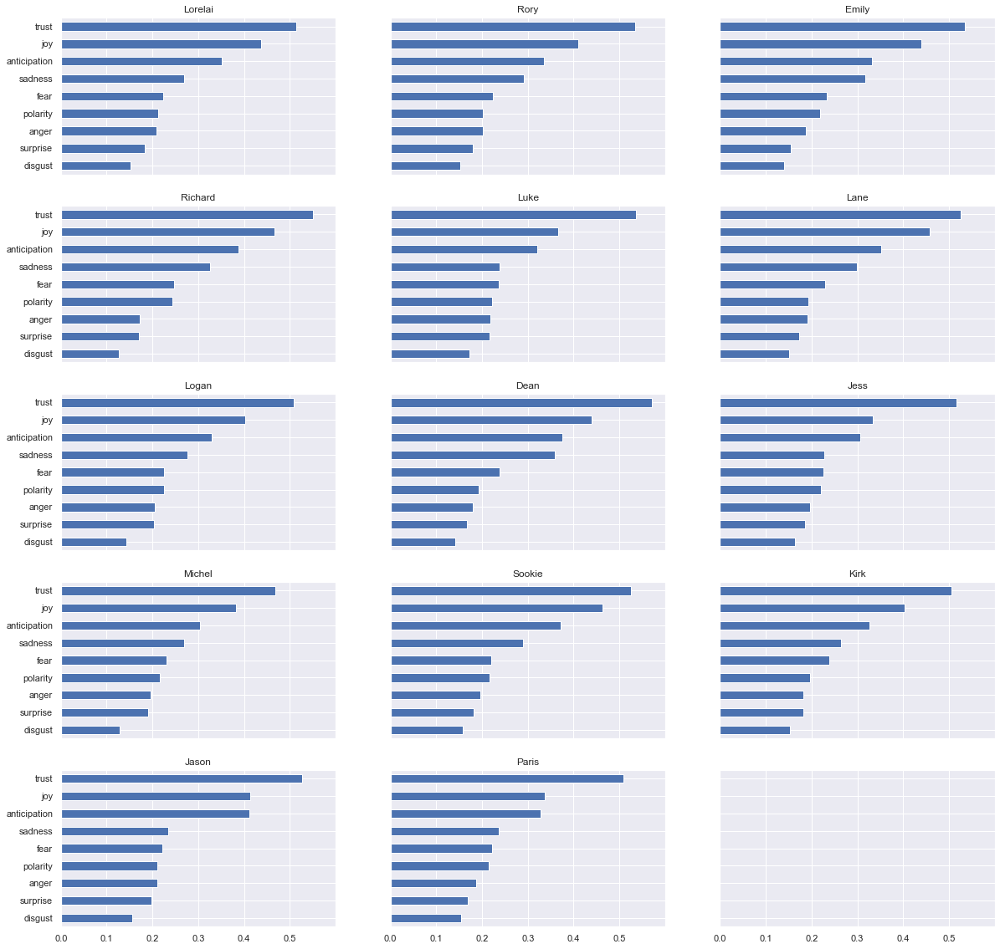

In [459]:
fig, axes = plt.subplots(nrows = 5, ncols=3, sharey=True, sharex = True, figsize=(20,20))
MAIN_SENTI.loc[lorelai, emo_cols].sort_values().plot.barh(ax=axes[0,0], title='Lorelai')
MAIN_SENTI.loc[rory, emo_cols].sort_values().plot.barh(ax=axes[0,1], title='Rory')
MAIN_SENTI.loc[emily, emo_cols].sort_values().plot.barh(ax=axes[0,2], title='Emily')
MAIN_SENTI.loc[richard, emo_cols].sort_values().plot.barh(ax=axes[1,0], title='Richard')
MAIN_SENTI.loc[luke, emo_cols].sort_values().plot.barh(ax=axes[1,1], title='Luke')
MAIN_SENTI.loc[lane, emo_cols].sort_values().plot.barh(ax=axes[1,2], title='Lane')
MAIN_SENTI.loc[logan, emo_cols].sort_values().plot.barh(ax=axes[2,0], title='Logan')
MAIN_SENTI.loc[dean, emo_cols].sort_values().plot.barh(ax=axes[2,1], title='Dean')
MAIN_SENTI.loc[jess, emo_cols].sort_values().plot.barh(ax=axes[2,2], title='Jess')
MAIN_SENTI.loc[michel, emo_cols].sort_values().plot.barh(ax=axes[3,0], title='Michel')
MAIN_SENTI.loc[sookie, emo_cols].sort_values().plot.barh(ax=axes[3,1], title='Sookie')
MAIN_SENTI.loc[kirk, emo_cols].sort_values().plot.barh(ax=axes[3,2], title='Kirk')
MAIN_SENTI.loc[jason, emo_cols].sort_values().plot.barh(ax=axes[4,0], title='Jason')
MAIN_SENTI.loc[paris, emo_cols].sort_values().plot.barh(ax=axes[4,1], title='Paris')

## Trust Words

In [269]:
trust_words = pd.Series(SALEX[SALEX['trust'] == 1].index.tolist())

In [270]:
len(trust_words)

935

In [271]:
trust_words.sample(10).to_list()

['vigilant',
 'practiced',
 'comrade',
 'bodyguard',
 'intimate',
 'stark',
 'cosmopolitan',
 'saintly',
 'title',
 'calls']

## Sentiment for Episodes

In [274]:
TOKENS.head()

pos_tuple pos  \
Season Episode line_num Character sent_num token_num                         
1      1       5        LORELAI   0        0          ('Please', 'VB')  VB   
                                           1            ('Luke', 'NN')  NN   
                                  1        0          ('Please', 'VB')  VB   
                                           1          ('please', 'NN')  NN   
                                           2          ('please', 'NN')  NN   

                                                     token_str term_str  \
Season Episode line_num Character sent_num token_num                      
1      1       5        LORELAI   0        0            Please   please   
                                           1              Luke     luke   
                                  1        0            Please   please   
                                           1            please   please   
                                           2            please   please   

                                                     pos_group  
Season Episode line_num Character sent_num token_num            
1      1       5        LORELAI   0        0                VB  
                                           1                NN  
                                  1        0                VB  
                                           1                NN  
                                           2                NN

In [275]:
VOCAB.head()

,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,stop,stem_porter,stem_snowball,stem_lancaster,max_pos_group
term_str,,,,,,,,,,,,,,
i,53349,1,0.045899,21.786969,4.445394,0.204039,PRP,2,"{'PRP', 'NN'}",1,i,i,i,PR
you,44496,3,0.038282,26.121741,4.707179,0.180202,PRP,2,"{'PRP', 'NN'}",1,you,you,you,PR
the,31072,3,0.026733,37.407087,5.225240,0.139686,DT,2,"{'NN', 'DT'}",1,the,the,the,DT
to,26174,2,0.022519,44.407160,5.472720,0.123240,TO,2,"{'NN', 'TO'}",1,to,to,to,TO
s,25469,1,0.021912,45.636381,5.512112,0.120783,NN,1,{'NN'},1,s,s,s,NN


In [278]:
#LIB_EPISODE = LIB_EPISODE.set_index(['Season','Episode'])
LIB_EPISODE

index           Show  Num_Episodes_per_Season  \
Season Episode                                                  
1      1            0  Gilmore Girls                       21   
       2            1  Gilmore Girls                       21   
       3            2  Gilmore Girls                       21   
       4            3  Gilmore Girls                       21   
       5            4  Gilmore Girls                       21   
...               ...            ...                      ...   
7      18         148  Gilmore Girls                       22   
       19         149  Gilmore Girls                       22   
       20         150  Gilmore Girls                       22   
       21         151  Gilmore Girls                       22   
       22         152  Gilmore Girls                       22   

                                              Title  Year  \
Season Episode                                              
1      1                                  The Pilot  2000   
       2         The Lorelai's First Day at Chilton  2000   
       3                                k*ll Me Now  2000   
       4                           The Deer Hunters  2000   
       5                    Rory's Birthday Parties  2000   
...                                             ...   ...   
7      18                             Hay Bale Maze  2007   
       19              It's Just Like Riding A Bike  2007   
       20                         Lorelai? Lorelai?  2007   
       21                           Unto The Breach  2007   
       22                                Bon Voyage  2007   

                Num_Lines_per_Episode              label  SEASON  EPISODE  
Season Episode                                                             
1      1                          630   S1xE1- The Pilot       1        1  
       2                          586   S1xE2- The Lorel       1        2  
       3                          698   S1xE3- k*ll Me N       1        3  
       4                          717   S1xE4- The Deer        1        4  
       5                          753   S1xE5- Rory's Bi       1        5  
...                               ...                ...     ...      ...  
7      18                         753  S7xE18- Hay Bale        7       18  
       19                         791  S7xE19- It's Just       7       19  
       20                         699  S7xE20- Lorelai?        7       20  
       21                         660  S7xE21- Unto The        7       21  
       22                         728  S7xE22- Bon Voyag       7       22  

[153 rows x 9 columns]

In [279]:
CHAR_INFO.head()

,Gender,Status,S1_Age,S2_Age,S3_Age,S4_Age,S5_Age,S6_Age,S7_Age
Character,,,,,,,,,
DEAN,M,Main,YA,YA,YA,YA,YA,YA,YA
EMILY,F,Main,OA,OA,OA,OA,OA,OA,OA
MICHEL,M,Main,Adult,Adult,Adult,Adult,Adult,Adult,Adult
PARIS,F,Main,YA,YA,YA,YA,YA,YA,YA
JASON,M,Main,Adult,Adult,Adult,Adult,Adult,Adult,Adult


In [280]:
BOW

n     tfidf        tf
Season Episode term_str                         
1      1       200         1  0.000189  0.000176
               314         1  0.000386  0.000176
               5           1  0.000077  0.000176
               7           1  0.000101  0.000176
               a         131  0.000000  0.023116
...                      ...       ...       ...
7      22      your       30  0.000000  0.004041
               yours       1  0.000018  0.000135
               yourself    1  0.000010  0.000135
               ziplock     1  0.000294  0.000135
               zipper      1  0.000189  0.000135

[214293 rows x 3 columns]

In [281]:
LIB_SEASON = LIB_SEASON.set_index('Season')
LIB_SEASON

,Show,Num_Episodes,Year,Num_Lines
Season,,,,
1,Gilmore Girls,21,2000,16031
2,Gilmore Girls,22,2001,18264
3,Gilmore Girls,22,2002,17699
4,Gilmore Girls,22,2003,17806
5,Gilmore Girls,22,2004,16737
6,Gilmore Girls,22,2005,16145
7,Gilmore Girls,22,2006,15188


In [282]:
class People(): pass
people = People()
for idx in CHAR_INFO.index:
    setattr(people, idx, idx)

In [283]:
class Episode(): pass
episode = Episode()
for idx in LIB_EPISODE.index:
    label = LIB_EPISODE.loc[idx].label
    label = label.replace('x','_')
    label = label.replace('- ','_')
    setattr(episode, label, idx)

In [284]:
#LIB_EPISODE = LIB_EPISODE.reset_index()

In [285]:
episode.S1_E10_Forgivene

(1, 10)

### Create COMBO

In [316]:
#TOKENS.join(LIB_EPISODE, on = ['Season','Episode'])

In [286]:
COMBO2 = TOKENS.join(SALEX, on = 'term_str').join(BOW, on = OHCO[:2]+['term_str']).join(CHAR_INFO, on = 'Character')

In [544]:
COMBO3 = COMBO2.reset_index().set_index(OHCO[:2]).join(LIB_EPISODE)
COMBO3

line_num Character  sent_num  token_num         pos_tuple  \
Season Episode                                                              
1      1               5   LORELAI         0          0  ('Please', 'VB')   
       1               5   LORELAI         0          1    ('Luke', 'NN')   
       1               5   LORELAI         1          0  ('Please', 'VB')   
       1               5   LORELAI         1          1  ('please', 'NN')   
       1               5   LORELAI         1          2  ('please', 'NN')   
...                  ...       ...       ...        ...               ...   
7      22            810   LORELAI         0          8  ('your', 'PRP$')   
       22            810   LORELAI         0          9   ('stuff', 'NN')   
       22            811      RORY         0          0      ('I', 'PRP')   
       22            811      RORY         0          1   ('guess', 'NN')   
       22            811      RORY         0          2      ('so', 'RB')   

                 pos token_str term_str pos_group  anger  ...  S7_Age  index  \
Season Episode                                            ...                  
1      1          VB    Please   please        VB    NaN  ...   Adult      0   
       1          NN      Luke     luke        NN    NaN  ...   Adult      0   
       1          VB    Please   please        VB    NaN  ...   Adult      0   
       1          NN    please   please        NN    NaN  ...   Adult      0   
       1          NN    please   please        NN    NaN  ...   Adult      0   
...              ...       ...      ...       ...    ...  ...     ...    ...   
7      22       PRP$      your     your        PR    NaN  ...   Adult    152   
       22         NN     stuff    stuff        NN    NaN  ...   Adult    152   
       22        PRP         I        i        PR    NaN  ...      YA    152   
       22         NN     guess    guess        NN    NaN  ...      YA    152   
       22         RB        so       so        RB    NaN  ...      YA    152   

                         Show  Num_Episodes_per_Season        Title  Year  \
Season Episode                                                              
1      1        Gilmore Girls                       21    The Pilot  2000   
       1        Gilmore Girls                       21    The Pilot  2000   
       1        Gilmore Girls                       21    The Pilot  2000   
       1        Gilmore Girls                       21    The Pilot  2000   
       1        Gilmore Girls                       21    The Pilot  2000   
...                       ...                      ...          ...   ...   
7      22       Gilmore Girls                       22   Bon Voyage  2007   
       22       Gilmore Girls                       22   Bon Voyage  2007   
       22       Gilmore Girls                       22   Bon Voyage  2007   
       22       Gilmore Girls                       22   Bon Voyage  2007   
       22       Gilmore Girls                       22   Bon Voyage  2007   

                Num_Lines_per_Episode              label  SEASON  EPISODE  
Season Episode                                                             
1      1                          630   S1xE1- The Pilot       1        1  
       1                          630   S1xE1- The Pilot       1        1  
       1                          630   S1xE1- The Pilot       1        1  
       1                          630   S1xE1- The Pilot       1        1  
       1                          630   S1xE1- The Pilot       1        1  
...                               ...                ...     ...      ...  
7      22                         728  S7xE22- Bon Voyag       7       22  
       22                         728  S7xE22- Bon Voyag       7       22  
       22                         728  S7xE22- Bon Voyag       7       22  
       22                         728  S7xE22- Bon Voyag       7       22  
       22                         728  S7xE22- Bon Voyag   

In [554]:
#save output
#COMBO.to_csv(f'{data_home}/output/{data_prefix}-COMBO.csv')
#COMBO2.to_csv(f'{data_home}/output/{data_prefix}-COMBO2.csv')
#COMBO3.to_csv(f'{data_home}/output/{data_prefix}-COMBO3.csv')

### Sentiment by Season

In [287]:
SEASON = COMBO2.groupby(OHCO[:1])[emo_cols].mean()

In [288]:
SEASON.style.background_gradient(cmap= gradient_cmap, axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
Season,,,,,,,,,
1,0.168272,0.342185,0.146258,0.197578,0.438360,0.230050,0.207072,0.537975,0.297331
2,0.185844,0.337826,0.153001,0.206795,0.413477,0.226048,0.209853,0.525595,0.278709
3,0.186410,0.361226,0.145546,0.202938,0.432277,0.225436,0.222222,0.522727,0.290060
4,0.189891,0.346009,0.160723,0.199811,0.423240,0.229688,0.207251,0.516533,0.261691
5,0.186265,0.336627,0.156747,0.211687,0.418072,0.234819,0.205301,0.515783,0.248916
6,0.189062,0.335573,0.155116,0.212753,0.401815,0.227251,0.202027,0.509547,0.250707
7,0.168288,0.350287,0.142037,0.209657,0.433845,0.215165,0.209071,0.525138,0.316887


inference: not too surprising. Good foundational relationships even if a bit rocky (e.g., mandatory friday night dinner with parents/grandparents). Comedy show therefore we expect joy. And you need some sort of anticipation to be a successful tv show that ran for 7 season

In [289]:
px.bar(SEASON.reset_index().sort_values('polarity'), emo_cols, 'Season',orientation='h', height=400)

In [290]:
px.bar(SEASON.reset_index().sort_values('polarity'), 'polarity', 'Season', orientation='h', height=400)

inference: notice how Seasons 4, 5, and 6 have the lowest polarity. 

In **Season 4**, Rory starts attending Yale Univeristy. While she is bright young lady, she finds herself struggling academically and eventually is told to lessen her workload. This comes as shock to her. At the same time, Lorelai is opening her own business with best friend Sookie but plans don't go perfectly. She struggles to stay within budget to open her Inn according to plan. At one point, this is emphasized in the episodes with Rory needing to get a job to cover her own expenses and Lorelai saving money by turning off all her lights and cancelling her tv subscription. As a college student and young business owner, Rory and Lorelai both find themselves struggling in various ways (emotionally, financially, etc) during this season. Paris' college professor and boyfriend also dies at the end of this season so as imagined things get a little bleak for Paris, Rory's good friend. Lorelai and her current boyfriend, Jason, breakup during this season after Jason chooses sue Lorelai's dad for breaking their business partnership. And the season ends with Rory and Lorelai having a huge fight about a poor choice Rory made. It's made known that the two spend the summer apart from each with no contact.  

In **Season 5**, the drama continues or more like ebs and flows. After returning home from a European trip with Emily, Rory apologizes to Lorelai and life continues. Emily and Richard also separate during this season and live in different parts of their property. But later the two make up and renew their wedding vows through a big wedding party. At this party, Lorelai chooses to cut off ties with her mother after Emily meddles with Lorelai's life to encourage Christopher (Rory's dad) in pursuing her. Tensions are high with the common theme of familial seperations and romantic relationship developments. To end the season, Rory receives a terrible review from her boss (Logan's dad), steals a yatch, and gets arrested. The season ends with Rory unenrolling from college, and moving into her grandparents house leaving Rory and Lorelai estranged.  

In **Season 6**, Lorelai and Rory both struggle being estranged from each other which lasts 6 months.... Paris meltdown. Bad apartment. Rory and Logan long distance relationship. Serious crash for Logan. Lorelai's wedding gets cancelled after Luke learns about a teenage daughter he never knew he had.  

### Mean Sentiment by Episode

In [549]:
EPISODES = COMBO3.groupby(OHCO[:2])[emo_cols+['tfidf']].mean().join(LIB_EPISODE['label'])

In [550]:
EPISODES.sort_values('polarity', ascending = False).style.background_gradient(cmap='GnBu', axis=None)

In [611]:
px.bar(EPISODES.reset_index(), emo_cols, 'label', orientation='h', height=1200)

In [292]:
EPISODES.loc[1].style.background_gradient(cmap='GnBu', axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,tfidf
Episode,,,,,,,,,,
1,0.159011,0.406360,0.127208,0.183746,0.530035,0.183746,0.229682,0.632509,0.466431,0.000048
2,0.145833,0.295833,0.175000,0.220833,0.437500,0.258333,0.200000,0.537500,0.258333,0.000061
3,0.203822,0.382166,0.171975,0.277070,0.509554,0.213376,0.226115,0.538217,0.315287,0.000073
4,0.219941,0.278592,0.152493,0.187683,0.351906,0.260997,0.178886,0.463343,0.114370,0.000076
5,0.125000,0.469444,0.111111,0.175000,0.555556,0.191667,0.330556,0.516667,0.450000,0.000062
6,0.105839,0.317518,0.109489,0.175182,0.361314,0.204380,0.171533,0.565693,0.383212,0.000066
7,0.162602,0.346883,0.173442,0.203252,0.447154,0.252033,0.224932,0.498645,0.273713,0.000056
8,0.225895,0.305785,0.190083,0.198347,0.410468,0.231405,0.181818,0.454545,0.137741,0.000059
9,0.149871,0.258398,0.134367,0.206718,0.441860,0.198966,0.193798,0.591731,0.328165,0.000045


In [293]:
EPISODES.loc[4].style.background_gradient(cmap='GnBu', axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,tfidf
Episode,,,,,,,,,,
1,0.153226,0.384409,0.142473,0.177419,0.473118,0.201613,0.258065,0.456989,0.370968,0.000056
2,0.137830,0.331378,0.152493,0.161290,0.401760,0.246334,0.225806,0.513196,0.240469,0.000090
3,0.151042,0.333333,0.169271,0.138021,0.445312,0.187500,0.187500,0.510417,0.294271,0.000046
4,0.148585,0.363208,0.129717,0.202830,0.370283,0.224057,0.245283,0.485849,0.188679,0.000057
5,0.187793,0.347418,0.161972,0.244131,0.427230,0.239437,0.180751,0.549296,0.183099,0.000052
6,0.227166,0.416862,0.170960,0.142857,0.470726,0.264637,0.208431,0.583138,0.374707,0.000055
7,0.187970,0.360902,0.137845,0.250627,0.478697,0.230576,0.250627,0.461153,0.235589,0.000090
8,0.174757,0.330097,0.153398,0.182524,0.452427,0.229126,0.234951,0.514563,0.297087,0.000084
9,0.159091,0.404040,0.148990,0.154040,0.522727,0.179293,0.166667,0.527778,0.431818,0.000072


In [294]:
EPISODES.loc[5].style.background_gradient(cmap='GnBu', axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,tfidf
Episode,,,,,,,,,,
1,0.156250,0.416667,0.107639,0.246528,0.479167,0.201389,0.215278,0.607639,0.406250,0.000042
2,0.198324,0.351955,0.173184,0.243017,0.416201,0.215084,0.203911,0.469274,0.217877,0.000066
3,0.146597,0.303665,0.146597,0.183246,0.416230,0.225131,0.185864,0.507853,0.290576,0.000056
4,0.249307,0.321330,0.202216,0.243767,0.382271,0.293629,0.252078,0.448753,0.102493,0.000078
5,0.156627,0.298795,0.175904,0.207229,0.402410,0.219277,0.200000,0.501205,0.185542,0.000065
6,0.202073,0.251295,0.189119,0.209845,0.321244,0.243523,0.155440,0.533679,0.178756,0.000060
7,0.175000,0.311111,0.116667,0.227778,0.391667,0.236111,0.236111,0.494444,0.247222,0.000065
8,0.203125,0.343750,0.177083,0.223958,0.419271,0.250000,0.205729,0.505208,0.190104,0.000051
9,0.194521,0.336986,0.156164,0.230137,0.413699,0.232877,0.183562,0.498630,0.221918,0.000054


In [295]:
EPISODES.loc[6].style.background_gradient(cmap='GnBu', axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,tfidf
Episode,,,,,,,,,,
1,0.193798,0.359173,0.157623,0.276486,0.379845,0.255814,0.183463,0.496124,0.235142,0.000057
2,0.184659,0.360795,0.170455,0.173295,0.392045,0.170455,0.190341,0.491477,0.170455,0.000073
3,0.194286,0.311429,0.160000,0.231429,0.374286,0.245714,0.202857,0.542857,0.231429,0.000067
4,0.163743,0.353801,0.119883,0.195906,0.476608,0.181287,0.207602,0.552632,0.356725,0.000071
5,0.237960,0.351275,0.184136,0.235127,0.413598,0.263456,0.240793,0.492918,0.169972,0.000066
6,0.148058,0.337379,0.126214,0.177184,0.385922,0.223301,0.235437,0.521845,0.271845,0.000093
7,0.181122,0.418367,0.155612,0.193878,0.505102,0.255102,0.278061,0.441327,0.293367,0.000065
8,0.188264,0.337408,0.149144,0.234719,0.366748,0.224939,0.212714,0.542787,0.254279,0.000052
9,0.177966,0.316384,0.144068,0.180791,0.327684,0.274011,0.158192,0.539548,0.214689,0.000052


In [296]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

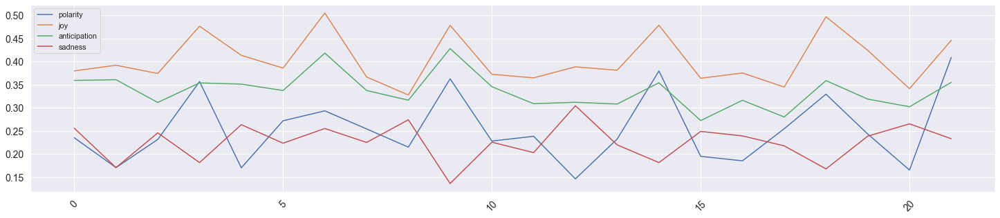

In [297]:
#Season 6
plot_sentiments(EPISODES.loc[6].reset_index(), ['polarity', 'joy', 'anticipation','sadness'])

Insight:  
Positive:  
- Episode 4: False positive. Baptism for Sookie's children but Lorelai and Rory don't get along at the event.  
- Episode 10: Christopher visits and offers to help pay for Yale.  
- Episode 15: Rory and Lorelai celebrate Valentine's Day with their boyfriends.   
- Episode 19: Lane gets married!  

Negative:  
- Episode 5: Rory hosts DAR party. She runs into her boyfriend's parents who caused her to leave Yale and why she has her current job.  
- Episode 13: Lorelai and Luke postpone their wedding. Paris has a breakdown, most of the staff quit, and they struggle to get the paper printed. Richard and Emily are upset that Christopher decided to pay for Yale.  
- Episode 21: Rory and Lorelai both take care of someone with medical problems.  

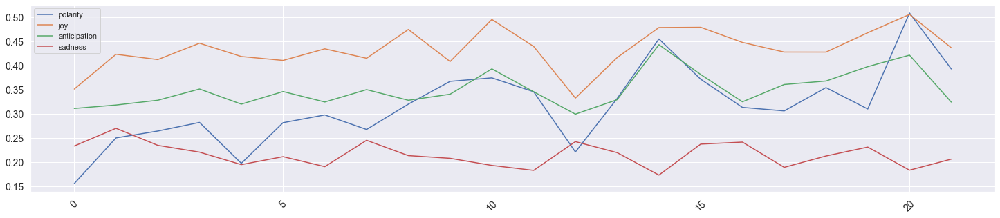

In [298]:
#Season 7
plot_sentiments(EPISODES.loc[7].reset_index(), ['polarity', 'joy', 'anticipation','sadness'])

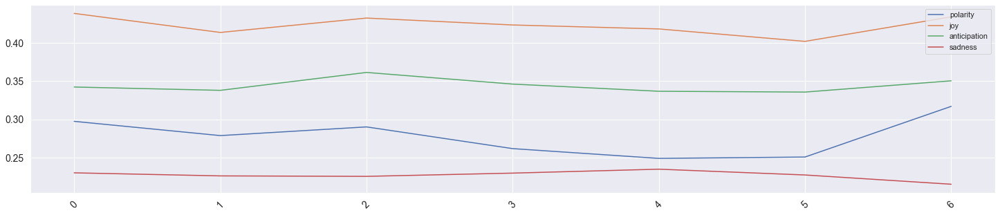

In [299]:
plot_sentiments(SEASON.reset_index(), ['polarity', 'joy', 'anticipation','sadness'])

### Vader

In [300]:
analyser = SentimentIntensityAnalyzer()

In [301]:
#vader works from sentence unit
SENTENCES = COMBO2.groupby(OHCO[:-1])[emo_cols].mean()

In [302]:
SENTENCES['sent_str'] = COMBO2.groupby(OHCO[:-1]).term_str.apply(lambda x: x.str.cat(sep=' '))

In [303]:
vader_cols = [f"vader_{col}" for col in "neg neu pos compound".split()]
SENTENCES[vader_cols] = SENTENCES.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))

In [304]:
SENTENCES.head()

anger  anticipation  disgust  \
Season Episode line_num Character sent_num                                 
1      1       5        LORELAI   0           NaN           NaN      NaN   
                                  1           NaN           NaN      NaN   
               6        LUKE      0           NaN           NaN      NaN   
               7        LORELAI   0           NaN           NaN      NaN   
               8        LUKE      0           NaN           NaN      NaN   

                                            fear  joy  sadness  surprise  \
Season Episode line_num Character sent_num                                 
1      1       5        LORELAI   0          NaN  NaN      NaN       NaN   
                                  1          NaN  NaN      NaN       NaN   
               6        LUKE      0          NaN  NaN      NaN       NaN   
               7        LORELAI   0          NaN  NaN      NaN       NaN   
               8        LUKE      0          NaN  NaN      NaN       NaN   

                                            trust  polarity  \
Season Episode line_num Character sent_num                    
1      1       5        LORELAI   0           NaN       NaN   
                                  1           NaN       NaN   
               6        LUKE      0           NaN       NaN   
               7        LORELAI   0           NaN       NaN   
               8        LUKE      0           NaN       NaN   

                                                                           sent_str  \
Season Episode line_num Character sent_num                                            
1      1       5        LORELAI   0                                     please luke   
                                  1                            please please please   
               6        LUKE      0         how many cups have you had this morning   
               7        LORELAI   0                                            none   
               8        LUKE      0                                            plus   

                                            vader_neg  vader_neu  vader_pos  \
Season Episode line_num Character sent_num                                    
1      1       5        LORELAI   0               0.0      0.303      0.697   
                                  1               0.0      0.000      1.000   
               6        LUKE      0               0.0      1.000      0.000   
               7        LORELAI   0               0.0      1.000      0.000   
               8        LUKE      0               0.0      1.000      0.000   

                                            vader_compound  
Season Episode line_num Character sent_num                  
1      1       5        LORELAI   0                 0.3182  
                                  1                 0.7096  
               6        LUKE      0                 0.0000  
               7        LORELAI   0                 0.0000  
               8        LUKE      0                 0.0000

In [305]:
FIG = dict(figsize=(30, 10), legend=True, fontsize=14, rot=45)

In [306]:
def vader_plot(season):
    global SENTENCES
    X = SENTENCES.loc[season]
    w = int(len(X)/5)
    fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(25,20))
    X[['vader_pos','vader_neg']].rolling(w).mean().plot(ax=axes[0], title=f'{season}\npos, neg {w}');
    X['vader_neu'].rolling(w).mean().plot(ax=axes[1], title=f'{season}\nneu');
    X['vader_compound'].rolling(w).mean().plot(ax=axes[2], title=f'{season}\ncompound');

In [307]:
def compare_all_seasons(Seas1, Seas2, Seas3, Seas4, Seas5, Seas6, Seas7, w=10, emo='vader_compound'):
    global SENTENCES, FIG
    
    S1 = SENTENCES.loc[Seas1].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S1['cut'] = pd.cut(S1.seq, 100)
    Sx1 = S1.groupby('cut')[emo].mean().reset_index(drop=True)

    S2 = SENTENCES.loc[Seas2].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S2['cut'] = pd.cut(S2.seq, 100)
    Sx2 = S2.groupby('cut')[emo].mean().reset_index(drop=True)
    
    S3 = SENTENCES.loc[Seas3].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S3['cut'] = pd.cut(S3.seq, 100)
    Sx3 = S3.groupby('cut')[emo].mean().reset_index(drop=True)

    S4 = SENTENCES.loc[Seas4].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S4['cut'] = pd.cut(S4.seq, 100)
    Sx4 = S4.groupby('cut')[emo].mean().reset_index(drop=True)

    S5 = SENTENCES.loc[Seas5].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S5['cut'] = pd.cut(S5.seq, 100)
    Sx5 = S5.groupby('cut')[emo].mean().reset_index(drop=True)

    S6 = SENTENCES.loc[Seas6].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S6['cut'] = pd.cut(S6.seq, 100)
    Sx6 = S6.groupby('cut')[emo].mean().reset_index(drop=True)

    S7 = SENTENCES.loc[Seas7].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S7['cut'] = pd.cut(S7.seq, 100)
    Sx7 = S7.groupby('cut')[emo].mean().reset_index(drop=True)


    C = pd.concat([Sx1,Sx2,Sx3,Sx4,Sx5,Sx6,Sx7], axis=1)
    C.columns = [Seas1, Seas2, Seas3, Seas4, Seas5, Seas6, Seas7]

    plt = C.rolling(w).mean().plot(**FIG)

In [308]:
def compare_two_seasons(Seas1, Seas2, w=10, emo='vader_compound'):
    global SENTENCES, FIG
    
    S1 = SENTENCES.loc[Seas1].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S1['cut'] = pd.cut(S1.seq, 100)
    Sx1 = S1.groupby('cut')[emo].mean().reset_index(drop=True)

    S2 = SENTENCES.loc[Seas2].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S2['cut'] = pd.cut(S2.seq, 100)
    Sx2 = S2.groupby('cut')[emo].mean().reset_index(drop=True)

    C = pd.concat([Sx1,Sx2], axis=1)
    C.columns = [Seas1, Seas2]

    plt = C.rolling(w).mean().plot(**FIG)

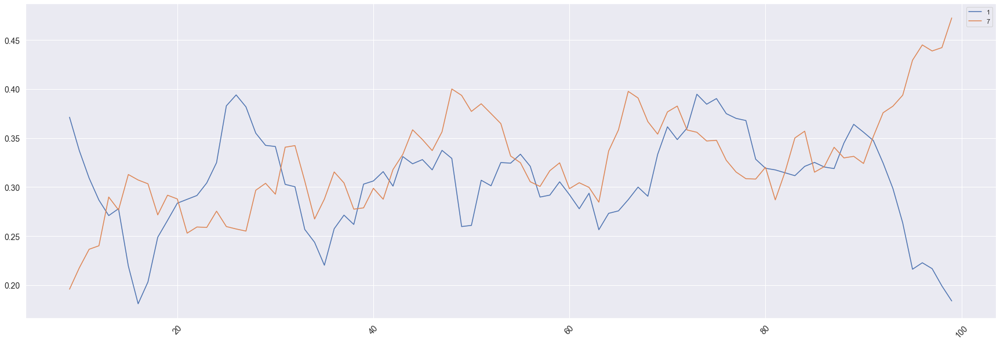

In [309]:
#first and last season comparison
compare_two_seasons(1,7, emo='polarity')

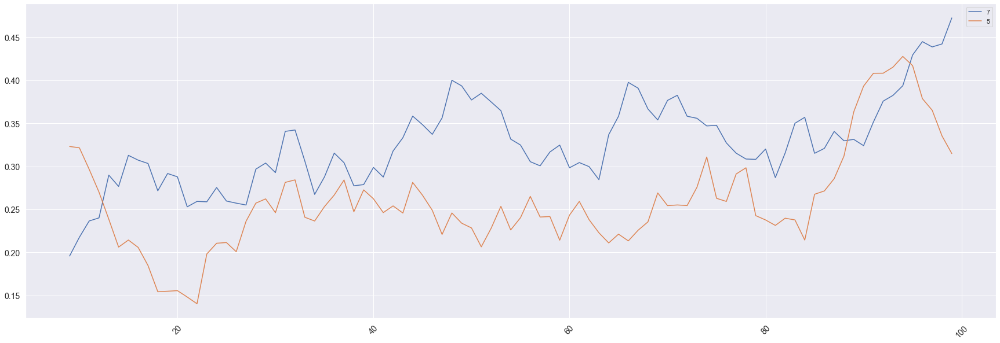

In [310]:
#most positive and most negative
compare_two_seasons(7,5, emo='polarity')

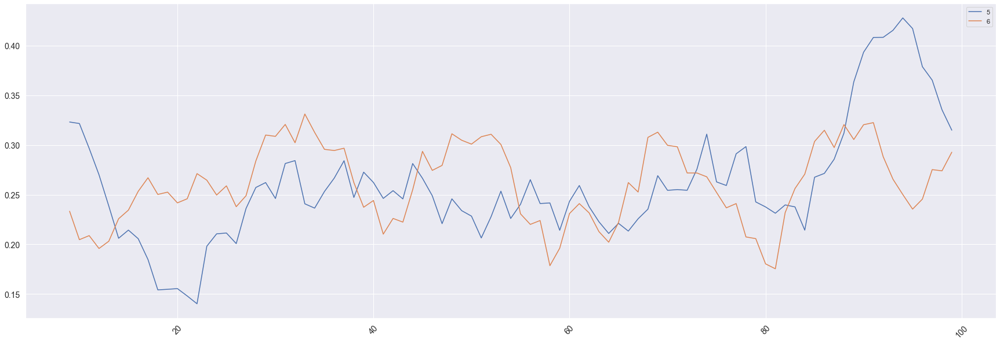

In [311]:
#two most negative
compare_two_seasons(5,6, emo='polarity')

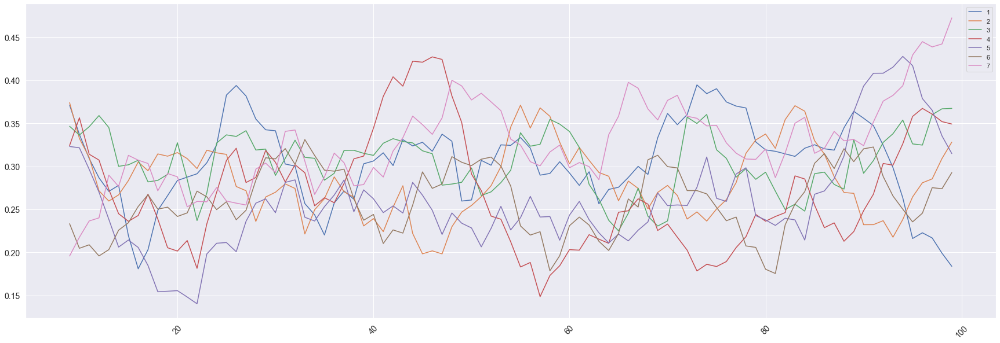

In [312]:
#compare all 7 seasons
compare_all_seasons(1, 2, 3, 4, 5, 6, 7, emo='polarity')

### Vader for the Entire Show

In [315]:
TOKENS_SHOW = CORPUS_SHOW.copy()

In [316]:
COMBO_SHOW = TOKENS_SHOW[['term_str']].merge(SALEXC, on = 'term_str', how = 'left').set_index(TOKENS_SHOW.index)

In [317]:
COMBO_SHOW2 = TOKENS_SHOW.join(SALEX, on = 'term_str').join(BOW_SHOW, on = OHCO_SHOW[:1]+['term_str']).join(CHAR_INFO, on = 'Character')

In [318]:
COMBO_SHOW2

pos_tuple  \
Show          Season Episode line_num Character sent_num token_num                     
Gilmore_Girls 1      1       5        LORELAI   0        0          ('Please', 'VB')   
                                                         1            ('Luke', 'NN')   
                                                1        0          ('Please', 'VB')   
                                                         1          ('please', 'NN')   
                                                         2          ('please', 'NN')   
...                                                                              ...   
              7      22      810      LORELAI   0        8          ('your', 'PRP$')   
                                                         9           ('stuff', 'NN')   
                             811      RORY      0        0              ('I', 'PRP')   
                                                         1           ('guess', 'NN')   
                                                         2              ('so', 'RB')   

                                                                     pos  \
Show          Season Episode line_num Character sent_num token_num         
Gilmore_Girls 1      1       5        LORELAI   0        0            VB   
                                                         1            NN   
                                                1        0            VB   
                                                         1            NN   
                                                         2            NN   
...                                                                  ...   
              7      22      810      LORELAI   0        8          PRP$   
                                                         9            NN   
                             811      RORY      0        0           PRP   
                                                         1            NN   
                                                         2            RB   

                                                                   token_str  \
Show          Season Episode line_num Character sent_num token_num             
Gilmore_Girls 1      1       5        LORELAI   0        0            Please   
                                                         1              Luke   
                                                1        0            Please   
                                                         1            please   
                                                         2            please   
...                                                                      ...   
              7      22      810      LORELAI   0        8              your   
                                                         9             stuff   
                             811      RORY      0        0                 I   
                                                         1             guess   
                                                         2                so   

                                                                   term_str  \
Show          Season Episode line_num Character sent_num token_num            
Gilmore_Girls 1      1       5        LORELAI   0        0           please   
                                                         1             luke   
                                                1        0           please   
                                                         1           please   
                                                         2           please   
...                                                                     ...   
              7      22      810      LORELAI   0        8             your   
                                                         9            stuff   
                             811      RORY      0        0                i   
                               

In [319]:
SENTENCES_SHOW = COMBO_SHOW2.groupby(OHCO_SHOW[:-1])[emo_cols].mean()

In [320]:
SENTENCES_SHOW['sent_str'] = COMBO_SHOW2.groupby(OHCO_SHOW[:-1]).term_str.apply(lambda x: x.str.cat(sep=' '))

In [321]:
#vader_cols = [f"vader_{col}" for col in "neg neu pos compound".split()]
SENTENCES_SHOW[vader_cols] = SENTENCES_SHOW.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))

In [322]:
def vader_plot_show(show):
    global SENTENCES_SHOW
    X = SENTENCES_SHOW.loc[show]
    w = int(len(X)/5)
    fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(25,20))
    X[['vader_pos','vader_neg']].rolling(w).mean().plot(ax=axes[0], title=f'{show}\npos, neg {w}');
    X['vader_neu'].rolling(w).mean().plot(ax=axes[1], title=f'{show}\nneu');
    X['vader_compound'].rolling(w).mean().plot(ax=axes[2], title=f'{show}\ncompound');

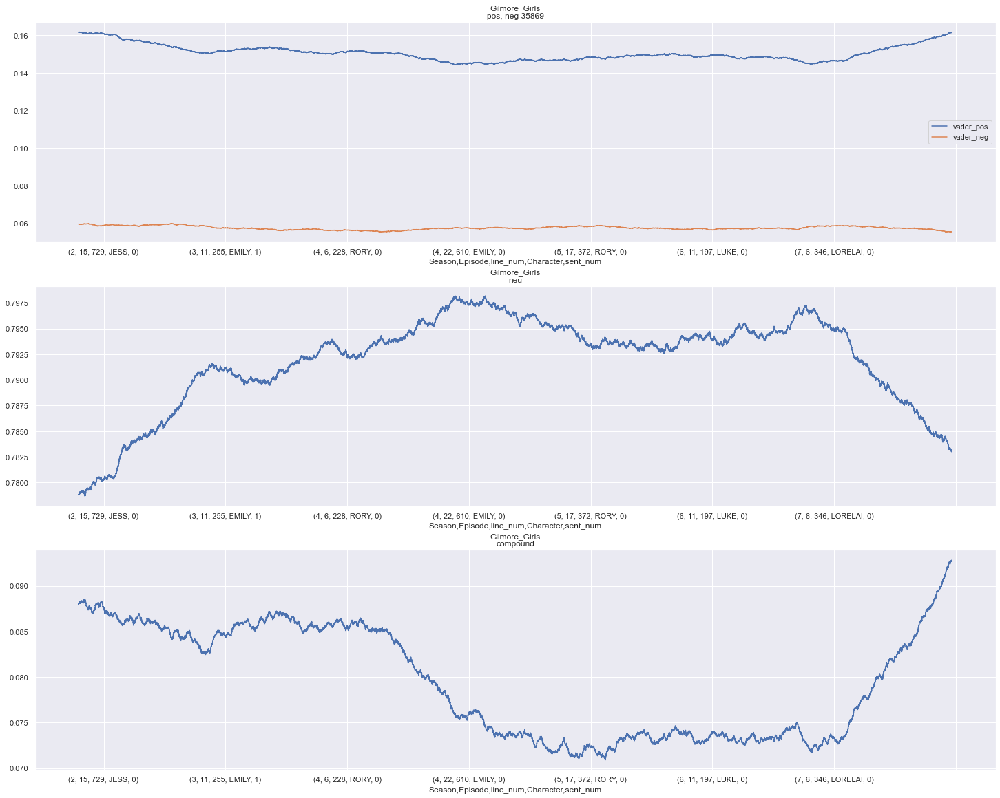

In [323]:
vader_plot_show('Gilmore_Girls')

In [324]:
def plot_show(Show, w=10, emo='vader_compound'):
    global SENTENCES_SHOW, FIG
    
    S1 = SENTENCES_SHOW.loc[Show].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    S1['cut'] = pd.cut(S1.seq, 100)
    Sx1 = S1.groupby('cut')[emo].mean().reset_index(drop=True)

    plt = Sx1.plot(**FIG)

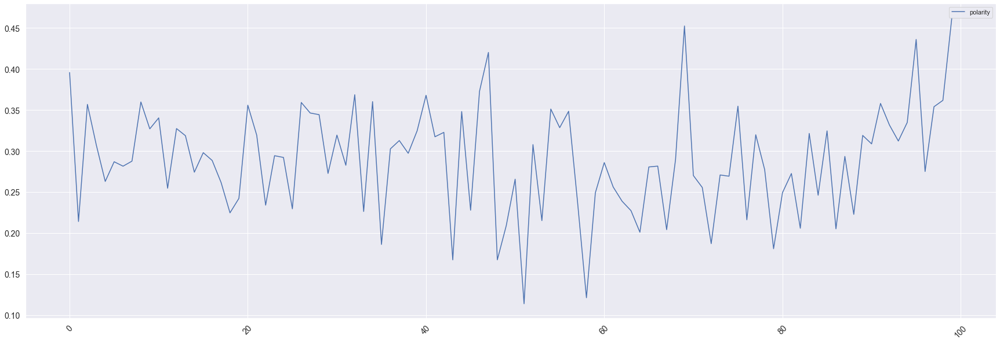

In [325]:
plot_show('Gilmore_Girls', emo='polarity')

# More Sentiment Analysis

In [326]:
SALEXC.head()

,nrc_anger,nrc_anticipation,nrc_disgust,nrc_fear,nrc_joy,nrc_negative,nrc_positive,nrc_sadness,nrc_surprise,nrc_trust,nrc_polarity,bing_negative,bing_positive,bing_sentiment,syu_sentiment,gi_sentiment
term_str,,,,,,,,,,,,,,,,
abandon,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.75,-1.0
abandoned,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.50,NaN
abandoner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN
abandonment,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,-1.0,NaN,NaN,NaN,-0.25,-1.0
abandons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.00,NaN


In [327]:
TOKENS#.sort_index()

pos_tuple   pos  \
Season Episode line_num Character sent_num token_num                           
1      1       5        LORELAI   0        0          ('Please', 'VB')    VB   
                                           1            ('Luke', 'NN')    NN   
                                  1        0          ('Please', 'VB')    VB   
                                           1          ('please', 'NN')    NN   
                                           2          ('please', 'NN')    NN   
...                                                                ...   ...   
7      22      810      LORELAI   0        8          ('your', 'PRP$')  PRP$   
                                           9           ('stuff', 'NN')    NN   
               811      RORY      0        0              ('I', 'PRP')   PRP   
                                           1           ('guess', 'NN')    NN   
                                           2              ('so', 'RB')    RB   

                                                     token_str term_str  \
Season Episode line_num Character sent_num token_num                      
1      1       5        LORELAI   0        0            Please   please   
                                           1              Luke     luke   
                                  1        0            Please   please   
                                           1            please   please   
                                           2            please   please   
...                                                        ...      ...   
7      22      810      LORELAI   0        8              your     your   
                                           9             stuff    stuff   
               811      RORY      0        0                 I        i   
                                           1             guess    guess   
                                           2                so       so   

                                                     pos_group  
Season Episode line_num Character sent_num token_num            
1      1       5        LORELAI   0        0                VB  
                                           1                NN  
                                  1        0                VB  
                                           1                NN  
                                           2                NN  
...                                                        ...  
7      22      810      LORELAI   0        8                PR  
                                           9                NN  
               811      RORY      0        0                PR  
                                           1                NN  
                                           2                RB  

[1162313 rows x 5 columns]

In [328]:
#vocab
VOCAB.head()

,n,n_chars,p,s,i,h,max_pos,n_pos,cat_pos,stop,stem_porter,stem_snowball,stem_lancaster,max_pos_group
term_str,,,,,,,,,,,,,,
i,53349,1,0.045899,21.786969,4.445394,0.204039,PRP,2,"{'PRP', 'NN'}",1,i,i,i,PR
you,44496,3,0.038282,26.121741,4.707179,0.180202,PRP,2,"{'PRP', 'NN'}",1,you,you,you,PR
the,31072,3,0.026733,37.407087,5.225240,0.139686,DT,2,"{'NN', 'DT'}",1,the,the,the,DT
to,26174,2,0.022519,44.407160,5.472720,0.123240,TO,2,"{'NN', 'TO'}",1,to,to,to,TO
s,25469,1,0.021912,45.636381,5.512112,0.120783,NN,1,{'NN'},1,s,s,s,NN


In [329]:
#get intersection of terms
COMBO_IDX = VOCAB.join(SALEXC, how = 'inner').index

In [330]:
VOCAB_C = VOCAB.loc[COMBO_IDX]
SALEXC2 = SALEXC.loc[COMBO_IDX]

In [331]:
VOCAB_C.p.sort_values()

term_str
uninformed       8.603535e-07
craven           8.603535e-07
undisputed       8.603535e-07
stalk            8.603535e-07
individuality    8.603535e-07
                     ...     
like             4.387803e-03
don              5.675752e-03
well             6.147225e-03
know             6.381242e-03
just             6.760657e-03
Name: p, Length: 5988, dtype: float64

In [332]:
SALEXC2

,nrc_anger,nrc_anticipation,nrc_disgust,nrc_fear,nrc_joy,nrc_negative,nrc_positive,nrc_sadness,nrc_surprise,nrc_trust,nrc_polarity,bing_negative,bing_positive,bing_sentiment,syu_sentiment,gi_sentiment
term_str,,,,,,,,,,,,,,,,
just,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
well,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,0.80,1.0
don,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
like,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,1.0,0.50,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
passionate,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.75,1.0
fete,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,NaN,NaN,NaN,0.40,NaN
vertigo,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-1.0,NaN,NaN,NaN,-0.50,NaN


In [333]:
#words per episode used to compute mean sentiment
DOC = TOKENS.groupby(OHCO[:2]).term_str.count().to_frame('n')
DOC.head()

n
Season Episode      
1      1        5667
       2        5389
       3        6123
       4        6459
       5        6599

## Method A: TOKEN + SALEXC
- Method A1 is consistent with all other measures and the fastest.
- Method A2 is convenient and useful but not correct.

In [334]:
COMBO_C = TOKENS[['term_str']].merge(SALEXC, on = 'term_str', how = 'left').set_index(TOKENS.index)

In [335]:
COMBO_C.head()

term_str  nrc_anger  \
Season Episode line_num Character sent_num token_num                       
1      1       5        LORELAI   0        0           please        NaN   
                                           1             luke        NaN   
                                  1        0           please        NaN   
                                           1           please        NaN   
                                           2           please        NaN   

                                                      nrc_anticipation  \
Season Episode line_num Character sent_num token_num                     
1      1       5        LORELAI   0        0                       NaN   
                                           1                       NaN   
                                  1        0                       NaN   
                                           1                       NaN   
                                           2                       NaN   

                                                      nrc_disgust  nrc_fear  \
Season Episode line_num Character sent_num token_num                          
1      1       5        LORELAI   0        0                  NaN       NaN   
                                           1                  NaN       NaN   
                                  1        0                  NaN       NaN   
                                           1                  NaN       NaN   
                                           2                  NaN       NaN   

                                                      nrc_joy  nrc_negative  \
Season Episode line_num Character sent_num token_num                          
1      1       5        LORELAI   0        0              NaN           NaN   
                                           1              NaN           NaN   
                                  1        0              NaN           NaN   
                                           1              NaN           NaN   
                                           2              NaN           NaN   

                                                      nrc_positive  \
Season Episode line_num Character sent_num token_num                 
1      1       5        LORELAI   0        0                   NaN   
                                           1                   NaN   
                                  1        0                   NaN   
                                           1                   NaN   
                                           2                   NaN   

                                                      nrc_sadness  \
Season Episode line_num Character sent_num token_num                
1      1       5        LORELAI   0        0                  NaN   
                                           1                  NaN   
                                  1        0                  NaN   
                                           1                  NaN   
                                           2                  NaN   

                                                      nrc_surprise  nrc_trust  \
Season Episode line_num Character sent_num token_num                            
1      1       5        LORELAI   0        0                   NaN        NaN   
                                           1                   NaN        NaN   
                                  1        0                   NaN        NaN   
                                           1                   NaN        NaN   
                                           2                   NaN        NaN   

                                                      nrc_polarity  \
Season Episode line_num Character sent_num token_num                 
1      1       5        LORELAI   0        0                   NaN   
                                           1                   NaN   
                                  1        0                   NaN   


### A1: Absolute Mean (Proper Way)

In [336]:
#mean by all tokens
A1_epi = (COMBO_C.groupby(OHCO[:2])[SALEXC.columns].sum().T / DOC.n).T

In [337]:
A1_epi

nrc_anger  nrc_anticipation  nrc_disgust  nrc_fear   nrc_joy  \
Season Episode                                                                 
1      1         0.007941          0.020293     0.006353  0.009176  0.026469   
       2         0.006495          0.013175     0.007794  0.009835  0.019484   
       3         0.010452          0.019598     0.008819  0.014209  0.026131   
       4         0.011612          0.014708     0.008051  0.009909  0.018579   
       5         0.006819          0.025610     0.006062  0.009547  0.030308   
...                   ...               ...          ...       ...       ...   
7      18        0.006699          0.017988     0.004342  0.009056  0.021337   
       19        0.009066          0.016766     0.007576  0.009563  0.019498   
       20        0.006180          0.019546     0.006899  0.009917  0.022995   
       21        0.006601          0.020365     0.005197  0.009270  0.024438   
       22        0.006466          0.015897     0.004176  0.009430  0.021420   

                nrc_negative  nrc_positive  nrc_sadness  nrc_surprise  \
Season Episode                                                          
1      1            0.013940      0.037233     0.009176      0.011470   
       2            0.017629      0.029133     0.011505      0.008907   
       3            0.018128      0.034297     0.010942      0.011596   
       4            0.024152      0.030190     0.013779      0.009444   
       5            0.014548      0.039097     0.010456      0.018033   
...                      ...           ...          ...           ...   
7      18           0.017368      0.032626     0.009428      0.010917   
       19           0.015276      0.031421     0.009687      0.010432   
       20           0.017390      0.032624     0.011354      0.011785   
       21           0.012079      0.036657     0.008848      0.013764   
       22           0.014819      0.034083     0.010104      0.010912   

                nrc_trust  nrc_polarity  bing_negative  bing_positive  \
Season Episode                                                          
1      1         0.031586      0.023293       0.019058       0.045527   
       2         0.023938      0.011505       0.023381       0.044350   
       3         0.027601      0.016169       0.022538       0.043443   
       4         0.024462      0.006038       0.027713       0.043815   
       5         0.028186      0.024549       0.020306       0.048341   
...                   ...           ...            ...            ...   
7      18        0.025307      0.015259       0.019476       0.050118   
       19        0.024714      0.016145       0.019871       0.049677   
       20        0.025870      0.015234       0.020983       0.048002   
       21        0.028511      0.024579       0.016292       0.048034   
       22        0.028425      0.019264       0.017378       0.044456   

                bing_sentiment  syu_sentiment  gi_sentiment  
Season Episode                                               
1      1              0.026469       0.035248      0.040409  
       2              0.020969       0.029226      0.031175  
       3              0.020905       0.025804      0.029071  
       4              0.016102       0.018935      0.027713  
       5              0.028035       0.036165      0.041976  
...                        ...            ...           ...  
7      18             0.030641       0.031193      0.044411  
       19             0.029806       0.028558      0.041605  
       20             0.027019       0.031137      0.041679  
       21             0.031742       0.031243      0.043258  
       22             0.027078       0.027206      0.049171  

[153 rows x 16 columns]

In [338]:
A1_epi_fill = COMBO_C.fillna(0).groupby(OHCO[:2])[SALEXC.columns].mean()

In [339]:
A1_epi_fill

nrc_anger  nrc_anticipation  nrc_disgust  nrc_fear   nrc_joy  \
Season Episode                                                                 
1      1         0.007941          0.020293     0.006353  0.009176  0.026469   
       2         0.006495          0.013175     0.007794  0.009835  0.019484   
       3         0.010452          0.019598     0.008819  0.014209  0.026131   
       4         0.011612          0.014708     0.008051  0.009909  0.018579   
       5         0.006819          0.025610     0.006062  0.009547  0.030308   
...                   ...               ...          ...       ...       ...   
7      18        0.006699          0.017988     0.004342  0.009056  0.021337   
       19        0.009066          0.016766     0.007576  0.009563  0.019498   
       20        0.006180          0.019546     0.006899  0.009917  0.022995   
       21        0.006601          0.020365     0.005197  0.009270  0.024438   
       22        0.006466          0.015897     0.004176  0.009430  0.021420   

                nrc_negative  nrc_positive  nrc_sadness  nrc_surprise  \
Season Episode                                                          
1      1            0.013940      0.037233     0.009176      0.011470   
       2            0.017629      0.029133     0.011505      0.008907   
       3            0.018128      0.034297     0.010942      0.011596   
       4            0.024152      0.030190     0.013779      0.009444   
       5            0.014548      0.039097     0.010456      0.018033   
...                      ...           ...          ...           ...   
7      18           0.017368      0.032626     0.009428      0.010917   
       19           0.015276      0.031421     0.009687      0.010432   
       20           0.017390      0.032624     0.011354      0.011785   
       21           0.012079      0.036657     0.008848      0.013764   
       22           0.014819      0.034083     0.010104      0.010912   

                nrc_trust  nrc_polarity  bing_negative  bing_positive  \
Season Episode                                                          
1      1         0.031586      0.023293       0.019058       0.045527   
       2         0.023938      0.011505       0.023381       0.044350   
       3         0.027601      0.016169       0.022538       0.043443   
       4         0.024462      0.006038       0.027713       0.043815   
       5         0.028186      0.024549       0.020306       0.048341   
...                   ...           ...            ...            ...   
7      18        0.025307      0.015259       0.019476       0.050118   
       19        0.024714      0.016145       0.019871       0.049677   
       20        0.025870      0.015234       0.020983       0.048002   
       21        0.028511      0.024579       0.016292       0.048034   
       22        0.028425      0.019264       0.017378       0.044456   

                bing_sentiment  syu_sentiment  gi_sentiment  
Season Episode                                               
1      1              0.026469       0.035248      0.040409  
       2              0.020969       0.029226      0.031175  
       3              0.020905       0.025804      0.029071  
       4              0.016102       0.018935      0.027713  
       5              0.028035       0.036165      0.041976  
...                        ...            ...           ...  
7      18             0.030641       0.031193      0.044411  
       19             0.029806       0.028558      0.041605  
       20             0.027019       0.031137      0.041679  
       21             0.031742       0.031243      0.043258  
       22             0.027078       0.027206      0.049171  

[153 rows x 16 columns]

### A2: Relative Mean

In [340]:
#mean by sentiment tokens only
A2_epi = COMBO_C.groupby(OHCO[:2])[SALEXC.columns].mean()

In [341]:
A2_epi

nrc_anger  nrc_anticipation  nrc_disgust  nrc_fear   nrc_joy  \
Season Episode                                                                 
1      1         0.159011          0.406360     0.127208  0.183746  0.530035   
       2         0.145833          0.295833     0.175000  0.220833  0.437500   
       3         0.203822          0.382166     0.171975  0.277070  0.509554   
       4         0.219941          0.278592     0.152493  0.187683  0.351906   
       5         0.125000          0.469444     0.111111  0.175000  0.555556   
...                   ...               ...          ...       ...       ...   
7      18        0.134328          0.360697     0.087065  0.181592  0.427861   
       19        0.198910          0.367847     0.166213  0.209809  0.427793   
       20        0.125731          0.397661     0.140351  0.201754  0.467836   
       21        0.136628          0.421512     0.107558  0.191860  0.505814   
       22        0.131868          0.324176     0.085165  0.192308  0.436813   

                nrc_negative  nrc_positive  nrc_sadness  nrc_surprise  \
Season Episode                                                          
1      1            0.279152      0.745583     0.183746      0.229682   
       2            0.395833      0.654167     0.258333      0.200000   
       3            0.353503      0.668790     0.213376      0.226115   
       4            0.457478      0.571848     0.260997      0.178886   
       5            0.266667      0.716667     0.191667      0.330556   
...                      ...           ...          ...           ...   
7      18           0.348259      0.654229     0.189055      0.218905   
       19           0.335150      0.689373     0.212534      0.228883   
       20           0.353801      0.663743     0.230994      0.239766   
       21           0.250000      0.758721     0.183140      0.284884   
       22           0.302198      0.695055     0.206044      0.222527   

                nrc_trust  nrc_polarity  bing_negative  bing_positive  \
Season Episode                                                          
1      1         0.632509      0.466431       0.295082       0.704918   
       2         0.537500      0.258333       0.345205       0.654795   
       3         0.538217      0.315287       0.341584       0.658416   
       4         0.463343      0.114370       0.387446       0.612554   
       5         0.516667      0.450000       0.295806       0.704194   
...                   ...           ...            ...            ...   
7      18        0.507463      0.305970       0.279857       0.720143   
       19        0.542234      0.354223       0.285714       0.714286   
       20        0.526316      0.309942       0.304167       0.695833   
       21        0.590116      0.508721       0.253275       0.746725   
       22        0.579670      0.392857       0.281046       0.718954   

                bing_sentiment  syu_sentiment  gi_sentiment  
Season Episode                                               
1      1              0.409836       0.326923      0.371753  
       2              0.309589       0.284810      0.294221  
       3              0.316832       0.254019      0.254649  
       4              0.225108       0.173722      0.241565  
       5              0.408389       0.330540      0.389592  
...                        ...            ...           ...  
7      18             0.440285       0.297222      0.396896  
       19             0.428571       0.293304      0.353749  
       20             0.391667       0.306870      0.382082  
       21             0.493450       0.325695      0.396396  
       22             0.437908       0.282843      0.444580  

[153 rows x 16 columns]

In [342]:
emo_dfs = {}
for emo_col in SALEXC.columns:
    comp_df = pd.concat([A1_epi[emo_col], 
                         A2_epi[emo_col]], axis=1, 
                        keys=['a1', 'a2'])
    comp_df_norm = (comp_df - comp_df.mean()) / (comp_df.std())
    emo_dfs[emo_col] = comp_df_norm
COMPARE = pd.concat(emo_dfs.values(), keys=emo_dfs.keys(), axis=1)

<AxesSubplot:xlabel='Episode'>

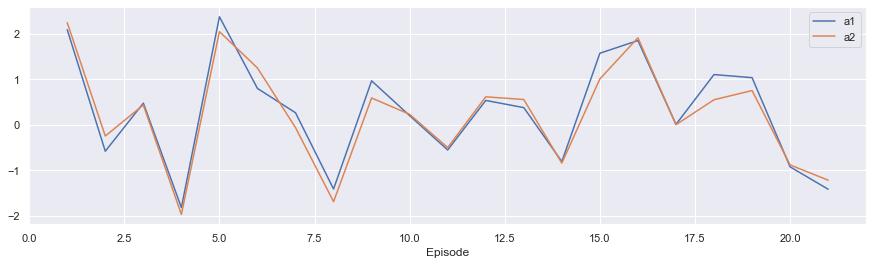

In [343]:
COMPARE.nrc_polarity.loc[1].plot(figsize = (15,4), style = '-')

### Create General Function

In [344]:
#for seasons
def compute_sentiment(ohco_level=1):
    global COMBO_C, SALEXC, OHCO
    # OHCO = COMBO.index.names
    bag = OHCO[:ohco_level]
    DOC = COMBO_C.groupby(bag).term_str.count().to_frame('n')
    DOC_SENTS = (COMBO_C.groupby(bag)[SALEXC.columns].sum().T / DOC.n).T
    # DOC_SENTS = COMBO.groupby(bag)[SALEX.columns].mean(1) # Old way
    return DOC_SENTS

In [345]:
SENTENCE = compute_sentiment(-1) #used a "CORPUS" in picking hyperparameters section that comes next

In [346]:
#COMBO_SHOW

In [347]:
#for show
def compute_sentiment_show(ohco_level=1):
    global COMBO_SHOW, SALEXC, OHCO_SHOW
    # OHCO = COMBO.index.names
    bag = OHCO_SHOW[:ohco_level]
    DOC = COMBO_SHOW.groupby(bag).term_str.count().to_frame('n')
    DOC_SENTS = (COMBO_SHOW.groupby(bag)[SALEXC.columns].sum().T / DOC.n).T
    # DOC_SENTS = COMBO.groupby(bag)[SALEX.columns].mean(1) # Old way
    return DOC_SENTS

In [348]:
SENTENCE_SHOW = compute_sentiment_show(-1)

### Jockers' revised DCT function
Discrete Cosine Transform. A DCT is a Fourier-related transform similar to the discrete Fourier transform (DFT), but using only real numbers

In [349]:
def get_dct_transform(raw_values, 
                      low_pass_size=5, 
                      x_reverse_len=100,
                      dct_type=3):
    if low_pass_size > len(raw_values):
        raise ValueError("low_pass_size must be less than or equal to the length of raw_values input vector")
    values_dct = fftpack.dct(raw_values, type = dct_type) # 2 or 3 works well
    keepers = values_dct[:low_pass_size]
    padded_keepers = list(keepers) + list(np.zeros(x_reverse_len - low_pass_size))
    dct_out = fftpack.idct(padded_keepers)
    return dct_out

## Picking Hyperparameters

Raf's suggestion:  
- smoothing function = DCT  
- DCT type = 3  
- Sentiment functions = **syu_sentiment**, nrc_polarity, and bing_polarity  
- Sentiment norming = None

### Function to visualize single feature

In [350]:
def visualize_single(season, 
                     sent_col = 'nrc_polarity',
                     low_pass_size=5, 
                     x_reverse_len=100, 
                     dct_type=3,
                     norm=None
                    ):
    global SENTENCE
    season_num = season 
    SEASON = SENTENCE.loc[season] 

    X = SEASON[sent_col].values
    X = get_dct_transform(X, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    X = (X - X.mean()) / X.std()

    plot_title = f"S{season_num}: {sent_col} (DCT)"
    ax = pd.Series(X).plot(figsize=(10, 3), legend=False, fontsize=16);
    ax.set_title(plot_title, fontsize=20)
    plt.tight_layout()

In [351]:
def visualize_three(season,
                     low_pass_size=5, 
                     x_reverse_len=100, 
                     dct_type=3,
                     norm=None
                    ):
    #plot three seperate sentiment signals
    global SENTENCE
    season_num = season 
    SEASON = SENTENCE.loc[season] 

    #nrc_polarity
    X = SEASON['nrc_polarity'].values
    X = get_dct_transform(X, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    X = (X - X.mean()) / X.std()
    
    #syu_sentiment
    Y = SEASON['syu_sentiment'].values
    Y = get_dct_transform(Y, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Y = (Y - Y.mean()) / Y.std()
    
    #bing_sentiment
    Z = SEASON['bing_sentiment'].values
    Z = get_dct_transform(Z, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Z = (Z - Z.mean()) / Z.std()

    fig, axes = plt.subplots(nrows = 3, 
                             ncols = 1, 
                             figsize = (10,10),
                            )
    plt.tight_layout(pad = 3) #space between plots
    axes[0].plot(pd.Series(X), color = "blue")
    axes[0].set_title(f"Season {season}: nrc_polarity", fontsize = 16)
    axes[1].plot(pd.Series(Y), color = "orange")
    axes[1].set_title(f"Season {season}: syu_sentiment", fontsize = 16)
    axes[2].plot(pd.Series(Z), color = "black")
    axes[2].set_title(f"Season {season}: bing_sentiment", fontsize = 16)
    fig.show()

In [352]:
def visualize_three_v2(season,
                     low_pass_size=5, 
                     x_reverse_len=100, 
                     dct_type=3,
                     norm=None
                    ):
    #plot three sentiment signals in one plot
    global SENTENCE
    season_num = season 
    SEASON = SENTENCE.loc[season] 

    #nrc_polarity
    X = SEASON['nrc_polarity'].values
    X = get_dct_transform(X, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    X = (X - X.mean()) / X.std()
    
    #syu_sentiment
    Y = SEASON['syu_sentiment'].values
    Y = get_dct_transform(Y, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Y = (Y - Y.mean()) / Y.std()
    
    #bing_sentiment
    Z = SEASON['bing_sentiment'].values
    Z = get_dct_transform(Z, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Z = (Z - Z.mean()) / Z.std()

    fig, ax = plt.subplots(figsize = (12,6))
    ax.plot(pd.Series(X), color = "blue", label = "nrc_polarity", linestyle = 'dotted')
    ax.plot(pd.Series(Y), color = "orange", label = "syu_sentiment")
    ax.plot(pd.Series(Z), color = "black", label = "bing_sentiment", linestyle = "dashdot")
    ax.set_title(f"Season {season} Sentiment Variation", fontsize = 16) #add title with Season num
    plt.grid(False) #remove gridlines
    plt.axhline(y = 0, color = "grey", linestyle = "--")
    leg = ax.legend() #include a legend
    fig.show()

<ipython-input-352-17ebd97e4989>:35: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



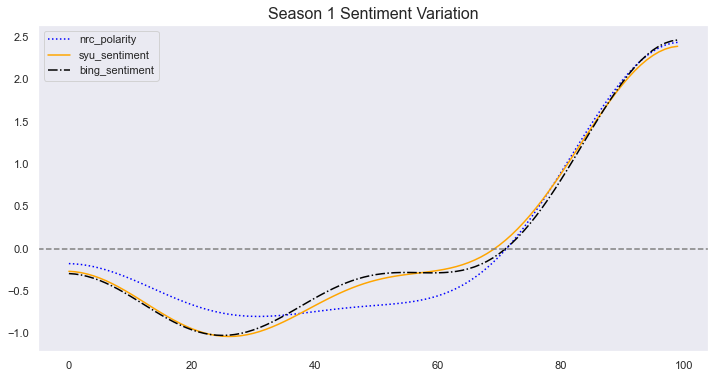

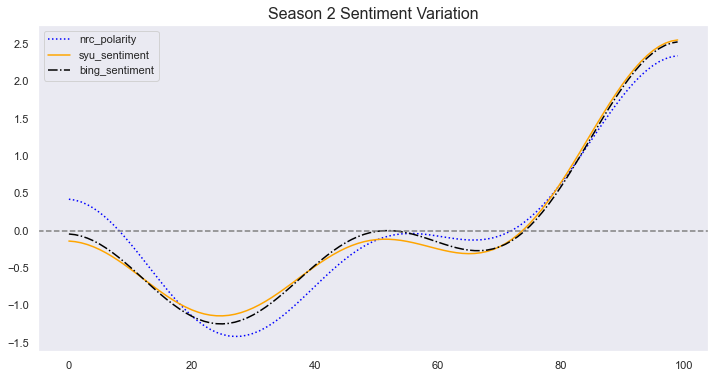

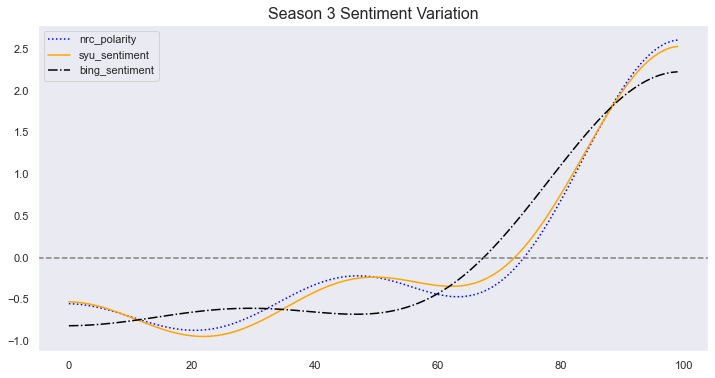

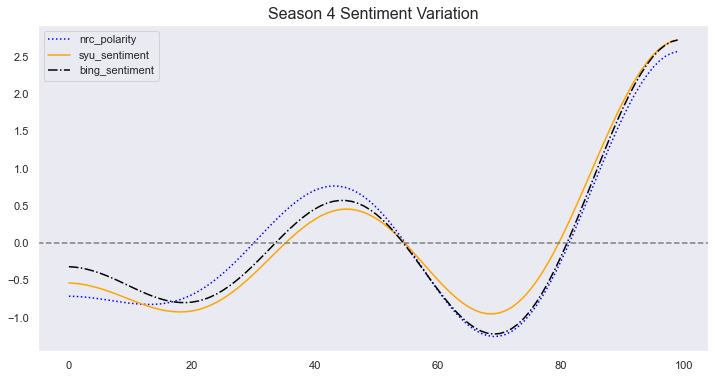

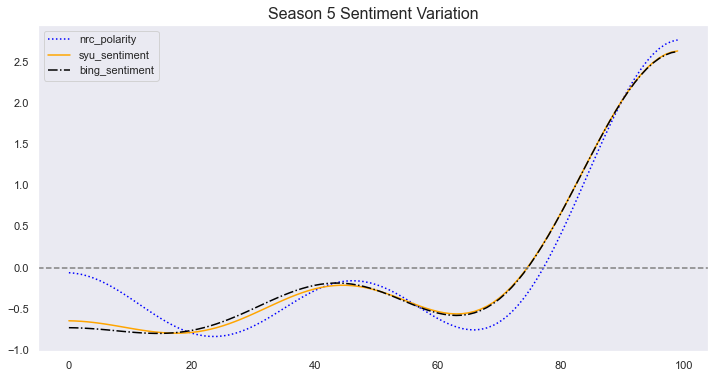

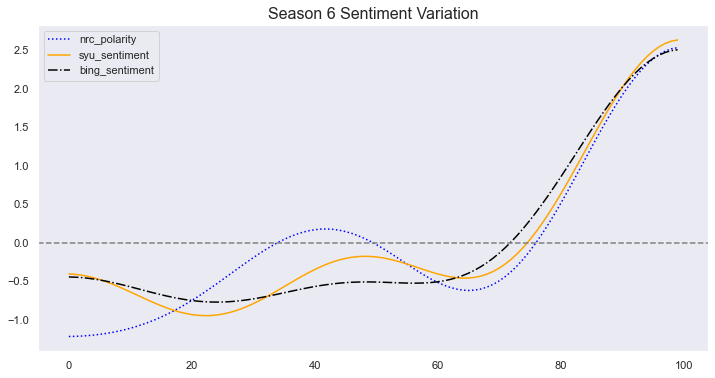

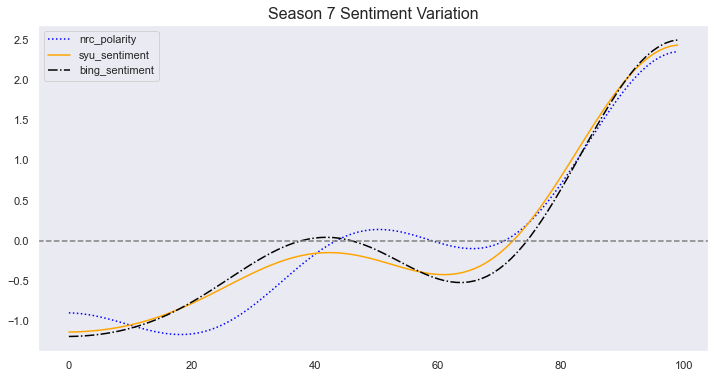

In [353]:
seas1 = visualize_three_v2(1)
seas2 = visualize_three_v2(2)
seas3 = visualize_three_v2(3)
seas4 = visualize_three_v2(4)
seas5 = visualize_three_v2(5)
seas6 = visualize_three_v2(6)
seas7 = visualize_three_v2(7)

Pattern:  
More or less, all three methods produce the same pattern. Not only that but we consistently see patterns for all season that start out low and end high.  
**Season 4** has the biggest mid-season dip. All of the seasons seem to have some sort of dip in the middle of season.  
If I had to pick one, I would go with **syu_sentiment** because it either follows one of the other two very well or is the average between the two.  

In [354]:
def visualize_three_show(show,
                     low_pass_size=5, 
                     x_reverse_len=100, 
                     dct_type=3,
                     norm=None
                    ):
    #plot three sentiment signals in one plot
    global SENTENCE_SHOW
    show_name = show
    SHOW = SENTENCE_SHOW.loc[show] 

    #nrc_polarity
    X = SHOW['nrc_polarity'].values
    X = get_dct_transform(X, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    X = (X - X.mean()) / X.std()
    
    #syu_sentiment
    Y = SHOW['syu_sentiment'].values
    Y = get_dct_transform(Y, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Y = (Y - Y.mean()) / Y.std()
    
    #bing_sentiment
    Z = SHOW['bing_sentiment'].values
    Z = get_dct_transform(Z, low_pass_size=low_pass_size, x_reverse_len=x_reverse_len, dct_type=dct_type)
    Z = (Z - Z.mean()) / Z.std()

    fig, ax = plt.subplots(figsize = (12,6))
    ax.plot(pd.Series(X), color = "blue", label = "nrc_polarity", linestyle = 'dotted')
    ax.plot(pd.Series(Y), color = "orange", label = "syu_sentiment")
    ax.plot(pd.Series(Z), color = "black", label = "bing_sentiment", linestyle = "dashdot")
    ax.set_title(f"Show {show} Sentiment Variation", fontsize = 16) #add title with Season num
    plt.grid(False) #remove gridlines
    plt.axhline(y = 0, color = "grey", linestyle = "--")
    leg = ax.legend() #include a legend
    fig.show()

<ipython-input-354-7a7585426530>:35: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



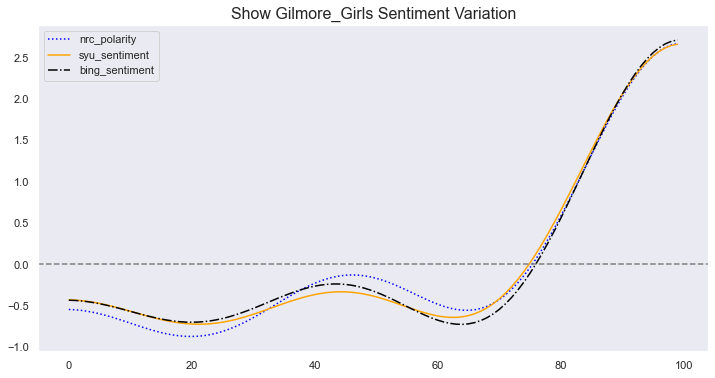

In [355]:
#sentiment for the entire show
visualize_three_show('Gilmore_Girls')

In [507]:
SENTENCE_SHOW

nrc_anger  \
Show          Season Episode line_num Character sent_num              
Gilmore_Girls 1      1       5        LORELAI   0               0.0   
                                                1               0.0   
                             6        LUKE      0               0.0   
                             7        LORELAI   0               0.0   
                             8        LUKE      0               0.0   
...                                                             ...   
              7      22      807      RORY      0               0.0   
                             808      LORELAI   0               0.0   
                             809      RORY      0               0.0   
                             810      LORELAI   0               0.0   
                             811      RORY      0               0.0   

                                                          nrc_anticipation  \
Show          Season Episode line_num Character sent_num                     
Gilmore_Girls 1      1       5        LORELAI   0                      0.0   
                                                1                      0.0   
                             6        LUKE      0                      0.0   
                             7        LORELAI   0                      0.0   
                             8        LUKE      0                      0.0   
...                                                                    ...   
              7      22      807      RORY      0                      0.0   
                             808      LORELAI   0                      0.0   
                             809      RORY      0                      0.0   
                             810      LORELAI   0                      0.0   
                             811      RORY      0                      0.0   

                                                          nrc_disgust  \
Show          Season Episode line_num Character sent_num                
Gilmore_Girls 1      1       5        LORELAI   0                 0.0   
                                                1                 0.0   
                             6        LUKE      0                 0.0   
                             7        LORELAI   0                 0.0   
                             8        LUKE      0                 0.0   
...                                                               ...   
              7      22      807      RORY      0                 0.0   
                             808      LORELAI   0                 0.0   
                             809      RORY      0                 0.0   
                             810      LORELAI   0                 0.0   
                             811      RORY      0                 0.0   

                                                          nrc_fear   nrc_joy  \
Show          Season Episode line_num Character sent_num                       
Gilmore_Girls 1      1       5        LORELAI   0              0.0  0.000000   
                                                1              0.0  0.000000   
                             6        LUKE      0              0.0  0.000000   
                             7        LORELAI   0              0.0  0.000000   
                             8        LUKE      0              0.0  0.000000   
...                                                            ...       ...   
              7      22      807      RORY      0              0.0  0.166667   
                             808      LORELAI   0              0.0  0.000000   
                             809      RORY      0              0.0  0.000000   
                             810      LORELAI   0              0.0  0.000000   
                             811      RORY      0              0.0  0.000000   

                                                          nrc_negative  \
Show          Season Episode line_num Character sent_n

# Extra Fun Stuff :)

## Dispursion of Food References

In [615]:
food = 'coffee pizza pizzas burger burgers cheese cheeseburger cheeseburgers chinese al als pancake world pancakes taco tacos burrito burritos twizzlers redvines vines ice cream creme toast bread fries snacks scones takeout sausage bacon frozen dinner pop tarts tart poptart poptarts popcorn candy chocolate punch donut donuts doughnut doughnuts'.split()
food2 = 'coffee chocolate candy pizza fries cheese ice cream burgers pancakes chinese'.split()

In [561]:
TOKENS

pos_tuple   pos  \
Season Episode line_num Character sent_num token_num                           
1      1       5        LORELAI   0        0          ('Please', 'VB')    VB   
                                           1            ('Luke', 'NN')    NN   
                                  1        0          ('Please', 'VB')    VB   
                                           1          ('please', 'NN')    NN   
                                           2          ('please', 'NN')    NN   
...                                                                ...   ...   
7      22      810      LORELAI   0        8          ('your', 'PRP$')  PRP$   
                                           9           ('stuff', 'NN')    NN   
               811      RORY      0        0              ('I', 'PRP')   PRP   
                                           1           ('guess', 'NN')    NN   
                                           2              ('so', 'RB')    RB   

                                                     token_str term_str  \
Season Episode line_num Character sent_num token_num                      
1      1       5        LORELAI   0        0            Please   please   
                                           1              Luke     luke   
                                  1        0            Please   please   
                                           1            please   please   
                                           2            please   please   
...                                                        ...      ...   
7      22      810      LORELAI   0        8              your     your   
                                           9             stuff    stuff   
               811      RORY      0        0                 I        i   
                                           1             guess    guess   
                                           2                so       so   

                                                     pos_group  
Season Episode line_num Character sent_num token_num            
1      1       5        LORELAI   0        0                VB  
                                           1                NN  
                                  1        0                VB  
                                           1                NN  
                                           2                NN  
...                                                        ...  
7      22      810      LORELAI   0        8                PR  
                                           9                NN  
               811      RORY      0        0                PR  
                                           1                NN  
                                           2                RB  

[1162313 rows x 5 columns]

In [357]:
#dispersion plot
def word_plot(term_str):
    global TOKENS
    (TOKENS.term_str == term_str)\
        .reset_index(drop=True).astype('int')\
        .to_frame(term_str)\
        .plot(figsize=(20, .5), legend=False, title=term_str)

In [442]:
#coffee is DEFINITELY important to the Gilmores ;)
# word_plot('coffee')
# word_plot('pizza')
# word_plot('salad')
# word_plot('popcorn')
# word_plot('pancake')
# word_plot('doughnut')
# word_plot('donut')
# word_plot('bacon')
# word_plot('toast')
# word_plot('tart')
# word_plot('chinese')
# word_plot('taco')

In [443]:
## Explore Lorelai's love interests
B = TOKENS['term_str'].reset_index(drop=True).to_frame().reset_index().rename(columns={'index':'offset'})
B

,offset,term_str
0,0,please
1,1,luke
2,2,please
3,3,please
4,4,please
...,...,...
1162308,1162308,your
1162309,1162309,stuff
1162310,1162310,i
1162311,1162311,guess


In [614]:
#dispersion plot
def plot_words(words, book):
    X = book[book.term_str.isin(words)]
    plt.figure(figsize=(22, len(words)))
    ax = sns.stripplot(y='term_str', x='offset', data=X, orient='h', marker=".", color='navy', size=15, jitter=0)
    ax.set_title('Dispersion Plots: Favorite Foods', size=30, pad=20)
    ax.set_xlabel('Narrative Time', size=20)
    ax.set_ylabel('Term', size=20)
    plt.xticks(rotation=0, fontsize=20)
    plt.yticks(rotation=0, fontsize=20)
    plt.tight_layout()
    plt.show()

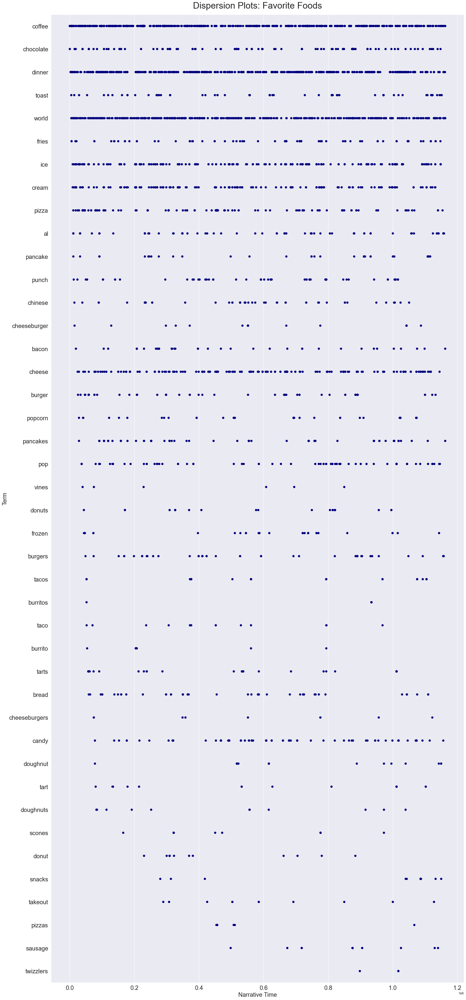

In [616]:
plot_words(food, B)

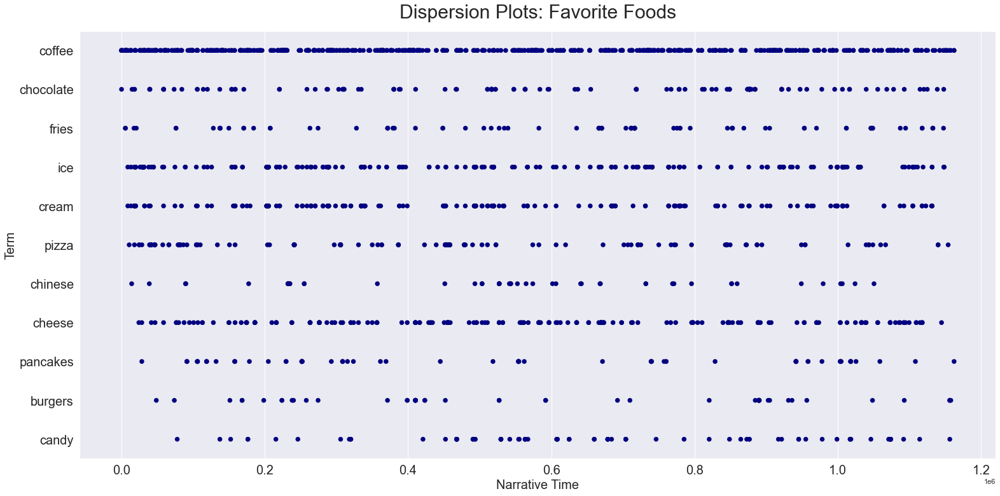

In [617]:
#subset of favorite foods
plot_words(food2, B)

## Most Common phrases by Character

In [383]:
#bigrams
VOCAB_BIGRAM_CHAR = pd.read_csv(f"{data_home}/output/{data_prefix}-VOCAB-CHAR-BIGRAM.csv").set_index('term_str') #sklearn vocab table
BOW_BIGRAM_CHAR = pd.read_csv(f"{data_home}/output/{data_prefix}-BOW-CHAR-BIGRAM.csv").set_index(EPI+['term_str']) #using sklearn (BOW is Season, Episode and using only unigrams)

In [384]:
VOCAB_BIGRAM_CHAR

,n,n_chars,n_tokens,tfidf_mean,df,dfidf
term_str,,,,,,
00 00,5,5,2,0.000027,5,72.604321
00 morning,16,10,2,0.000091,16,205.484676
000 years,4,9,2,0.000023,4,59.371169
10 00,16,5,2,0.000090,14,182.496123
10 30,4,5,2,0.000021,4,59.371169
...,...,...,...,...,...,...
young woman,5,11,2,0.000034,5,72.604321
zach brian,7,10,2,0.000047,6,85.546979
zach don,5,8,2,0.000030,5,72.604321


In [385]:
BOW_BIGRAM_CHAR

line_num Character    n     tfidf
Season Episode term_str                                         
1      1       ve got                14   LORELAI  1.0  1.000000
               look really           18      JOEY  1.0  0.614003
               make look             18      JOEY  1.0  0.630740
               really good           18      JOEY  1.0  0.474518
               good best             19   LORELAI  1.0  0.701445
...                                 ...       ...  ...       ...
7      22      world greatest       808   LORELAI  1.0  0.765277
               don know             809      RORY  1.0  1.000000
               guess ll             810   LORELAI  1.0  0.569572
               just read            810   LORELAI  1.0  0.671096
               ll just              810   LORELAI  1.0  0.474572

[102716 rows x 4 columns]

In [390]:
#groupby character and terms
BIGRAMS = pd.DataFrame(BOW_BIGRAM_CHAR.groupby(['Character','term_str'])['n'].sum())

In [421]:
#reduce to 14 main characters
BIGRAMS_MAIN = BIGRAMS.loc[main_characters]
BIGRAMS_MAIN

n
Character term_str           
DEAN      accept apology  1.0
          actually going  1.0
          actually gonna  1.0
          actually got    1.0
          actually kind   1.0
...                       ...
LUKE      yes ve          2.0
          yes yes         1.0
          young lady      1.0
          young people    1.0
          zach zach       3.0

[35980 rows x 1 columns]

In [399]:
main_characters

['DEAN',
 'EMILY',
 'MICHEL',
 'PARIS',
 'JASON',
 'JESS',
 'RICHARD',
 'RORY',
 'KIRK',
 'SOOKIE',
 'LANE',
 'LOGAN',
 'LORELAI',
 'LUKE']

In [556]:
#number of bigrams to show in plots
n_bigrams = 15

In [557]:
dean_b = BIGRAMS_MAIN.loc['DEAN'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
emily_b = BIGRAMS_MAIN.loc['EMILY'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
michel_b = BIGRAMS_MAIN.loc['MICHEL'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
paris_b = BIGRAMS_MAIN.loc['PARIS'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
jason_b = BIGRAMS_MAIN.loc['JASON'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
jess_b = BIGRAMS_MAIN.loc['JESS'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
richard_b = BIGRAMS_MAIN.loc['RICHARD'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
rory_b = BIGRAMS_MAIN.loc['RORY'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
kirk_b = BIGRAMS_MAIN.loc['KIRK'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
sookie_b = BIGRAMS_MAIN.loc['SOOKIE'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
lane_b = BIGRAMS_MAIN.loc['LANE'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
logan_b = BIGRAMS_MAIN.loc['LOGAN'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
lorelai_b = BIGRAMS_MAIN.loc['LORELAI'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')
luke_b = BIGRAMS_MAIN.loc['LUKE'].sort_values('n', ascending = False).head(n_bigrams).reset_index().sort_values('n')

<ipython-input-560-6972db73e5ce>:48: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



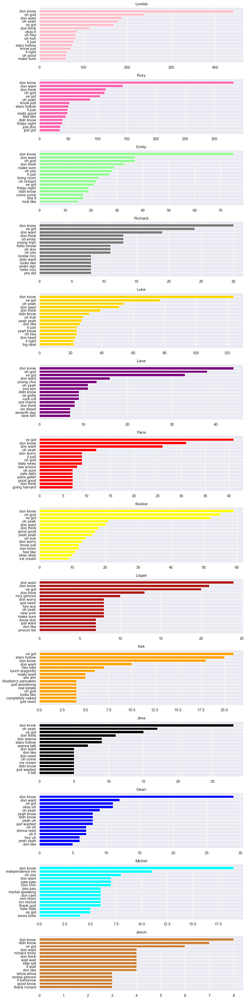

In [560]:
#plot the top bigrams for each main character
fig, axes = plt.subplots(nrows = 14, ncols = 1, figsize = (10,40))
plt.tight_layout(pad = 3) #space between plots
axes[0].barh(lorelai_b['term_str'],lorelai_b['n'], color = "pink")
axes[0].set_title('Lorelai')

axes[1].barh(rory_b['term_str'],rory_b['n'], color = "hotpink")
axes[1].set_title('Rory')

axes[2].barh(emily_b['term_str'],emily_b['n'], color = "palegreen")
axes[2].set_title('Emily')

axes[3].barh(richard_b['term_str'],richard_b['n'], color = "grey")
axes[3].set_title('Richard')

axes[4].barh(luke_b['term_str'],luke_b['n'], color = "gold")
axes[4].set_title('Luke')

axes[5].barh(lane_b['term_str'],lane_b['n'], color = "purple")
axes[5].set_title('Lane')

axes[6].barh(paris_b['term_str'],paris_b['n'], color = "red")
axes[6].set_title('Paris')

axes[7].barh(sookie_b['term_str'],sookie_b['n'], color = "yellow")
axes[7].set_title('Sookie')

axes[8].barh(logan_b['term_str'],logan_b['n'], color = "firebrick")
axes[8].set_title('Logan')

axes[9].barh(kirk_b['term_str'],kirk_b['n'], color = "orange")
axes[9].set_title('Kirk')

axes[10].barh(jess_b['term_str'],jess_b['n'], color = "black")
axes[10].set_title('Jess')

axes[11].barh(dean_b['term_str'],dean_b['n'], color = "blue")
axes[11].set_title('Dean')

axes[12].barh(michel_b['term_str'],michel_b['n'], color = "cyan")
axes[12].set_title('Michel')

axes[13].barh(jason_b['term_str'],jason_b['n'], color = "peru")
axes[13].set_title('Jason')

fig.tight_layout()
fig.show()